# Set up environment

In [1]:
import anndata as ad
import ast
import copy
import geopandas as gpd
import gseapy
import importlib
import itertools
from math import sqrt
import matplotlib as mpl
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
from multiprocessing import Pool
import numpy as np
import os
import pandas as pd
import pickle5 as pkl
import random
import scanpy as sc
import scipy
from scipy import spatial
from scipy.spatial import cKDTree
from scipy.spatial import distance
from scipy.stats import fisher_exact, ks_2samp
from sklearn.cluster import KMeans
import seaborn as sns
from shapely.geometry import Point
import skbio
import slide_tcr_functions
from statistics import mean, stdev
import statsmodels.stats
from statsmodels.stats import multitest
import sys
from tqdm import tqdm

from alphashape import alphashape
from collections import Counter
from functools import partial
from libpysal.weights import KNN
from matplotlib.collections import PatchCollection
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from perm_test_functions import perm_test_to_final_plot
from plotting_functions import gaussian_heat_plot, plot_cortex_medulla
from shapely.geometry import Point
from slide_tcr_functions import (
    PuckReplicate,
    save_puck,
    load_puck,
    make_puck,
    make_adata,
    load_adata,
    pkl_load,
    pkl_dump,
    download_data,
)
from statsmodels import stats
from tcr_mapping import tcr_mapping, get_barcode_position, build_6mer_dist, barcode_matching

# Set directory paths
directory = './scratch/publication/'  # Directory with all data
directory_slideseq = './scratch/publication'  # Slide-seq directory

# Set plotting parameters
fontprops = fm.FontProperties(size=18)
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams['ps.fonttype'] = 42

pixels_needed = 500 / 0.65

# # Reload modules for development purposes
# def reload_module(module):
#     importlib.reload(module)

# # Reload plotting module
# reload_module(importlib.import_module('perm_test_functions'))
# reload_module(importlib.import_module('slide_tcr_functions'))


In [2]:
# Load sample information from Google Sheets
spreadsheet_key = '1wvjq3GM6RGg-uZY8_LhNsjET-XOsPoQ1yH3cnhVWAdk'
xls = pd.ExcelFile(f"https://docs.google.com/spreadsheets/d/{spreadsheet_key}/export?format=xlsx")
master_df = pd.read_excel(xls, 'Slide-TCR-seq', header=1)

# Filter out rows with missing puck names
puck_name_col = 'NovaSeq alignment directory'
master_filt = master_df[~master_df[puck_name_col].isnull()]

# Initialize dictionaries and lists
csv_name_to_puck_name = {}
puck_name_to_timepoint = {}
age_to_ss = {}
puck_to_time = {}
csv_names = []

# Process rows in the master dataframe
for index, row in master_df.iterrows():
    puck_name = row[puck_name_col]
    age = row['Sample Age']
    sample_type = row['Lobe']

    # Skip human samples and non-Mouse_aging analysis types
    if sample_type == 'Human' or row['Analysis Type'] != 'Mouse_aging':
        continue

    # Skip rows with specified Barcodes to TCR csv values
    if row['Barcodes to TCR csv '] in ['in puck folder', 'merge_complete']:
        csv_name = f'{puck_name[11:25]}_B.csv'

        # Populate dictionaries and lists
        csv_name_to_puck_name[csv_name] = puck_name
        csv_names.append(csv_name)
        puck_name_to_timepoint[puck_name] = age

        if age not in age_to_ss:
            age_to_ss[age] = []
        age_to_ss[age].append(row[puck_name_col])
        puck_to_time[puck_name] = age

# Define mappings and orderings
time_to_puck = {puck_to_time[i]: i for i in puck_to_time}

# Define timepoints, day mappings, and puck names

tpt_to_pn = {
    i: j
    for i, j in zip(master_df['Sample Age'],
                    master_df['NovaSeq alignment directory'])
}
tpt_order = [
    '0 day', '1 day', '2 day', '3 day', '4 day', '5 day', '7 day', '10 day',
    '13 day', '3wks', '4 wks', '5 wks', '7wks', '9 wks', '13 wks', '15wks',
    '28wks', '32wks', '48 wks', '68 wks', '90wks'
]

timepoints = [
    '1 day', '2 day', '3 day', '4 day', '5 day', '7 day', '10 day', '13 day',
    '3wks', '4 wks', '5 wks', '7wks', '9 wks', '13 wks', '15wks', '28wks',
    '32wks', '48 wks', '68 wks', '90wks'
]
tpt_to_day = {
    '0 day': 0,
    '1 day': 1,
    '2 day': 2,
    '3 day': 3,
    '4 day': 4,
    '5 day': 5,
    '7 day': 7,
    '10 day': 10,
    '13 day': 13,
    '3wks': 3 * 7,
    '4 wks': 4 * 7,
    '5 wks': 5 * 7,
    '7wks': 7 * 7,
    '9 wks': 9 * 7,
    '13 wks': 13 * 7,
    '15wks': 15 * 7,
    '28wks': 28 * 7,
    '32wks': 32 * 7,
    '48 wks': 48 * 7,
    '68 wks': 68 * 7,
    '90wks': 90 * 7
}

puck_names = ["2023-01-24_Puck_221024_23", # 0 day
                      "2022-11-23_Puck_221024_24", # 0 day
                "2022-11-23_Puck_221024_31", # 1 day
                      "2023-01-16_Puck_221024_27", # 1 day
                      "2022-11-23_Puck_221024_34", # 2 day
                      "2023-01-24_Puck_221024_33", # 2 day
                      "2023-01-24_Puck_221024_36", # 2 day
                      "2022-11-23_Puck_221024_38", # 3 day
                      "2023-01-24_Puck_221024_37", # 3 day
                      "2023-01-24_Puck_221024_39", # 3 day
                      "2023-01-24_Puck_221103_09", # 4 day
                      "2023-01-24_Puck_221103_12", # 4 day
                      "2023-01-24_Puck_221019_08", # 5 day
                      "2023-01-24_Puck_221019_05", # 5 day
                      "2023-01-24_Puck_221019_10", # 7 day
                      "2023-01-24_Puck_221019_14", # 7 day
                      "2022-12-16_Puck_221006_22_trunc", # 10 day
                      "2023-01-24_Puck_221006_23", # 10 day
                      "2022-12-16_Puck_221011_32_trunc", # 13 day
                      "2022-12-16_Puck_221011_33_trunc", # 13 day
                      "2023-01-24_Puck_221118_38", # 3 weeks
                      "2023-01-24_Puck_221118_39", # 3 weeks
                      "2023-01-24_Puck_221103_22", # 4 weeks
                      "2023-01-24_Puck_221118_40", # 4 weeks
                      "2023-01-24_Puck_220930_18", # 5 weeks
                      "2023-01-24_Puck_220930_20", # 5 weeks
                      "2023-01-24_Puck_220930_22", # 5 weeks
                      "2023-01-24_Puck_220930_23", # 7 weeks
                      "2023-01-24_Puck_220930_28", # 7 weeks
                      "2023-01-24_Puck_221011_37", # 9 weeks
                      "2023-01-24_Puck_221011_39", # 9 weeks
                      "2023-01-24_Puck_221011_12", # 13 weeks
                      "2023-01-24_Puck_221011_13", # 13 weeks
                      "2022-11-04_Puck_221006_24", # 15 week
                      "2022-12-16_Puck_221006_26_trunc", # 15 week
                      "2022-11-04_Puck_221006_29", # 28 week
                      "2022-12-16_Puck_221006_35_trunc", # 28 week
                      "2022-11-04_Puck_220930_32", # 32 week
                      "2022-12-16_Puck_220930_29_trunc", # 32 week
                      "2023-01-24_Puck_220930_35", # 32 week
                      "2023-01-24_Puck_221014_37", # 48 week
                      "2023-01-24_Puck_221019_03", # 48 week
                      "2022-12-16_Puck_221011_19_trunc", # 68 week
                      "2022-12-16_Puck_221011_20_trunc", # 68 week
                      "2023-01-24_Puck_221006_32", # 68 week
                      "2022-12-16_Puck_220930_37_trunc", # 90 week
                      "2022-12-16_Puck_220930_38_trunc"] # 90 week

puck_times = [0,0,1,1,2,2,2,3,3,3,4,4,5,5,7,7,10,10,13,13,3*7,3*7,4*7,4*7,5*7,5*7,5*7,
              7*7,7*7,9*7,9*7,13*7,13*7,15*7,15*7,28*7,28*7,32*7,32*7,32*7,48*7,48*7,68*7,68*7,68*7,90*7,90*7]


puck_name_to_days = dict(zip(puck_names, puck_times))

# Define batch mappings
batch_to_tpt = dict(zip(range(len(puck_times)), puck_times))
batch_to_puck_name = dict(zip(range(len(puck_times)), puck_names))

In [3]:
# csv_name_to_puck_name = {}
# puck_to_time = {}

# for index,row in master_df.iterrows():
#     puck_name = row['NovaSeq alignment directory']
#     age = row['Sample Age']
#     if row['Analysis Type'] != 'Mouse_aging':
#         continue

#     csv_name = f'{puck_name[11:25]}_B.csv'

#     csv_name_to_puck_name[csv_name] = puck_name
#     puck_to_time[puck_name] = age

# time_to_puck = {puck_to_time[i]:i for i in puck_to_time}

# timepoints = ['0 day','1 day','2 day','3 day','4 day','5 day', '7 day','10 day','13 day',
#              '3wks','4 wks','5 wks', '7wks','9 wks','13 wks',
#              '15wks','28wks','32wks','48 wks','68 wks','90wks']
# puck_names = list(puck_to_time.keys())



In [4]:
def calculate_morans_i(x,y,label,label_of_interest):
    # Create a GeoDataFrame
    geometry = [Point(xy) for xy in zip(x, y)]
    gdf = gpd.GeoDataFrame({'x': x, 'y': y, 'label': label}, geometry = geometry)

    # Create spatial weights matrix using K-nearest neighbors
    k = 5  # You can adjust the number of neighbors (k) as needed
    w = KNN.from_dataframe(gdf, k=k)

    # Calculate Moran's I for subset
    moran_ct1 = Moran(gdf['label'].apply(lambda x: 1 if x == label_of_interest else 0), w)

    # Print the Moran's I statistics
    print(f"Moran's I for {label_of_interest} Points:")
    print("I:", moran_ct1.I)
    print("Expected I:", moran_ct1.EI)
    print("p-value:", moran_ct1.p_sim)

    return moran_ct1.I

def find_indices(lst, target_item):
    return [index for index, item in enumerate(lst) if item == target_item]

def dilate_cortex_points(bc_cortex, bc_medulla, bc_loc_dict_s1,
                         loc_to_bc_s1, matched_bead_barcodes, locs_cortex, loc_to_diversity, filt_plot=False):
    """
    Dilate cortex points based on the median diversity of nearby points.

    Parameters:
    - bc_cortex: List of cortex barcodes
    - bc_medulla: List of medulla barcodes
    - bc_loc_dict_s1: Dictionary mapping barcodes to locations
    - loc_to_bc_s1: Dictionary mapping locations to barcodes
    - matched_bead_barcodes: List of matched bead barcodes
    - locs_cortex: List of cortex locations
    - filt_plot: Boolean flag to filter the plot

    Returns:
    - Dictionary mapping cortex locations to diluted diversity values
    """

    # Extract cortex locations
    cortex_locs = [bc_loc_dict_s1[bc] for bc in bc_cortex]

    # Extract all locations (cortex + medulla)
    everywhere_locs = [bc_loc_dict_s1[bc] for bc in bc_medulla + bc_cortex]

    # If there are fewer than 2 cortex locations, skip dilation
    if len(cortex_locs) < 2:
        return 'Skip'

    point_tree = cKDTree(cortex_locs)

    # Create a copy of loc_to_diversity for cortex locations
    cort_loc_to_diversity = copy.deepcopy(loc_to_diversity)

    # Iterative dilation process
    num_iter = 0
    while num_iter != 2:  # Limiting the number of iterations for demonstration (can be adjusted)
        num_iter += 1
        print(f"Iteration: {num_iter}")
        print(f"Number of Cortex Locations: {len(cort_loc_to_diversity)}")

        # Find unassigned cortex locations
        unassigned_cortex_locs = [loc for loc in cortex_locs if loc not in cort_loc_to_diversity]

        # Dilate unassigned cortex locations
        for loc in unassigned_cortex_locs:
            # Find points within a radius of 20 units
            idx_closeby_points = point_tree.query_ball_point(loc, r=20 / 0.65)
            nearest_points = [cortex_locs[idx] for idx in idx_closeby_points]

            # Extract diversity values for nearby points
            div = [cort_loc_to_diversity[i] for i in nearest_points if i in cort_loc_to_diversity]

            # If there are diversity values, assign the median to the current location
            if len(div) > 0:
                cort_loc_to_diversity[loc] = np.median(div)

        # Make a plot
        plot_dilated_cortex(cort_loc_to_diversity, everywhere_locs, cortex_locs, locs_cortex, filt_plot)

    print('Hotspot dilation complete')
    return cort_loc_to_diversity


def plot_dilated_cortex(cort_loc_to_diversity, everywhere_locs, cortex_locs, locs_cortex, filt_plot):
    """
    Plot the dilated cortex.

    Parameters:
    - cort_loc_to_diversity: Dictionary mapping cortex locations to diluted diversity values
    - everywhere_locs: List of all locations (cortex + medulla)
    - cortex_locs: List of cortex locations
    - locs_cortex: List of cortex locations for filtering
    - filt_plot: Boolean flag to filter the plot
    """
    fig, ax = plt.subplots(figsize=(5, 5))

    # Plot everywhere locations in gray
    x2, y2 = zip(*everywhere_locs)
    plt.scatter(x2, y2, c='gray', s=1, alpha=0.05)  # Everywhere

    # Plot cortex locations in gray with higher alpha
    x2, y2 = zip(*cortex_locs)
    plt.scatter(x2, y2, c='gray', s=1, alpha=0.2)

    # Plot diluted cortex locations
    if filt_plot:
        locs_filt, c = zip(*[(loc, c) for loc, c in zip(list(cort_loc_to_diversity.keys()), list(cort_loc_to_diversity.values())) if loc in locs_cortex])
        x, y = zip(*locs_filt)
    else:
        x, y = zip(*list(cort_loc_to_diversity.keys()))
        c = list(cort_loc_to_diversity.values())

    # Scatter plot with color map
    p = plt.scatter(x, y, c=c, s=1, cmap='inferno', vmin=3.3, vmax=5.4)

    # Additional plot settings
    plt.axis('off')
    plt.xlim([0, 5000])
    plt.ylim([0, 5000])
    cb_ax = fig.add_axes([.91, .124, .04, .754])
    fig.colorbar(p, orientation='vertical', cax=cb_ax)
    fontprops = fm.FontProperties(size=18)
    scalebar = AnchoredSizeBar(
        ax.transData,
        pixels_needed,
        "",
        "lower right",
        pad=0.1,
        color="black",
        frameon=False,
        size_vertical=1,
        fontproperties=fontprops,
    )
    ax.add_artist(scalebar)

    plt.show()

def plot_gene_expression_on_pucks(pucks_to_plot, genes_to_plot):
    """
    Plot gene expression on specified pucks for selected genes.

    Parameters:
    - pucks_to_plot: List of puck names to be plotted
    - genes_to_plot: List of gene names to be plotted

    Returns:
    - None
    """
    vmax_calc = {i: [] for i in genes_to_plot}
    vmax_for_genes = {i: 0 for i in genes_to_plot}  # identify 90th percentile
    vmin_calc = {i: [] for i in genes_to_plot}
    vmin_for_genes = {i: 0 for i in genes_to_plot}  # identify 90th percentile
    all_x_agg = {}
    all_y_agg = {}
    all_adata_filt = {}
    all_total_counts = {}

    # Calculate vmax values
    for pn in tqdm(pucks_to_plot):
        if pn not in loaded_pucks:
            with open(f'{directory}{pn}_raw.h5ad', "rb") as handle:
                adata = sc.read_h5ad(handle)
            loaded_pucks[pn] = adata
        else:
            adata = loaded_pucks[pn]
        all_x = adata.obs['x']
        all_y = adata.obs['y']

        all_x_agg[pn] = all_x
        all_y_agg[pn] = all_y

        adata = adata[adata.obs['cortex_medulla'].isin(['cortex', 'medulla'])]  # clean up areas outside tissue
        all_adata_filt[pn] = adata

        total_counts_per_cell = np.sum(adata.X, axis=1)
        all_total_counts[pn] = total_counts_per_cell

        for gene_name in genes_to_plot:
            gene_idx = list(adata.var.index).index(gene_name)
            gene_filt = adata.X[:, gene_idx]
            gene_filt = [i / x * 10000 for i, x in zip(gene_filt, total_counts_per_cell)]

            bc_indices = [index for index, val in enumerate(gene_filt) if val > 0]
            gene_filt = [val for index, val in enumerate(gene_filt) if val > 0]

            vmax_calc[gene_name] = vmax_calc[gene_name] + gene_filt
            vmin_calc[gene_name] = vmin_calc[gene_name] + gene_filt

    # Set percentile for plotting visualization
    vmax_for_genes = {i: np.percentile(vmax_calc[i], 90) for i in vmax_calc}  # Make cutoff 90th percentile of max
    vmin_for_genes = {i: np.percentile(vmin_calc[i], 10) for i in vmin_calc}  # Make cutoff 90th percentile of max

    # Create plots
    plt.figure(figsize=(len(genes_to_plot) * 4, len(pucks_to_plot) * 4))
    plt.subplots_adjust(hspace=0.5)
    plt_cter = 1

    # Make plots
    for pn in tqdm(pucks_to_plot):
        all_x = all_x_agg[pn]
        all_y = all_y_agg[pn]

        adata = all_adata_filt[pn]  # clean up areas outside tissue
        total_counts_per_cell = all_total_counts[pn]

        for gene_name in genes_to_plot:
            ax = plt.subplot(len(pucks_to_plot), len(genes_to_plot), plt_cter)
            ax.scatter(all_x, all_y, c='black', s=1)  # Plot locations in black

            gene_idx = list(adata.var.index).index(gene_name)
            gene_filt = adata.X[:, gene_idx]
            gene_filt = [i / x * 10000 for i, x in zip(gene_filt, total_counts_per_cell)]
            all_len = len(gene_filt)

            bc_indices = [index for index, val in enumerate(gene_filt) if val > 0]
            gene_filt = [val for index, val in enumerate(gene_filt) if val > 0]
            x = [adata.obs['x'][i] for i in bc_indices]
            y = [adata.obs['y'][i] for i in bc_indices]

            vmax_calc[gene_name] = vmax_calc[gene_name] + gene_filt

            vmin = vmin_for_genes[gene_name]
            vmax = vmax_for_genes[gene_name]
            thisfig = ax.scatter(x, y, c=gene_filt, s=1, cmap='viridis', vmin=vmin, vmax=vmax)
            fig.colorbar(thisfig)
            ax.set_title(f"{gene_name} {len(gene_filt)/all_len:.2%}")

            plt_cter += 1
            ax.set_xlim([0, 5000])
            ax.set_ylim([0, 5000])
            ax.set_aspect('equal')

            scalebar = AnchoredSizeBar(
                ax.transData,
                pixels_needed,
                "",
                "lower right",
                pad=0.1,
                color="black",
                frameon=False,
                size_vertical=1,
                fontproperties=fontprops,
            )
            ax.add_artist(scalebar)

    plt.show()

def rolling_average(x, y, title):
    # Create a scatter plot of the data points
    fig, ax = plt.subplots() 
    plt.scatter(x, y)
    
    # Calculate the slope (m) and intercept (b) of the line
    m, b = np.polyfit(np.log10(x), y, 1)

    # Generate x values for the line of best fit
    x_fit = np.linspace(min(x), max(x), 10)

    # Calculate corresponding y values using the equation of the line
    y_fit = m * np.log10(x_fit) + b
    
    # Plot the line of best fit
    plt.plot(x_fit, y_fit, color='red', label=f'Line of Best Fit: y = {m:.2f}x + {b:.2f}')

    # Calculate and display Pearson correlation coefficient and p-value
    stat, pval = scipy.stats.pearsonr(np.log10(timepoints), y)
    plt.title(f'R = {round(stat,2)} | p = {round(pval,5)}')
    
    # Set x-axis scale to logarithmic
    ax.set_xscale('log', base=10)
    ax.set_xticks([20, 100, 500])
    ax.get_xaxis().set_major_formatter(mpl.ticker.ScalarFormatter())
    
    # Save the plot as a PDF file
    plt.savefig(f'{title}_sc_proportion.pdf')

def find_nearest_point_distance(target_point, list_of_points):
    """
    Find the point in a list of points closest to a target point.

    Parameters:
    - target_point (tuple): The target point in the form of (x, y).
    - list_of_points (list of tuples): List of points in the form of [(x1, y1), (x2, y2), ...].

    Returns:
    - nearest_point (tuple): The point in the list closest to the target point.
    - distance_to_nearest (float): The distance between the target point and the nearest point.
    """
    target_point = np.array(target_point)
    
    # Calculate Euclidean distances between the target point and all points in the list
    distances = distance.cdist(target_point, list_of_points, metric='euclidean')
    
    # Find the index of the nearest point
    index_of_nearest = np.argmin(distances)

    # Get the nearest point and its distance to the target point
    nearest_point = list_of_points[index_of_nearest]
    distance_to_nearest = distances[0, index_of_nearest]

    return nearest_point, distance_to_nearest

def calculate_distance_to_boundary(cluster_points, points_of_interest, alpha=0.03, show_plot = False):
    """
    Calculate the distance from each point in a cluster to the boundary of the alpha shape.

    Parameters:
    - cluster_points (list of tuples): List of (x, y) coordinates for the points in the cluster.
    - alpha (float): Alpha parameter for alpha shape. Smaller alpha values will create more detailed shapes.

    Returns:
    - distances (list of floats): List of distances from each point to the boundary.
    - boundary (list of tuples): List of (x, y) coordinates representing the boundary of the alpha shape.
    """

    # Convert the list of tuples to a numpy array for compatibility with alphashape
    points = np.array(cluster_points)
    x,y = zip(*points)
    # Create the alpha shape
    alpha_shape = alphashape(points, alpha=alpha)

    shape_x, shape_y = alpha_shape.exterior.coords.xy
    
    boundary = list(zip(shape_x,shape_y))
    if show_plot:
        plt.figure(figsize=(3,3))
        plt.plot(x, y, 'o', color='black', markersize=6)
        plt.plot(shape_x, shape_y, 'o', color='red', markersize=4)
        plt.xlim([0,5000])
        plt.ylim([0,5000])
        plt.show()
    
    # Calculate the distance from each point to the boundary
    distances = [find_nearest_point_distance([point], boundary) for point in points_of_interest]

    return alpha_shape, distances, boundary

# Plot cell_types
def plot_cell_types(adata, rctd_results, cell_type_list, title, colors=None, point_size=0.5):
    """
    Plot cell types on a spatial map.

    Parameters:
    - adata: AnnData object containing spatial information.
    - rctd_results: DataFrame containing RCTD results.
    - cell_type_list: List of cell types to plot.
    - title: Title of the plot.
    - colors: List of colors for each cell type.
    - point_size: Size of the plotted points.
    """
    if colors is None:
        colors = sns.color_palette('husl', len(cell_type_list))

    fig, ax = plt.subplots(figsize=(5, 5))
    plt.xlim([0, 5000])
    plt.ylim([0, 5000])

    loc_list = zip(adata.obs.x, adata.obs.y)
    bc_to_loc = {i: j for i, j in zip(adata.obs.index, loc_list)}

    # Filter data for cortex and medulla regions
    adata_filt = adata[adata.obs.cortex_medulla.isin(['cortex', 'medulla'])]
    all_x, all_y = [adata_filt.obs.x, adata_filt.obs.y]
    plt.scatter(all_x, all_y, alpha=0.025, color='gray', s=1)

    # Plot each cell type
    for idx in range(len(cell_type_list)):
        ct = cell_type_list[idx]
        bcs = rctd_results[rctd_results['first_type'] == ct]['Unnamed: 0']
        bcs = [i[:-2] + '-1' for i in bcs if i[:-2] + '-1' in adata_filt.obs.index]
        locs = [bc_to_loc[i] for i in bcs]
        x, y = zip(*locs)
        plt.scatter(x, y, s=point_size, c=colors[idx], label=ct)

    # Add scale bar
    scalebar = AnchoredSizeBar(
        ax.transData,
        pixels_needed,
        "",
        "lower right",
        pad=0.1,
        color="black",
        frameon=False,
        size_vertical=1,
        fontproperties=fontprops,
    )
    ax.add_artist(scalebar)

    plt.title(title)
    plt.legend()
    plt.show()

# Establish time point groupings
def create_bins_dict(time_points,num_bins = 10, correct_timepoints = True): # default is deciles # correct timepoints makes sure the same time point is in the same decile
    # Sort the time points in ascending order
    sorted_time_points = sorted(time_points)
    
    # Calculate the indices for deciles
    decile_indices = [int(len(sorted_time_points) * i / num_bins) for i in range(num_bins)]
    
    # Create the dictionary of deciles
    deciles_dict = {}
    
    for i in range(num_bins):
        decile_key = f'Decile {i+1}'
        if i < num_bins-1:
            decile_values = sorted_time_points[decile_indices[i]:decile_indices[i+1]]
        else:
            decile_values = sorted_time_points[decile_indices[i]:]
        deciles_dict[decile_key] = decile_values
    # Add the last decile separately
    deciles_dict[f'Decile {num_bins}'] = sorted_time_points[decile_indices[-1]:]
    
    if correct_timepoints:
        deciles_dict_corrected = {}
        for i in range(num_bins):
            decile_key = f'Decile {i+1}'
            decile_key_old = f'Decile {i}'
            if i == 0:
                deciles_dict_corrected[decile_key] = deciles_dict[decile_key]
                continue
            else:
                new = deciles_dict[decile_key]
                old = deciles_dict_corrected[decile_key_old]
                old_updated = old + [i for i in new if i in old] 
                new_updated =  [i for i in new if i not in old]
                
                deciles_dict_corrected[decile_key_old] = old_updated
                deciles_dict_corrected[decile_key] = new_updated
        deciles_dict = deciles_dict_corrected
            
            
    return deciles_dict

def subset_adata(adata, age, location):
    """
    Filter the input AnnData object based on age and location.

    Parameters:
        adata (AnnData): The input AnnData object.
        age (str): Age category ('young' or 'old').
        location (str): Location category ('cortex' or 'medulla').

    Returns:
        adata_filt (AnnData): Filtered AnnData object based on age and location.
    """
    # Filter AnnData based on age
    adata_filt = adata[adata.obs['Age'].isin(age)]
    # Further filter based on location
    adata_filt = adata_filt[adata_filt.obs['cortex_medulla'] == location]
    return adata_filt

def young_old_props(adata):
    """
    Calculate cell type proportions for young and old samples.

    Parameters:
        adata (AnnData): The input AnnData object.

    Returns:
        young (list): List of dictionaries containing cell type proportions for young samples.
        old (list): List of dictionaries containing cell type proportions for old samples.
    """
    young = []
    old = []
    for age in tqdm(set(adata.obs['Age'])):
        # Subset AnnData for the specific age
        adata_filt_age = adata[adata.obs['Age'] == age]
        # Calculate cell type proportions
        cter = Counter(adata_filt_age.obs['Cell_type'])
        cter_norm = {i: cter[i] / sum(cter.values()) for i in cter}
        # Append proportions to young or old based on age category
        if age in young_ages:
            young.append(cter_norm)
        elif age in old_ages:
            old.append(cter_norm)
        else:
            print('Unexpected age category')
    return young, old

def cohens_d(c0, c1):
    """
    Calculate Cohen's d effect size.

    Parameters:
        c0 (list): Values for group 0.
        c1 (list): Values for group 1.

    Returns:
        cohens_d (float): Cohen's d effect size.
    """
    cohens_d = (mean(c0) - mean(c1)) / (sqrt((stdev(c0) ** 2 + stdev(c1) ** 2) / 2))
    return cohens_d

def find_cohens_d_by_ct(adata, young, old):
    """
    Find Cohen's d effect size by cell type.

    Parameters:
        adata (AnnData): The input AnnData object.
        young (list): List of dictionaries containing cell type proportions for young samples.
        old (list): List of dictionaries containing cell type proportions for old samples.

    Returns:
        ct (list): List of cell types sorted by Cohen's d effect size.
        vals (list): List of Cohen's d effect sizes sorted by magnitude.
        pvals (dict): Dictionary of p-values for t-tests between young and old samples for each cell type.
    """
    cohens_d_by_cell_type = {}
    pvals = {}
    for cell_type in tqdm(set(adata_filt.obs['Cell_type'])):
        # Get proportions for young and old samples for the current cell type
        young_cell_type_prop = [i[cell_type] for i in young if cell_type in i]
        old_cell_type_prop = [i[cell_type] for i in old if cell_type in i]

        # Calculate Cohen's d effect size
        cd = cohens_d(old_cell_type_prop, young_cell_type_prop)
        cohens_d_by_cell_type[cell_type] = cd

        # Perform t-test and store p-value
        stat, pval = scipy.stats.ttest_ind(young_cell_type_prop, old_cell_type_prop)
        pvals[cell_type] = pval

    # Sort cell types by Cohen's d effect size
    sorted_cohens_d_by_cell_type = sorted(cohens_d_by_cell_type.items(), key=lambda x: x[1], reverse=True)
    ct = [i[0] for i in sorted_cohens_d_by_cell_type]
    vals = [i[1] for i in sorted_cohens_d_by_cell_type]
    return ct, vals, pvals


# Figure 1

## Figure 1B and S1B - Plotting cells in pucks 

In [40]:
# Representative young and aged plots
young_aged = ["2023-01-24_Puck_221024_39", '2022-12-16_Puck_220930_38_trunc']
# Example: 39, 3 days or 38, 90 weeks

# For B cell plots in supp
representative_puck_names = [
    "2023-01-24_Puck_221024_39",
    '2023-01-24_Puck_220930_35',
    '2023-01-24_Puck_221014_37',
    '2023-01-24_Puck_221006_32',
    '2022-12-16_Puck_220930_38_trunc'
]

In [41]:
# Load all rctd
load = True
reload_and_clear = True  # Set to False if only adding more pucks
puck_names_use = young_aged + representative_puck_names

if reload_and_clear:
    adata_all = {}
    rctd_all = {}

if load:
    for slideseq_name in tqdm(puck_names_use):
        if slideseq_name not in adata_all:
            adata = sc.read(f'{directory}{slideseq_name}_cortex_medulla_xy.h5ad')
            rctd_results = pd.read_csv(f'{directory}{slideseq_name}_RCTD_results.csv')
            adata_all[slideseq_name] = adata
            rctd_all[slideseq_name] = rctd_results
        else:
            adata = adata_all[slideseq_name]
            rctd_results = rctd_all[slideseq_name]


100%|██████████| 7/7 [01:10<00:00, 10.08s/it]


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


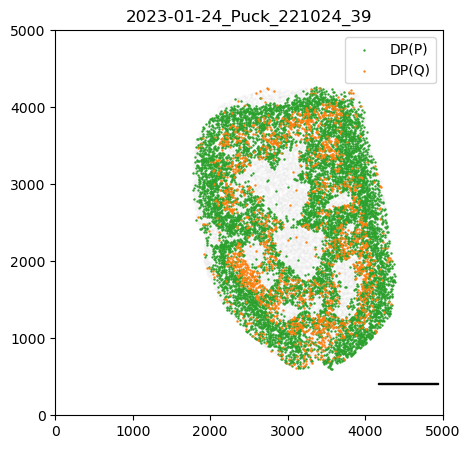

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

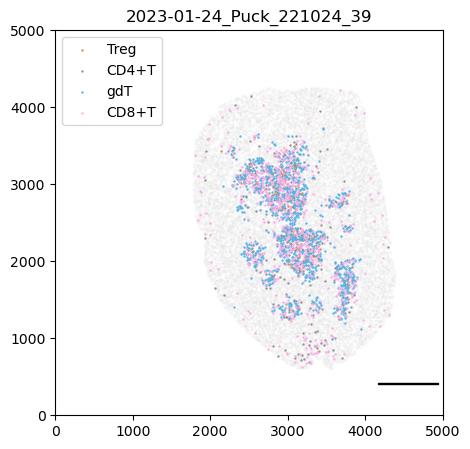

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


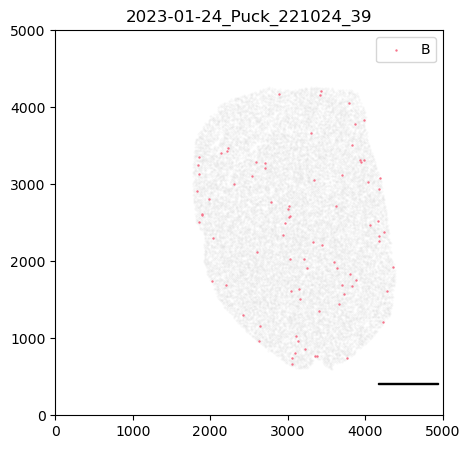

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


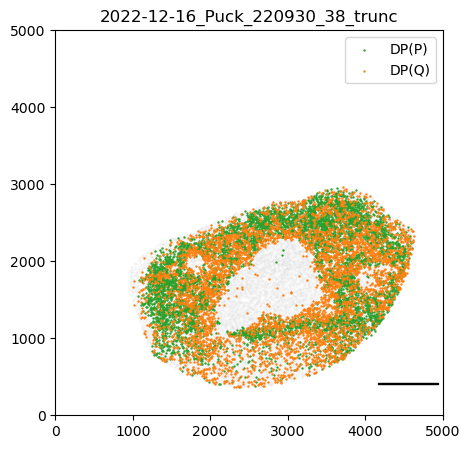

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

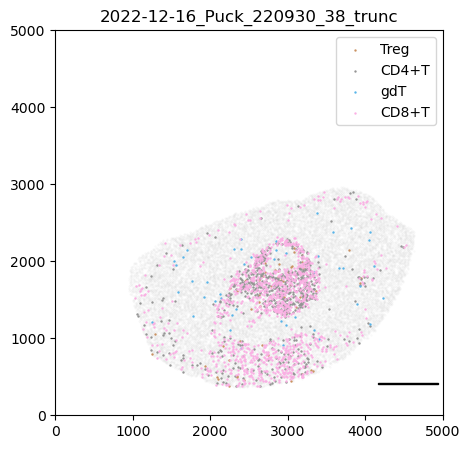

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


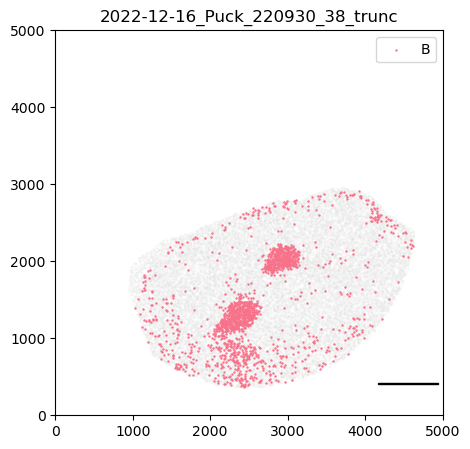

In [42]:
# Iterate over young_aged puck names and plot cell types
for slideseq_name in young_aged:
    adata = adata_all[slideseq_name]
    rctd_results = rctd_all[slideseq_name]

    # Plot double positive cell types
    plot_cell_types(adata, rctd_results, cell_type_list=['DP(P)', 'DP(Q)'], title=slideseq_name,
                    colors=sns.color_palette()[1:3][::-1])

    # Plot T cell types
    plot_cell_types(adata, rctd_results, cell_type_list=['Treg', 'CD4+T', 'gdT', 'CD8+T'], title=slideseq_name,
                    colors=[sns.color_palette('colorblind', 10)[5], sns.color_palette('colorblind', 10)[7],
                            sns.color_palette('colorblind', 10)[9], sns.color_palette('colorblind', 10)[6]])

    # Plot B cells
    plot_cell_types(adata, rctd_results, cell_type_list=['B'], title=slideseq_name)


  0%|          | 0/5 [00:00<?, ?it/s]*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


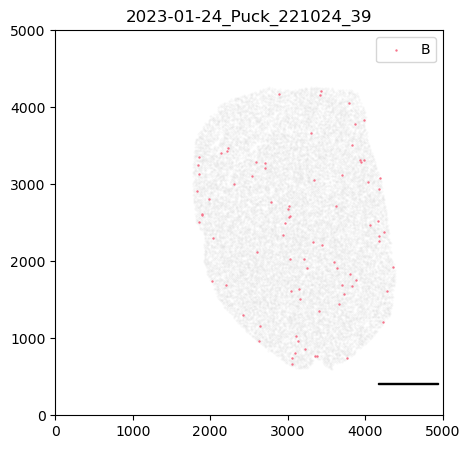

 20%|██        | 1/5 [00:01<00:06,  1.55s/it]

2023-01-24_Puck_221024_39


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


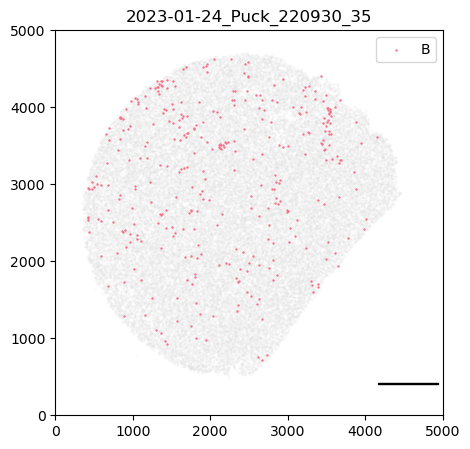

 40%|████      | 2/5 [00:05<00:08,  2.76s/it]

2023-01-24_Puck_220930_35


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


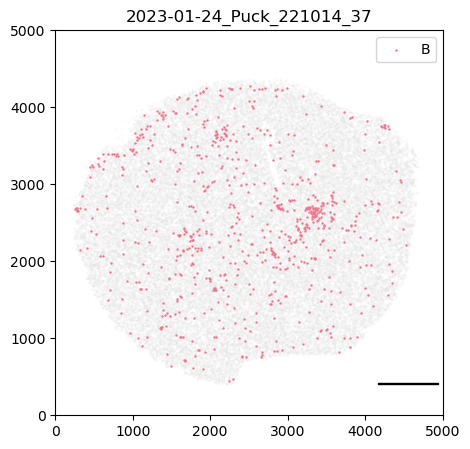

 60%|██████    | 3/5 [00:07<00:05,  2.73s/it]

2023-01-24_Puck_221014_37


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


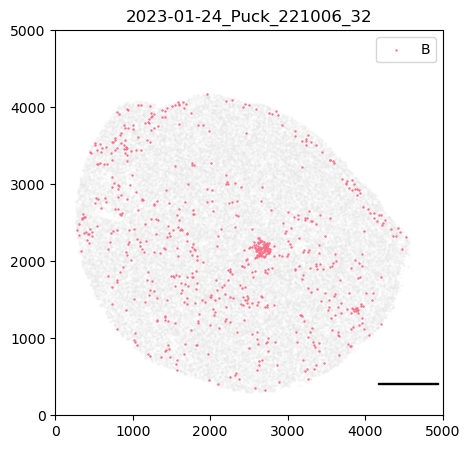

 80%|████████  | 4/5 [00:10<00:02,  2.88s/it]

2023-01-24_Puck_221006_32


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


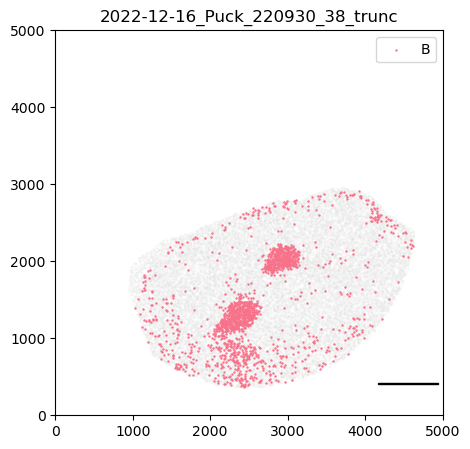

100%|██████████| 5/5 [00:13<00:00,  2.66s/it]

2022-12-16_Puck_220930_38_trunc


In [43]:
# Iterate over representative B cell puck names and plot cell types in supplemental
for slideseq_name in tqdm(representative_puck_names):
    # Check if data is already loaded, if not, load and store it
    if slideseq_name not in adata_all:
        adata = sc.read(f'{directory}{slideseq_name}_cortex_medulla_xy.h5ad')
        rctd_results = pd.read_csv(f'{directory}{slideseq_name}_RCTD_results.csv')
        adata_all[slideseq_name] = adata
        rctd_all[slideseq_name] = rctd_results
    else:
        adata = adata_all[slideseq_name]
        rctd_results = rctd_all[slideseq_name]

    # Plot B cell types
    plot_cell_types(adata, rctd_results, cell_type_list=['B'], title=slideseq_name)
    print(slideseq_name)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


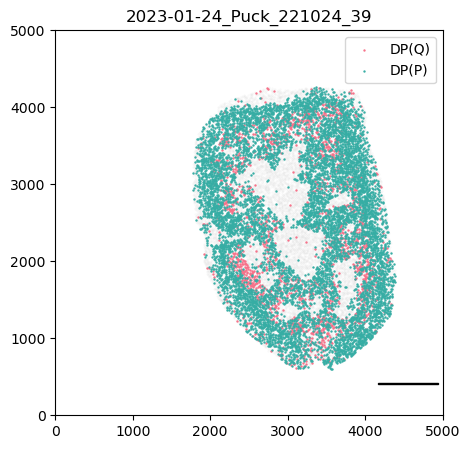

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


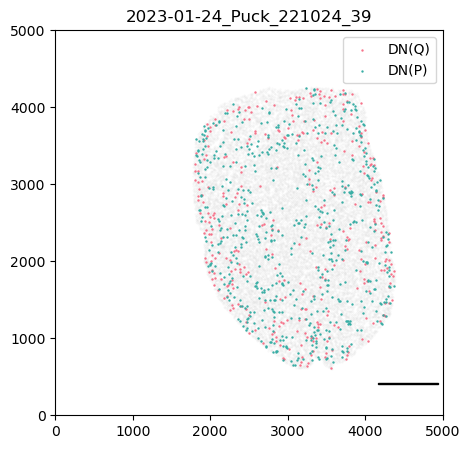

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


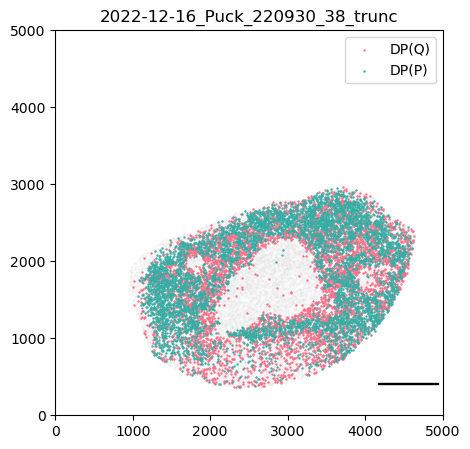

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


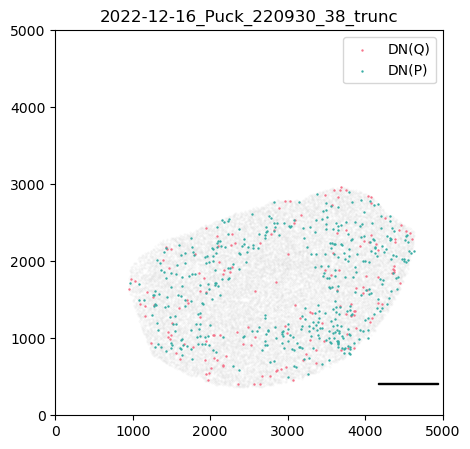

In [44]:
# Iterate over the young and aged puck names
for slideseq_name in young_aged:
    # Retrieve data from pre-loaded dictionaries
    adata = adata_all[slideseq_name]
    rctd_results = rctd_all[slideseq_name]
    
    # Plot double positive cell types
    plot_cell_types(adata, rctd_results, cell_type_list=['DP(Q)', 'DP(P)'],
                    title=slideseq_name)
    
    # Plot double negative cell types
    plot_cell_types(adata, rctd_results, cell_type_list=['DN(Q)', 'DN(P)'],
                    title=slideseq_name)


## S1F

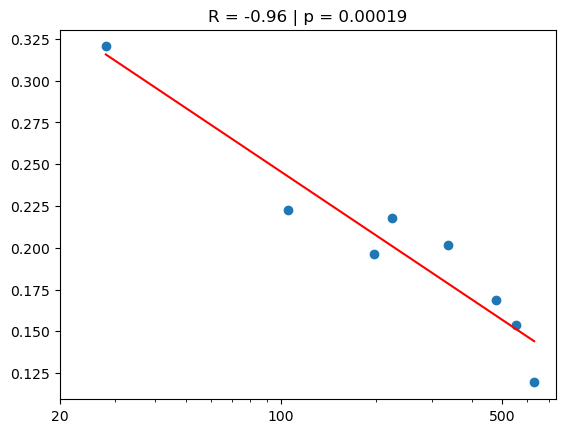

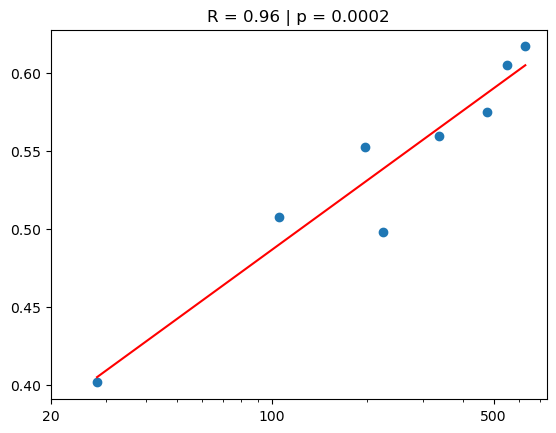

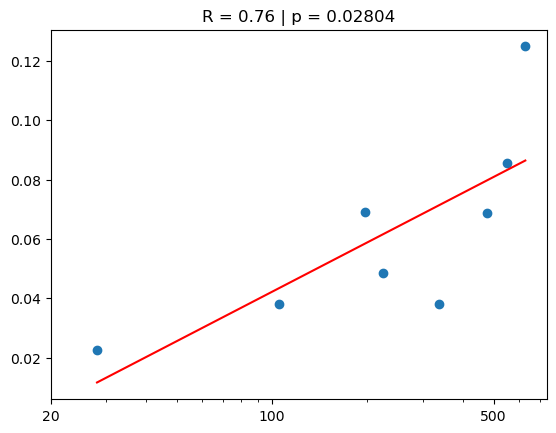

In [45]:
# Define timepoints and cell type proportions
timepoints = [4*7, 15*7, 28*7, 32*7, 48*7, 68*7, 79*7, 90*7]
cd4 = [0.3204372, 0.2227706, 0.1965469, 0.217897, 0.2016639, 0.1687399, 0.1539831, 0.1193692]
cd8 = [0.4014573, 0.507747,  0.5524939, 0.4978118, 0.5599002, 0.5751082, 0.6056409, 0.6172392]
nkt = [0.02255378, 0.03810398, 0.06914894, 0.04860071, 0.03801997, 0.06875338, 0.08561415, 0.1248074]

# Call the function for each cell type
rolling_average(timepoints, cd4, 'cd4')
rolling_average(timepoints, cd8, 'cd8')
rolling_average(timepoints, nkt, 'nkt')

## S1G

100%|██████████| 47/47 [00:03<00:00, 12.94it/s]


0.9395414142857144


Ttest_indResult(statistic=-9.985120228340072, pvalue=1.0943557852568334e-13)

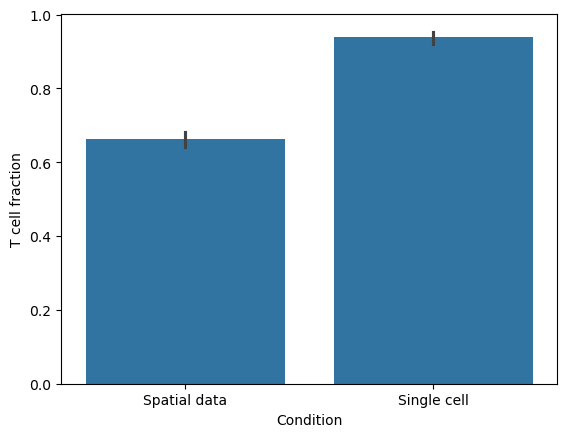

In [46]:
# Load spatial data
with open(f'{directory}thymuscombined_xy.h5ad', "rb") as handle:
    adata = sc.read_h5ad(handle)

# Count fraction of cell types that are T cells
conditions = []
fraction_t_cells = []

# Iterate over batches in the spatial data
for batch in tqdm(set(adata.obs.Batch)):
    adata_use = adata[adata.obs.Batch == batch]
    t_cell_types = ['CD4+T', 'CD8+T', 'DN(Q)', 'DP(P)', 'DP(Q)', 'DN(P)', 'alpha_beta_T(entry)', 'gdT', 'Treg']
    conditions.append('Spatial data')
    fraction_t_cells.append(len(adata_use[adata_use.obs['Cell_type'].isin(t_cell_types)]) / len(adata_use))

# Define single-cell fractions from R
single_cell_frac = [0.9615505, 0.9540805, 0.9503862, 0.9546377, 0.9452543, 0.9210848, 0.8897959]

# Append single-cell fractions to conditions and fraction_t_cells lists
print(np.average(single_cell_frac))
for samp in single_cell_frac:
    conditions.append('Single cell')
    fraction_t_cells.append(samp)

# Create a DataFrame for plotting
plot_df = pd.DataFrame.from_dict({'Condition': conditions, 'T cell fraction': fraction_t_cells})

# Plot barplot comparing spatial data and single-cell fractions
sns.barplot(plot_df, x='Condition', y='T cell fraction')
plt.savefig('Spatial vs single-cell.pdf')

# Perform t-test between spatial data and single-cell conditions
scipy.stats.ttest_ind(
    plot_df[plot_df.Condition == 'Spatial data']['T cell fraction'],
    plot_df[plot_df.Condition == 'Single cell']['T cell fraction']
)

## Figure 1C - 1D

In [48]:
# Construct the URL to export the spreadsheet data in xlsx format
xls_url = f"https://docs.google.com/spreadsheets/d/{spreadsheet_key}/export?format=xlsx"

# Read the Excel file into a DataFrame
xls = pd.ExcelFile(xls_url)
weights_df = pd.read_excel(xls, 'Weights', header=0) 

# Create a dictionary mapping days to weights
day_to_weight = {day: weight for day, weight in zip(weights_df['Days'], weights_df['Sum'])}

# Points at cortex medulla boundary
# Volume to perimeter ratio
with open(f'{directory}thymuscombined_raw_cortex_medulla.h5ad',"rb") as handle:
    adata = sc.read_h5ad(handle)
    
adata_filt = adata[adata.obs.cortex_medulla.isin(['cortex','medulla'])]

In [20]:
# Create a dictionary mapping batch indices to corresponding timepoints
batch_to_tpt = {i: j for i, j in zip(range(47), puck_times)}

# Initialize lists to store batch indices, the number of medulla points, and the number of points in the perimeter
batch_plot = []
num_medulla = []
num_perim = []

# Define the search radius in microns
radius = 50 / 0.65  # Search a 50 micron radius

# Iterate over batches using tqdm for progress visualization
for batch in tqdm(range(46)):
    # Subset the data for the current batch
    adata_puck = adata_filt[adata_filt.obs.Batch == batch]
    
    # Extract the x, y coordinates for all points in the current batch
    all_locs = list(zip(adata_puck.obs.x, adata_puck.obs.y))
    
    # Extract the x, y coordinates for medulla points in the current batch
    med_locs = list(
        zip(
            adata_puck[adata_puck.obs.cortex_medulla == 'medulla'].obs.x,
            adata_puck[adata_puck.obs.cortex_medulla == 'medulla'].obs.y,
        )
    )
    
    # Skip batches with less than 10 medulla points
    if len(med_locs) < 10:
        continue
    
    # Append the batch index to the batch_plot list
    batch_plot.append(batch)
    
    # Append the number of medulla points to the num_medulla list
    num_medulla.append(len(med_locs))
    
    # Build a k-d tree for efficient nearest neighbor search
    point_tree = cKDTree(all_locs)
    
    # Create a dictionary mapping locations to cortex or medulla regions
    loc_to_region = {i: j for i, j in zip(all_locs, list(adata_puck.obs.cortex_medulla))}
    
    # Initialize a counter to keep track of points in the perimeter
    num_perim_record = 0
    
    # Iterate over medulla points
    for pt in med_locs:
        # Find indices of nearby points within the specified radius
        indices = point_tree.query_ball_point(pt, radius)
        
        # Extract the nearby points and their corresponding regions
        nearby_points = [all_locs[i] for i in indices]
        nearby_regions = [loc_to_region[i] for i in nearby_points]
        
        # Count the occurrences of cortex and medulla in the nearby regions
        cter = Counter(nearby_regions)
        
        # Check if the ratio of cortex to medulla points is greater than 0.5
        if cter['cortex'] / cter['medulla'] > 0.5:
            num_perim_record += 1
    
    # Append the number of points in the perimeter to the num_perim list
    num_perim.append(num_perim_record)


100%|██████████| 46/46 [00:16<00:00,  2.78it/s]


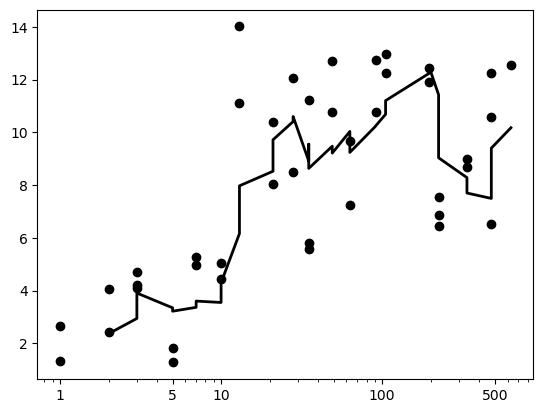

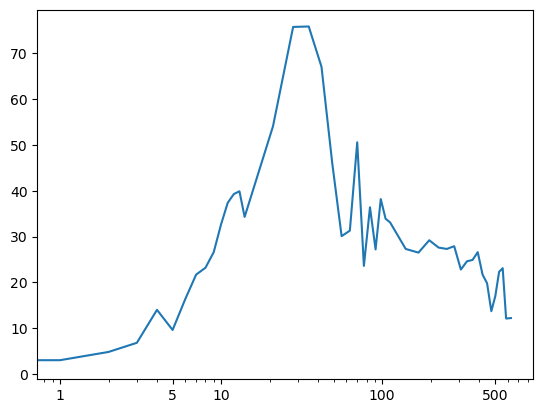

PearsonRResult(statistic=0.7029934243304873, pvalue=1.4713310449021416e-07)


In [21]:
# Create a scatter plot and rolling average of the ratio of medulla points to points in the perimeter over time
fig, ax = plt.subplots()
time = [batch_to_tpt[i] for i in batch_plot]
ratio_medulla_perim = [i / j for i, j in zip(num_medulla, num_perim)]
window_size = 5
plt.scatter(time, ratio_medulla_perim, c='black')

# Calculate the rolling average using a convolution operation
rolling_avg = np.convolve(ratio_medulla_perim, np.ones(window_size) / window_size, mode='valid')
plt.plot(time[window_size - 1:], rolling_avg, label="Rolling Average", linewidth=2, c='black')

# Set x-axis scale to logarithmic and format ticks
ax.set_xscale('log', base=10)
ax.set_xticks([1, 5, 10, 100, 500])
ax.get_xaxis().set_major_formatter(mpl.ticker.ScalarFormatter())

# Save the plot
plt.savefig('cortex_medulla_ratio_age.pdf')
plt.show()

# Create a plot of weights over time
fig, ax = plt.subplots()
plt.plot(day_to_weight.keys(), day_to_weight.values())

# Set x-axis scale to logarithmic and format ticks
ax.set_xscale('log', base=10)
ax.set_xticks([1, 5, 10, 100, 500])
ax.get_xaxis().set_major_formatter(mpl.ticker.ScalarFormatter())

# Save the plot
plt.savefig('weights.pdf')
plt.show()

# Print the Pearson correlation coefficient and p-value between log-transformed time and the ratio
print(scipy.stats.pearsonr(np.log10([i + 1 for i in time]), ratio_medulla_perim))


## Figure 1E, S1C

In [49]:
# Run parallelized jobs on all replicates to perform permutation testing
region_type = 'both'  # This test only looks at interactions in this region

max_pool = 8

all_samples = []

# Iterate through puck_names to create a list of samples for which permutation testing is required
for s in puck_names:
    if region_type == 'medulla':
        # Exclude specific samples with not enough cells for medulla region
        if s in ['2022-11-23_Puck_221024_34', '2023-01-24_Puck_221103_09', '2023-01-24_Puck_221103_12']:
            continue
    
    fn = f'{directory}zscore_{s}_pd_{region_type}.pkl'
    
    if not os.path.exists(fn):
        all_samples.append([s, region_type, directory])

print(len(all_samples), 'samples left')

# Run permutation testing in parallel using multiprocessing.Pool
with Pool(max_pool) as p:
    # Use tqdm for tracking progress in the console
    pool_outputs = list(tqdm(p.imap(perm_test_to_final_plot, all_samples), total=len(all_samples)))


0 samples left


0it [00:00, ?it/s]


In [50]:
csv_name_to_puck_name = {}
puck_to_time = {}

# Iterate through rows in master_df to create mappings for CSV names to puck names and puck names to time
for index, row in master_df.iterrows():
    puck_name = row['NovaSeq alignment directory']
    age = row['Sample Age']
    if row['Analysis Type'] != 'Mouse_aging':
        continue

    csv_name = f'{puck_name[11:25]}_B.csv'

    csv_name_to_puck_name[csv_name] = puck_name
    puck_to_time[puck_name] = age

# Create a reverse mapping of time to puck
time_to_puck = {puck_to_time[i]: i for i in puck_to_time}

# Define timepoints and create a list of puck names
timepoints = ['0 day', '1 day', '2 day', '3 day', '4 day', '5 day', '7 day', '10 day', '13 day',
              '3wks', '4 wks', '5 wks', '7wks', '9 wks', '13 wks',
              '15wks', '28wks', '32wks', '48 wks', '68 wks', '90wks']
puck_names = list(puck_to_time.keys())

# Iterate through puck_names to load z-score data for permutation testing
for s in tqdm(tqdm(puck_names)):
    if region_type == 'medulla':
        # Exclude specific samples with not enough cells for medulla region
        if s in ['2022-11-23_Puck_221024_34', '2023-01-24_Puck_221103_09', '2023-01-24_Puck_221103_12']:
            continue
    fn = f'{directory}zscore_{s}_pd_{region_type}.pkl'
    with open(fn, 'rb') as f:
        z_score_df = pkl.load(f)


100%|██████████| 47/47 [00:00<00:00, 628.21it/s]


In [51]:
# Dictionary to store all cell type pairs and their corresponding p-values for each timepoint
all_cell_type_pairs = {}

# Dictionary to store all data arrays for each timepoint
arr_all = {}

# Loop through each puck name
for i in range(len(puck_names)):
    tpt = puck_to_time[puck_names[i]]  # Get timepoint corresponding to the current puck name
    pn = puck_names[i]  # Current puck name
    
    # Try to open the pickle file containing the data
    try:
        fn = open(f'{directory}zscore_{pn}_pd_{region_type}.pkl', 'rb')
    except FileNotFoundError:
        print(f'{tpt} {pn} is missing')  # Print message if file is missing
        continue
    
    print(pn)  # Print current puck name
    df = pkl.load(fn)  # Load data from pickle file
    arr_all[tpt] = df  # Store data array in the dictionary indexed by timepoint
    
    ct1 = df.columns  # Get column names (cell types)
    ct2 = df.index  # Get index names (cell types)
    arr = np.array(df)  # Convert DataFrame to numpy array
    
    # Loop through each cell type pair
    for i in range(len(ct1)):
        for j in range(len(ct2)):
            c1 = ct1[i]  # Current cell type 1
            c2 = ct2[j]  # Current cell type 2
            
            # If cell type pair is not already in the dictionary, add it
            if (c1, c2) not in all_cell_type_pairs:
                all_cell_type_pairs[(c1, c2)] = []
            
            # Append the current timepoint and p-value to the cell type pair's list
            all_cell_type_pairs[(c1, c2)].append((tpt, arr[i][j]))

2023-01-24_Puck_220930_18
2023-01-24_Puck_220930_20
2023-01-24_Puck_220930_22
2023-01-24_Puck_220930_23
2023-01-24_Puck_220930_28
2022-12-16_Puck_220930_29_trunc
2022-11-04_Puck_220930_32
2023-01-24_Puck_220930_35
2022-12-16_Puck_220930_37_trunc
2022-12-16_Puck_220930_38_trunc
2022-12-16_Puck_221006_22_trunc
2023-01-24_Puck_221006_23
2022-11-04_Puck_221006_24
2022-12-16_Puck_221006_26_trunc
2022-12-16_Puck_221006_35_trunc
2022-11-04_Puck_221006_29
2023-01-24_Puck_221006_32
2023-01-24_Puck_221011_12
2023-01-24_Puck_221011_13
2022-12-16_Puck_221011_19_trunc
2022-12-16_Puck_221011_20_trunc
2022-12-16_Puck_221011_32_trunc
2022-12-16_Puck_221011_33_trunc
2023-01-24_Puck_221011_37
2023-01-24_Puck_221011_39
2023-01-24_Puck_221014_37
2023-01-24_Puck_221019_03
2023-01-24_Puck_221019_05
2023-01-24_Puck_221019_08
2023-01-24_Puck_221019_10
2023-01-24_Puck_221019_14
2023-01-24_Puck_221024_23
2022-11-23_Puck_221024_24
2023-01-16_Puck_221024_27
2022-11-23_Puck_221024_31
2023-01-24_Puck_221024_33
2022

100%|██████████| 27/27 [00:00<00:00, 248.43it/s]


CD4+T and CD4+T-1
not significant: ('DN(Q)', 'DN(Q)-1')
gdT and gdT-1
not significant: ('Treg', 'Treg-1')
DC2 and DC2-1
DP(P) and DP(P)-1
not significant: ('Mono', 'Mono-1')
not significant: ('NK', 'NK-1')
TEC_early and TEC_early-1
not significant: ('HSC', 'HSC-1')
B and B-1
Mac and Mac-1
CD8+T and CD8+T-1
alpha_beta_T(entry) and alpha_beta_T(entry)-1
Ery and Ery-1
not significant: ('IELpA', 'IELpA-1')
not significant: ('VSMC', 'VSMC-1')
not significant: ('IELpB_NKT', 'IELpB_NKT-1')
not significant: ('pDC', 'pDC-1')
not significant: ('Fb', 'Fb-1')
not significant: ('DP(Q)', 'DP(Q)-1')
not significant: ('DN(P)', 'DN(P)-1')
not significant: ('Endo', 'Endo-1')
not significant: ('cTEC', 'cTEC-1')
not significant: ('DC1', 'DC1-1')
not significant: ('Epi_unknown', 'Epi_unknown-1')
not significant: ('mTEC', 'mTEC-1')


Text(0.5, 80.72222222222243, 'timepoints, log+1')

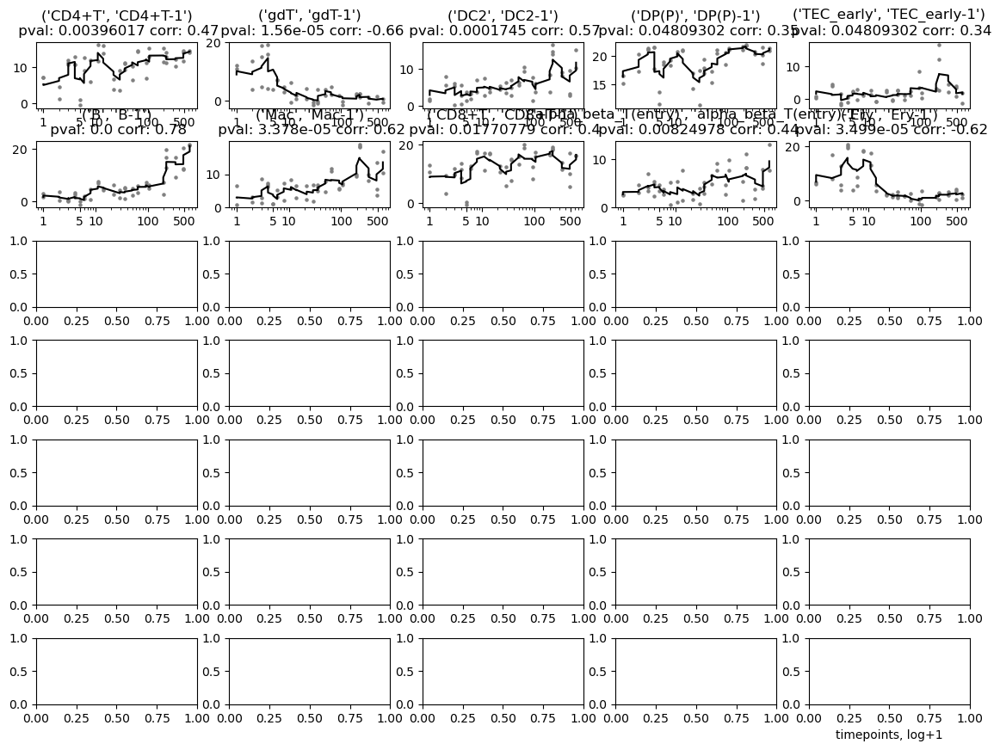

In [68]:
# Dictionary to store line plots
line_plots = {}

# Iterate over all cell type pairs
for i in tqdm(all_cell_type_pairs):
    # Only look at self interactions
    if i[1] != i[0] + '-1':
        if i[0] != i[1] + '-1':
            continue
    num_pairs = len(all_cell_type_pairs[i])

    line_plots[i] = all_cell_type_pairs[i]

# Set parameters for correlation calculation and correction
corr_pval = True
color = 'gray'
pval_recorder_for_corr = []

# Iterate over line plots for correlation calculation
for i in line_plots:
    if len(line_plots[i]) <= 1:
        continue
    # Filter NaN values and extract x and y values
    line_plots_filt = [(x, y) for x, y in line_plots[i] if not np.isnan(y)]
    x_vals = [tpt_to_day[j[0]] + 1 for j in line_plots_filt]
    y_vals = [j[1] for j in line_plots_filt]
    x_vals, y_vals = zip(*sorted([(x, y) for x, y in zip(x_vals, y_vals)]))
    x_vals, y_vals = zip(*sorted([(x, y) for x, y in zip(x_vals, y_vals) if np.isfinite(y)]))
    
    # Check if enough data points for correlation calculation
    if len(x_vals) < 5:
        continue
    # Calculate Pearson correlation
    corr, pval = scipy.stats.pearsonr(np.log10(x_vals), y_vals)
    pval_recorder_for_corr.append(pval)

    
# Perform multiple testing correction
corr_list = multitest.multipletests(pval_recorder_for_corr, method='fdr_bh')
corr_dict = {i: j for i, j in zip(pval_recorder_for_corr, corr_list[1])}

# Lists to store significant interactions
dotplot_sig_interactions = []
dotplot_sig_corr = []
dotplot_sig_pval = []

# Initialize plot
fig, axs = plt.subplots(nrows=7, ncols=5, figsize=(14, 10))
plt.subplots_adjust(hspace=0.5)
pval_recorder_for_corr = []
plt_cter = 0

# Iterate over line_plots for plotting
for i in tqdm(line_plots):
    if len(line_plots[i]) <= 1:
        print(f'only one time point: {i}')
        continue
    # Filter NaN values and extract x and y values
    line_plots_filt = [j for j in line_plots[i] if ~np.isnan(j[1])]
    y_vals = [j[1] for j in line_plots[i]]
    x_vals = [tpt_to_day[j[0]] for j in line_plots[i]]
    x_vals = [i + 1 for i in x_vals]
    x_vals, y_vals = zip(*sorted([(i, j) for i, j in zip(x_vals, y_vals) if np.isfinite(j)]))
    if len(x_vals) < 5:
        print(f'less than five values: {i}')
        continue
    # Calculate Pearson correlation
    corr, pval = scipy.stats.pearsonr(np.log10(x_vals), y_vals)
    if corr_pval:
        pval = corr_dict[pval]
    dotplot_sig_interactions.append(i)
    dotplot_sig_corr.append(corr)
    dotplot_sig_pval.append(pval)
    
    # Plot significant interactions
    if pval < 0.05:
        y_vals_df = pd.DataFrame.from_dict({'y': y_vals})
        y_vals_line = y_vals_df['y'].rolling(window=5, min_periods=1, center=True).mean()
        alpha_val = 1
        print(f'{i[0]} and {i[1]}')
        ax_val = axs.ravel()[plt_cter]
        plt_cter += 1
        ax_val.scatter(x_vals, y_vals, c=color, alpha=alpha_val, s=5)
        ax_val.plot(x_vals, y_vals_line, c='black', alpha=alpha_val)
        ax_val.set_title(str(i) + '\n pval: ' + str(round(pval, 8)) + ' corr: ' + str(round(corr, 2)))
        ax_val.set_xscale('log', base=10)
        ax_val.set_xticks([1, 5, 10, 100, 500])
        ax_val.get_xaxis().set_major_formatter(ScalarFormatter())
   
    else:
        color = 'gray'
        alpha_val = 0.01
        print(f'not significant: {i}')
        continue

# Save plot
plt.savefig(f'Indiv_interac_{region_type}.pdf')
plt.xlabel('timepoints, log+1')

## S2A, S2B

In [70]:
with open(f'{directory}thymuscombined_raw_cortex_medulla.h5ad',"rb") as handle:
    adata_cm = sc.read_h5ad(handle)
    
with open(f'{directory}thymuscombined_xy.h5ad',"rb") as handle:
    adata = sc.read_h5ad(handle)

  0%|          | 0/47 [00:00<?, ?it/s]

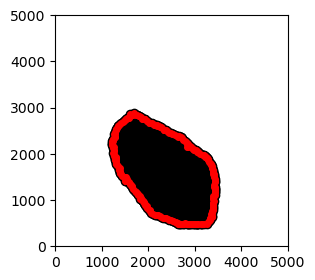

  2%|▏         | 1/47 [00:08<06:26,  8.39s/it]

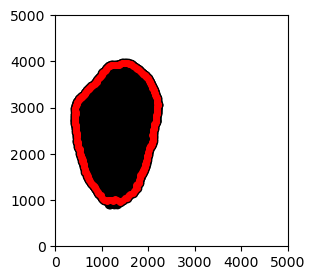

  4%|▍         | 2/47 [00:22<08:42, 11.61s/it]

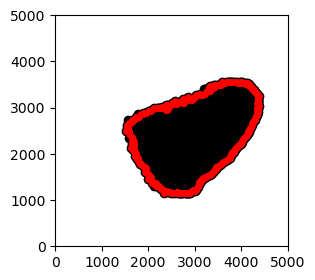

  6%|▋         | 3/47 [00:32<07:55, 10.81s/it]

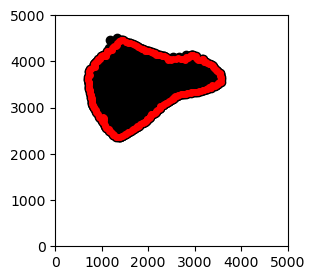

  9%|▊         | 4/47 [00:41<07:13, 10.07s/it]

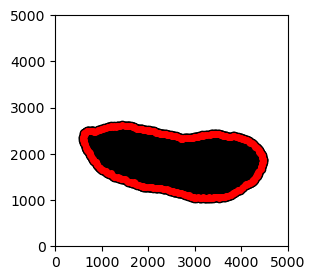

 11%|█         | 5/47 [01:02<09:48, 14.02s/it]

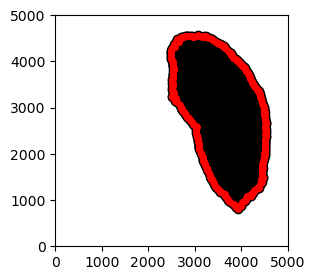

 13%|█▎        | 6/47 [01:22<11:03, 16.18s/it]

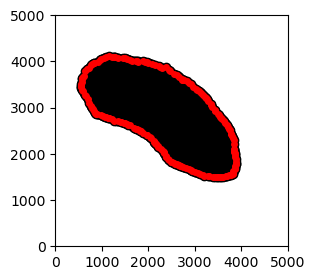

 15%|█▍        | 7/47 [01:39<11:00, 16.52s/it]

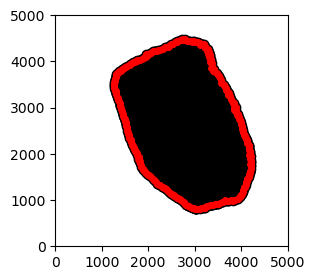

 17%|█▋        | 8/47 [02:15<14:47, 22.77s/it]

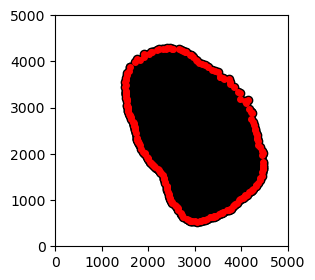

 19%|█▉        | 9/47 [02:38<14:22, 22.70s/it]

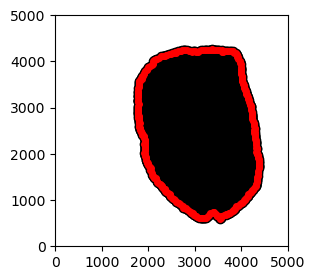

 21%|██▏       | 10/47 [03:12<16:14, 26.35s/it]

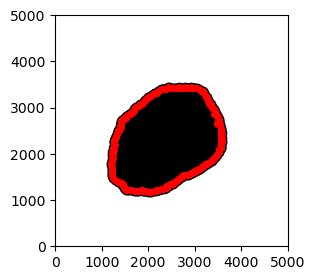

 23%|██▎       | 11/47 [03:25<13:20, 22.24s/it]

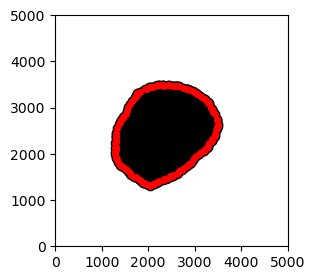

 26%|██▌       | 12/47 [03:34<10:38, 18.24s/it]

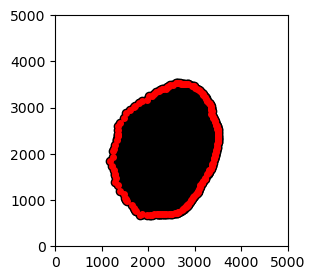

 28%|██▊       | 13/47 [03:52<10:17, 18.15s/it]

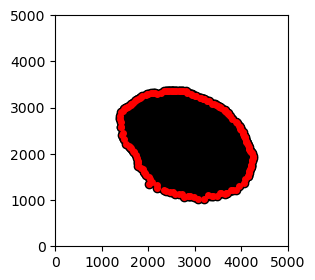

 30%|██▉       | 14/47 [04:09<09:44, 17.71s/it]

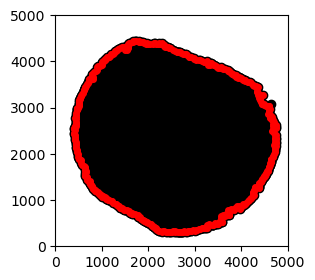

 32%|███▏      | 15/47 [05:24<18:34, 34.83s/it]

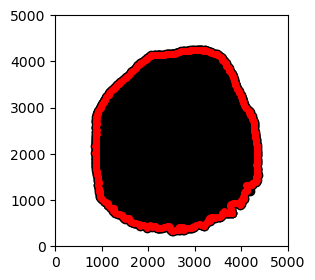

 34%|███▍      | 16/47 [06:40<24:24, 47.24s/it]

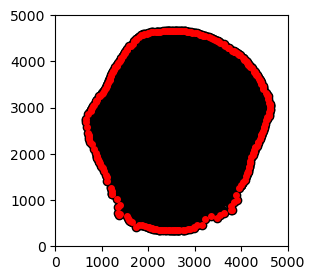

 36%|███▌      | 17/47 [07:34<24:43, 49.46s/it]

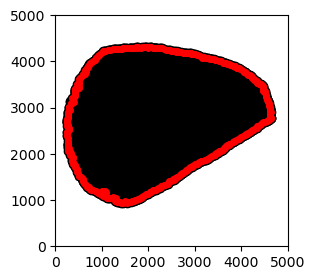

 38%|███▊      | 18/47 [08:39<26:11, 54.20s/it]

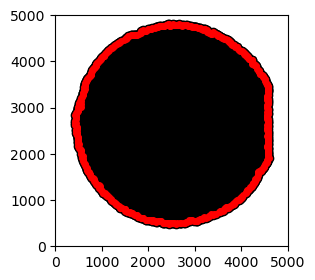

 40%|████      | 19/47 [09:59<28:46, 61.67s/it]

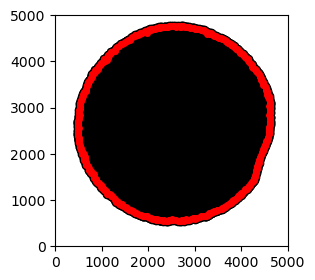

 43%|████▎     | 20/47 [10:56<27:07, 60.29s/it]

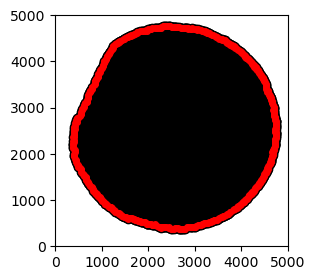

 45%|████▍     | 21/47 [11:54<25:50, 59.63s/it]

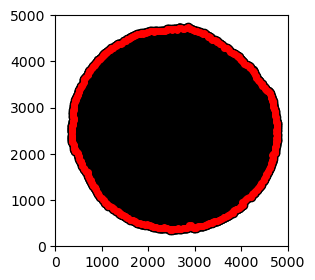

 47%|████▋     | 22/47 [12:55<25:01, 60.06s/it]

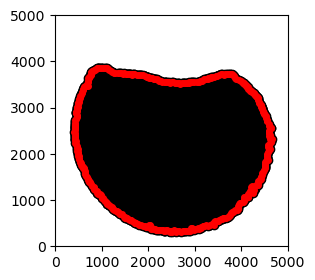

 49%|████▉     | 23/47 [13:42<22:27, 56.13s/it]

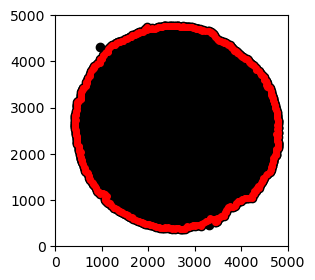

 51%|█████     | 24/47 [14:26<20:12, 52.70s/it]

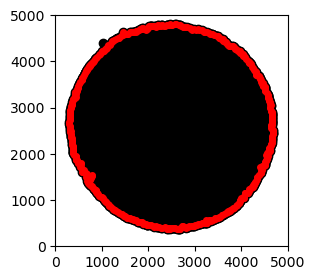

 53%|█████▎    | 25/47 [15:11<18:26, 50.29s/it]

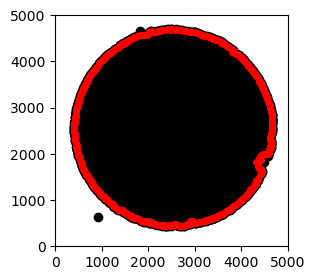

 55%|█████▌    | 26/47 [16:06<18:03, 51.62s/it]

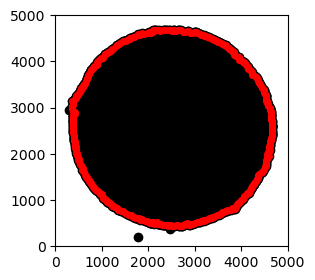

 57%|█████▋    | 27/47 [16:47<16:10, 48.51s/it]

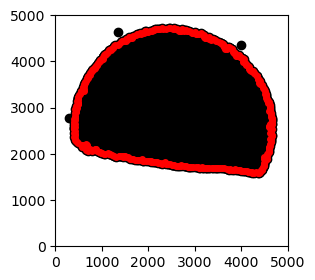

 60%|█████▉    | 28/47 [17:10<12:57, 40.91s/it]

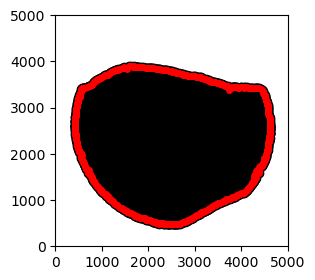

 62%|██████▏   | 29/47 [18:09<13:50, 46.13s/it]

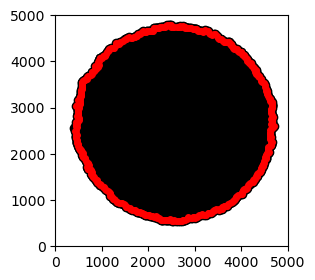

 64%|██████▍   | 30/47 [19:12<14:34, 51.45s/it]

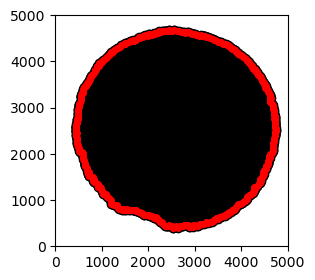

 66%|██████▌   | 31/47 [20:26<15:27, 57.96s/it]

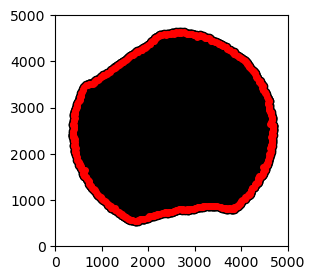

 68%|██████▊   | 32/47 [21:17<14:02, 56.15s/it]

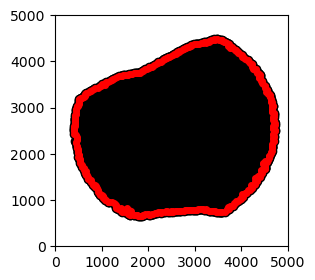

 70%|███████   | 33/47 [22:03<12:21, 53.00s/it]

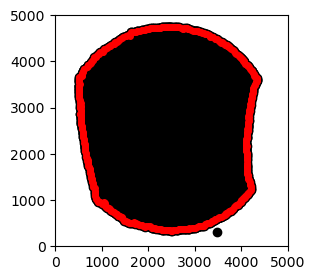

 72%|███████▏  | 34/47 [23:36<14:03, 64.91s/it]

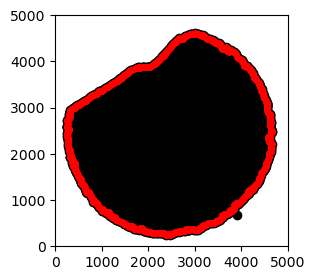

 74%|███████▍  | 35/47 [24:45<13:12, 66.06s/it]

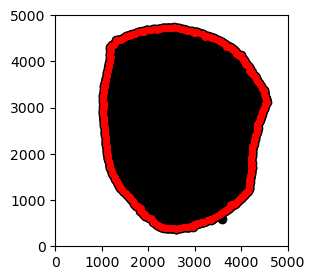

 77%|███████▋  | 36/47 [26:03<12:49, 69.91s/it]

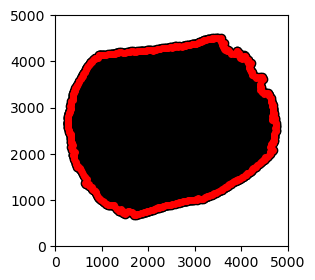

 79%|███████▊  | 37/47 [27:23<12:07, 72.78s/it]

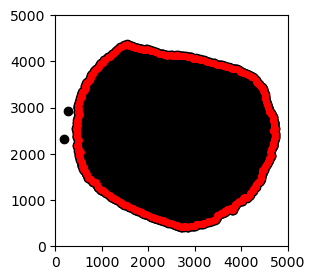

 81%|████████  | 38/47 [28:57<11:51, 79.05s/it]

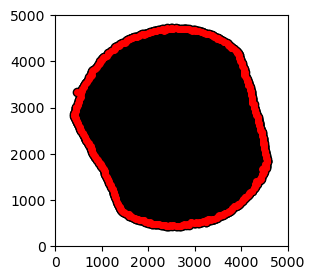

 83%|████████▎ | 39/47 [30:49<11:51, 88.97s/it]

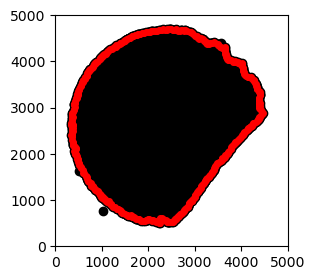

 85%|████████▌ | 40/47 [32:23<10:33, 90.43s/it]

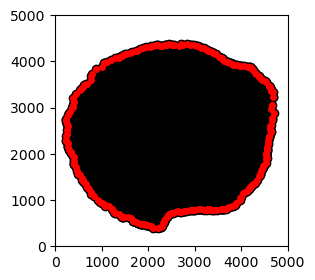

 87%|████████▋ | 41/47 [33:14<07:53, 78.88s/it]

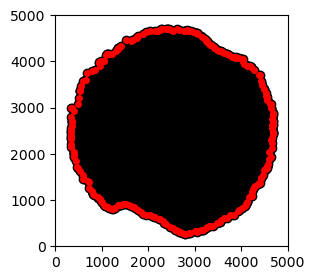

 89%|████████▉ | 42/47 [33:56<05:37, 67.59s/it]

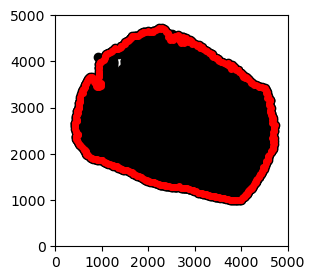

 91%|█████████▏| 43/47 [34:30<03:49, 57.48s/it]

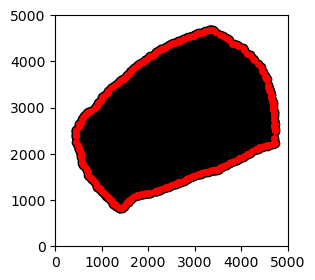

 94%|█████████▎| 44/47 [34:57<02:25, 48.34s/it]

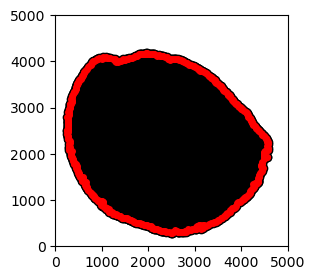

 96%|█████████▌| 45/47 [36:02<01:47, 53.54s/it]

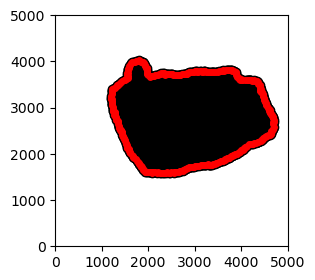

 98%|█████████▊| 46/47 [36:28<00:45, 45.31s/it]

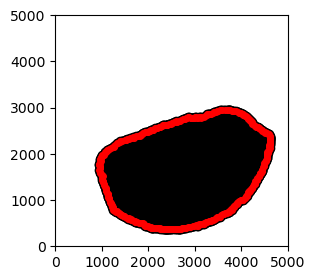

100%|██████████| 47/47 [37:01<00:00, 47.28s/it]


In [71]:
rerun = False
if rerun:

    # Identify pucks that have captured the entire tissue and boundary and calculate boundary distances
    distances_by_batches = {}

    for b in tqdm(set(adata_cm.obs.Batch)):
        adata_filt = adata_cm[adata_cm.obs.Batch == b]
        all_x = adata_filt.obs.x
        all_y = adata_filt.obs.y
        adata_filt = adata_filt[adata_filt.obs.cortex_medulla.isin(['cortex','medulla'])]

        x = [float(i) for i in adata_filt.obs.x]
        y = [float(i) for i in adata_filt.obs.y]

        clustered_points = list(zip(x, y))

        try:
            # Extract DP(P) points
            ct_filt = adata[adata.obs.Batch == float(b+1)]
            dpp_filt = ct_filt[ct_filt.obs.Cell_type == 'DP(P)']
            dpp_points = set(list(zip(dpp_filt.obs.x_val, dpp_filt.obs.y_val)))
            dpp_points = [i for i in dpp_points if i in set(clustered_points)]

            # Calculate distances to the boundary
            alpha_shape, distances_dpp, boundary = calculate_distance_to_boundary(clustered_points, dpp_points, show_plot=True)

            # Extract DP(Q) points
            dpq_filt = ct_filt[ct_filt.obs.Cell_type == 'DP(Q)']
            dpq_points = set(list(zip(dpq_filt.obs.x_val, dpq_filt.obs.y_val)))
            dpq_points = [i for i in dpq_points if i in set(clustered_points)]

            # Calculate distances to the boundary
            alpha_shape, distances_dpq, boundary = calculate_distance_to_boundary(clustered_points, dpq_points)

            distances_by_batches[b] = [distances_dpp, distances_dpq]

        except:
            try:
                # Retry with different alpha values
                alpha_shape, distances_dpp, boundary = calculate_distance_to_boundary(clustered_points, dpp_points, 
                                                                                      alpha=0.01, show_plot=True)

                alpha_shape, distances_dpq, boundary = calculate_distance_to_boundary(clustered_points, dpq_points,
                                                                                      alpha=0.01)

                distances_by_batches[b] = [distances_dpp, distances_dpq]

            except:
                try:
                    # Retry with alpha = 0
                    alpha_shape, distances_dpp, boundary = calculate_distance_to_boundary(clustered_points, dpp_points, 
                                                                                          alpha=0, show_plot=True)

                    alpha_shape, distances_dpq, boundary = calculate_distance_to_boundary(clustered_points, dpq_points,
                                                                                          alpha=0)

                    distances_by_batches[b] = [distances_dpp, distances_dpq]

                except:
                    print(f'This batch failed three times: {b}. I give up!')
    pkl_dump(distances_by_batches,f'{directory}distances_by_batches')
else:
    distances_by_batches = pkl_load(f'{directory}distances_by_batches')

  0%|          | 0/47 [00:00<?, ?it/s]

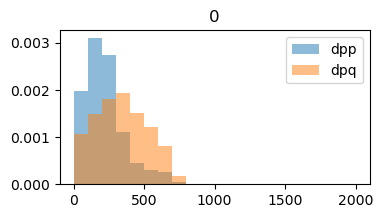

  2%|▏         | 1/47 [00:00<00:20,  2.26it/s]

0.3519160036819048 1.8678516739196813e-65


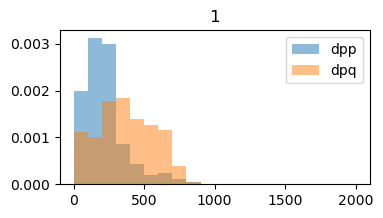

  4%|▍         | 2/47 [00:00<00:19,  2.36it/s]

0.4274289674289674 1.3808396141270814e-124


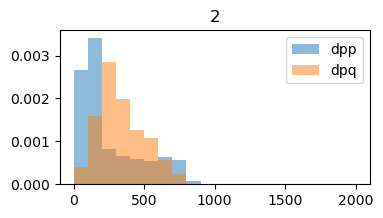

  6%|▋         | 3/47 [00:01<00:18,  2.32it/s]

0.42285878293640144 7.727707730285584e-157


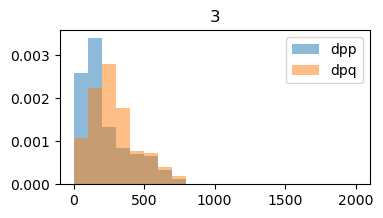

  9%|▊         | 4/47 [00:01<00:16,  2.60it/s]

0.2849465905765291 4.557223828222135e-49


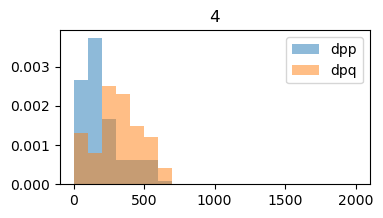

 11%|█         | 5/47 [00:01<00:15,  2.63it/s]

0.4484969943583006 1.6719525514070477e-194


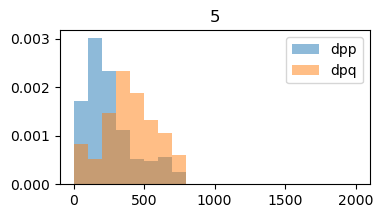

 13%|█▎        | 6/47 [00:02<00:15,  2.60it/s]

0.43592815781636723 9.930887057465972e-179


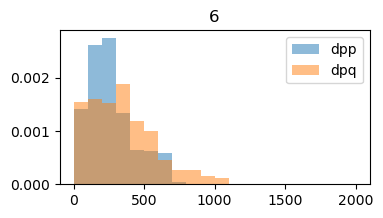

 15%|█▍        | 7/47 [00:02<00:14,  2.75it/s]

0.2233141862660916 2.654943628445806e-43


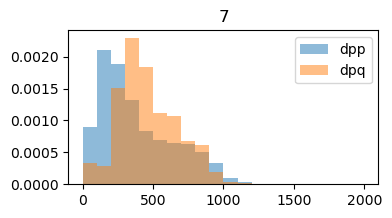

 17%|█▋        | 8/47 [00:03<00:14,  2.63it/s]

0.2935378116469837 4.765544988587988e-107


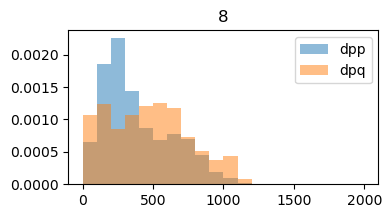

 19%|█▉        | 9/47 [00:03<00:13,  2.74it/s]

0.2031842645508517 4.764434779668767e-44


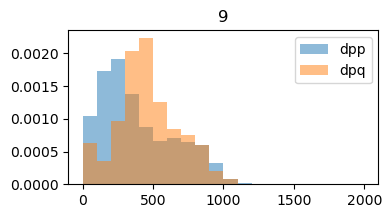

 21%|██▏       | 10/47 [00:03<00:14,  2.64it/s]

0.27821817815979727 4.1478600675590175e-99


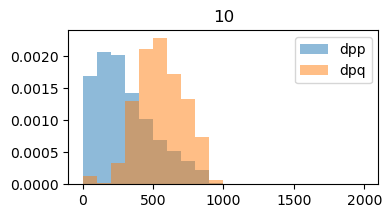

 23%|██▎       | 11/47 [00:04<00:14,  2.54it/s]

0.5563692353913174 6.540857782804139e-281


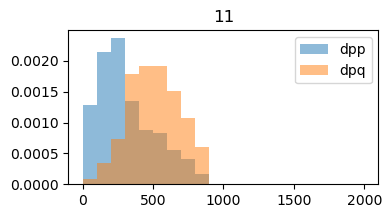

 26%|██▌       | 12/47 [00:04<00:13,  2.60it/s]

0.4682369953969612 2.0296133061246864e-181


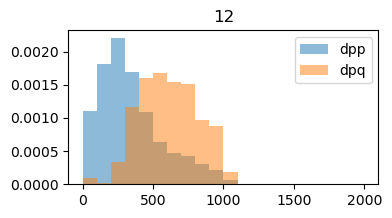

 28%|██▊       | 13/47 [00:05<00:13,  2.59it/s]

0.5199272016498907 7.990407911545289e-240


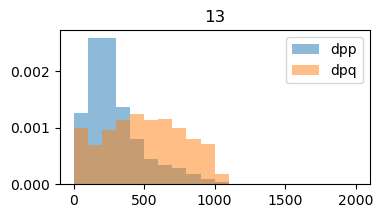

 30%|██▉       | 14/47 [00:05<00:12,  2.66it/s]

0.4185686425785436 4.7653042572061393e-147


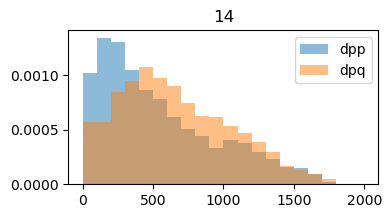

 32%|███▏      | 15/47 [00:05<00:13,  2.39it/s]

0.18037167518760439 8.42689127732015e-123


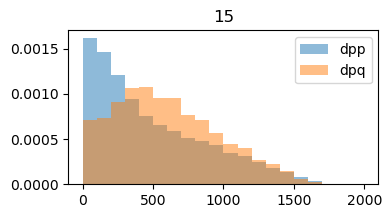

 34%|███▍      | 16/47 [00:06<00:14,  2.08it/s]

0.19620422774428517 3.0353297171470224e-148


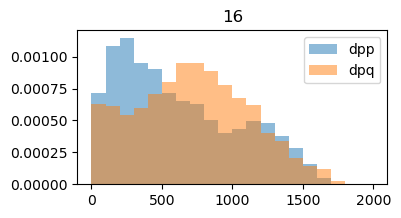

 36%|███▌      | 17/47 [00:07<00:14,  2.02it/s]

0.17305215783731057 3.468960257451509e-109


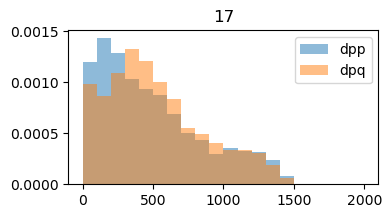

 38%|███▊      | 18/47 [00:07<00:13,  2.17it/s]

0.1040427512550567 2.9197341202543677e-31


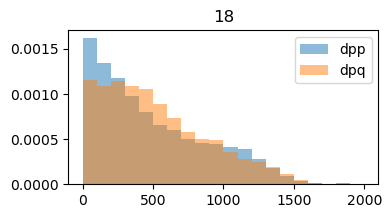

 40%|████      | 19/47 [00:07<00:12,  2.32it/s]

0.0814064855182074 5.739616733899203e-24


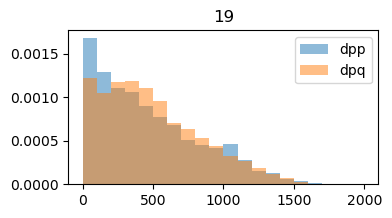

 43%|████▎     | 20/47 [00:08<00:11,  2.42it/s]

0.07975538640605273 5.261596154169023e-20


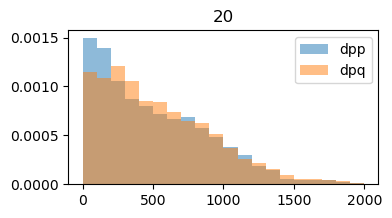

 45%|████▍     | 21/47 [00:09<00:16,  1.58it/s]

0.06884695752191518 1.437485201854857e-09


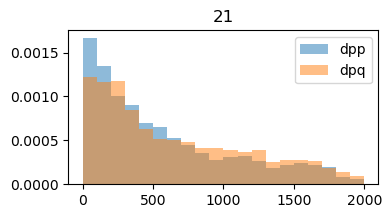

 47%|████▋     | 22/47 [00:09<00:13,  1.83it/s]

0.07915449304807046 3.8304307199079944e-13


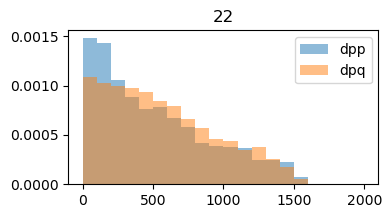

 49%|████▉     | 23/47 [00:10<00:11,  2.04it/s]

0.09352449958417353 1.9734277352061792e-18


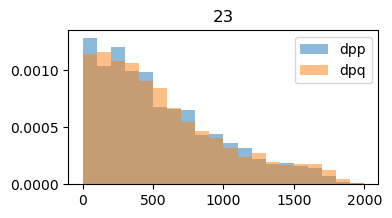

 51%|█████     | 24/47 [00:10<00:10,  2.23it/s]

0.021433862172891078 0.4087159561278679


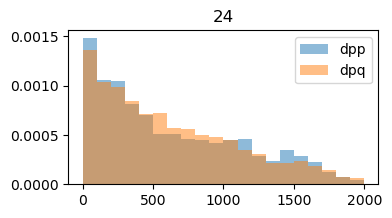

 53%|█████▎    | 25/47 [00:10<00:09,  2.42it/s]

0.0349196898517179 0.019079505454835895


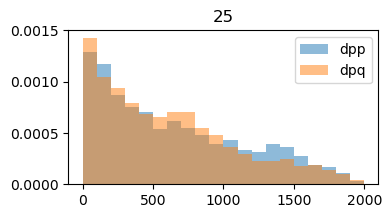

 55%|█████▌    | 26/47 [00:11<00:08,  2.58it/s]

0.06352006125260147 2.5718158842414266e-07


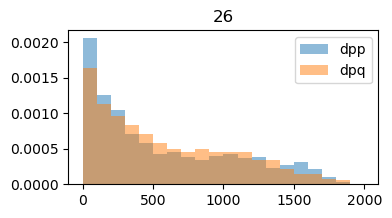

 57%|█████▋    | 27/47 [00:11<00:07,  2.66it/s]

0.06710956580408277 1.3514534827010283e-05


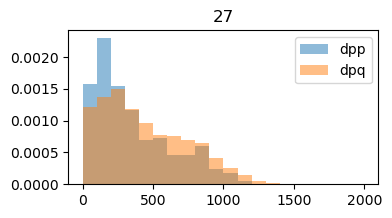

 60%|█████▉    | 28/47 [00:11<00:06,  2.76it/s]

0.14779347223368 1.1222954466136312e-20


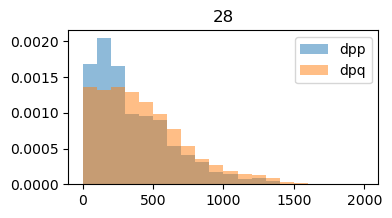

 62%|██████▏   | 29/47 [00:12<00:06,  2.75it/s]

0.1387798723745241 6.237202399114758e-30


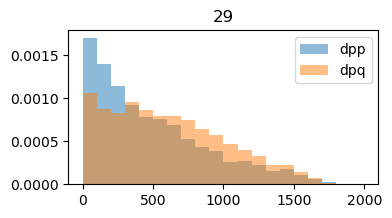

 64%|██████▍   | 30/47 [00:12<00:06,  2.60it/s]

0.1562523577913114 2.580871620489809e-66


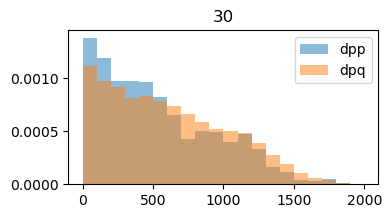

 66%|██████▌   | 31/47 [00:12<00:05,  2.71it/s]

0.0895891952423905 1.1132226623822601e-22


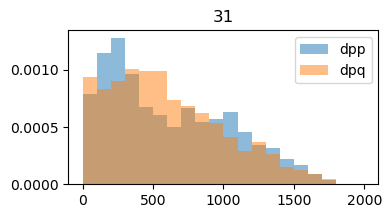

 68%|██████▊   | 32/47 [00:13<00:05,  2.69it/s]

0.05887268754836412 1.4909125024533111e-09


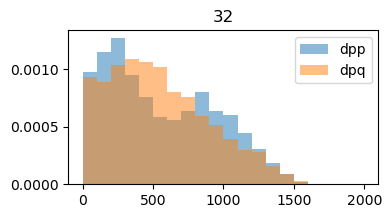

 70%|███████   | 33/47 [00:13<00:05,  2.76it/s]

0.07188924825132559 4.018102163708978e-12


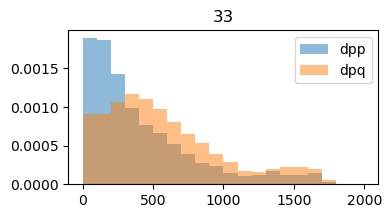

 72%|███████▏  | 34/47 [00:13<00:04,  2.74it/s]

0.23218730148597633 6.616602669753845e-212


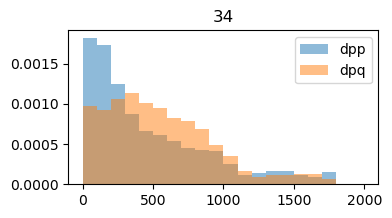

 74%|███████▍  | 35/47 [00:14<00:04,  2.52it/s]

0.1891931318197434 6.231365447660329e-119


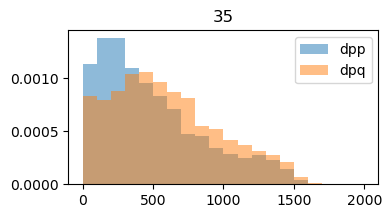

 77%|███████▋  | 36/47 [00:14<00:04,  2.40it/s]

0.14616281039582857 3.924692941328085e-78


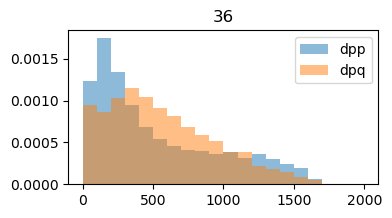

 79%|███████▊  | 37/47 [00:15<00:04,  2.29it/s]

0.1520841889954904 6.838195517517042e-82


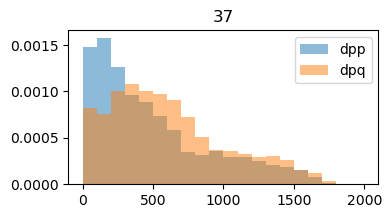

 81%|████████  | 38/47 [00:15<00:03,  2.43it/s]

0.17559292215843275 2.8141707827598064e-125


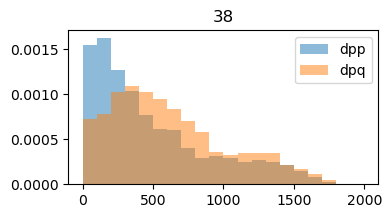

 83%|████████▎ | 39/47 [00:16<00:03,  2.54it/s]

0.19401005123778448 2.630506220566461e-171


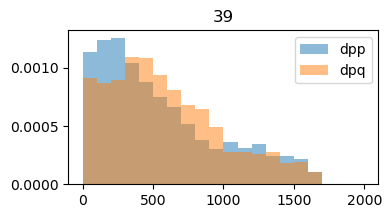

 85%|████████▌ | 40/47 [00:16<00:02,  2.67it/s]

0.10004244054936873 3.288401003113878e-36


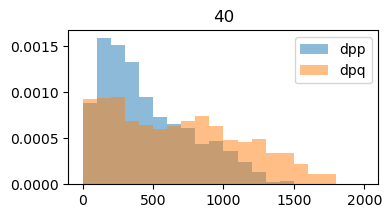

 87%|████████▋ | 41/47 [00:16<00:02,  2.43it/s]

0.23143707567985003 2.0566981246896542e-150


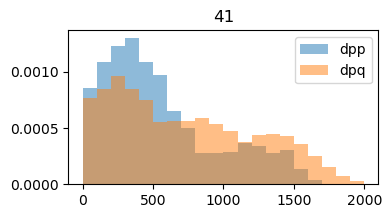

 89%|████████▉ | 42/47 [00:17<00:02,  2.46it/s]

0.19364088239260044 2.4228788613153194e-84


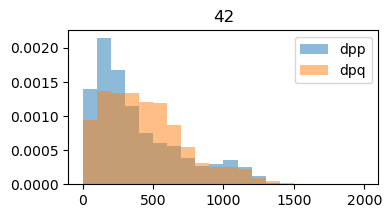

 91%|█████████▏| 43/47 [00:17<00:01,  2.59it/s]

0.16333896768131753 2.1430460141496262e-41


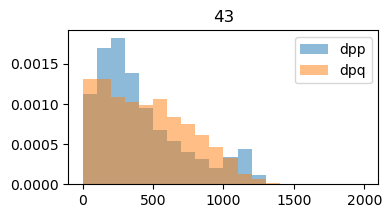

 94%|█████████▎| 44/47 [00:18<00:01,  1.55it/s]

0.1390766478451098 2.0176343503994327e-32


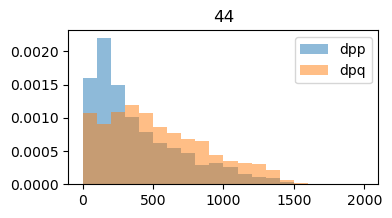

 96%|█████████▌| 45/47 [00:19<00:01,  1.64it/s]

0.22617996600485282 7.83752196002149e-136


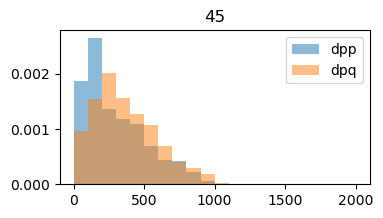

 98%|█████████▊| 46/47 [00:19<00:00,  1.85it/s]

0.20832193919751524 1.0439246057796843e-81


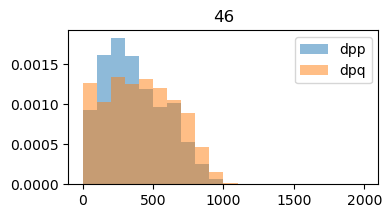

100%|██████████| 47/47 [00:20<00:00,  2.34it/s]

0.11102372454950298 1.483574506581699e-26


In [74]:
# Initialize a dictionary to store plot data
plot_df = {'b': [], 'stat': [], 'type': []}

# Iterate over batches of distances
for b in tqdm(distances_by_batches):
    # Extract distances for positive and negative pairs
    dpp = [i[1] for i in distances_by_batches[b][0]]
    dpq = [i[1] for i in distances_by_batches[b][1]]

    # Plot histograms of distances for positive and negative pairs
    plt.figure(figsize=(4, 2))
    max_val = 2000  # max(max(dpp), max(dpq))
    min_val = 0  # min(min(dpp), min(dpq))
    plt.hist(dpp, alpha=0.5, range=(min_val, max_val), bins=20, density=True, label='dpp')
    plt.hist(dpq, alpha=0.5, range=(min_val, max_val), bins=20, density=True, label='dpq')
    plt.title(b)
    plt.legend()
    plt.savefig('distance_comparison.pdf')
    plt.show()

    # Calculate Kolmogorov-Smirnov test statistic and p-value
    stat, pval = scipy.stats.kstest(dpp, dpq)
    print(stat, pval)

    # Add data to the plot dictionary
    plot_df['b'].append(b)
    plot_df['stat'].append(stat)
    if batch_to_tpt[b] <= 35:
        plot_df['type'].append('young')
    else:
        plot_df['type'].append('old')

0.01098901098901099


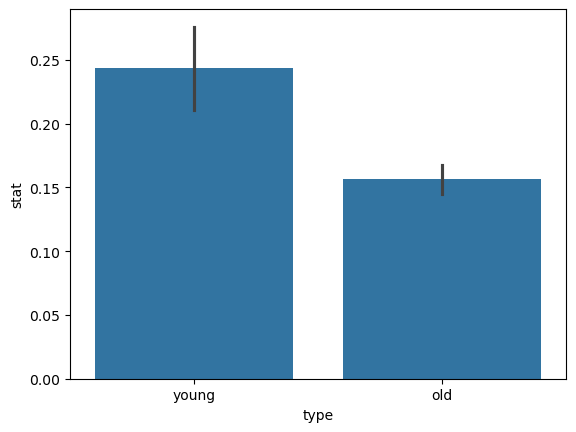

In [82]:
# Convert dictionary to DataFrame
plot_df = pd.DataFrame.from_dict(plot_df)

# Make a copy of the DataFrame
df = copy.deepcopy(plot_df)

# Separate KS test statistics for young and old types
ks_young = df.loc[df['type'] == 'young', 'stat']
ks_old = df.loc[df['type'] == 'old', 'stat']

# Observed KS test statistic
observed_ks_statistic, _ = ks_2samp(ks_young, ks_old)

# Number of permutations
num_permutations = 1000

# Concatenate the KS test statistics
all_ks = np.concatenate([ks_young, ks_old])

# Initialize an array to store permuted test statistics
permuted_ks_statistics = np.zeros(num_permutations)

# Permutation test
for i in range(num_permutations):
    # Shuffle the combined data
    np.random.shuffle(all_ks)

    # Split the shuffled data into two groups
    shuffled_ks_young = all_ks[:len(ks_young)]
    shuffled_ks_old = all_ks[len(ks_young):]

    # Calculate KS test statistic for the shuffled data
    permuted_ks_statistic, _ = ks_2samp(shuffled_ks_young, shuffled_ks_old)

    # Store the permuted test statistic
    permuted_ks_statistics[i] = permuted_ks_statistic

# Calculate p-value
p_value = (np.sum(permuted_ks_statistics >= observed_ks_statistic) + 1) / (num_permutations + 1)
print(p_value)

sns.barplot(plot_df, x = 'type',y = 'stat', errorbar = 'se')
plt.savefig('dpq_dpp_diff.pdf')

# Figure 2

## Calculate spatial diversity score and save as new adata

In [89]:
# Make and save adata with diversity information
make_and_save = False # If false, will load pre-run adata
rerun = False # Permutation Test

if make_and_save:
    with open(f'{directory}thymuscombined_xy.h5ad',"rb") as handle:
        adata = sc.read_h5ad(handle)
     
    # Re-run or load pre-run diversity calculations
    if rerun:
        record = {}
        record_all_div = {}
        exvar_recorder = {}

        all_diversity_values = []

        loc_to_v_all = {}
        loc_to_j_all = {}
        loc_to_clone_all = {}
        clone_to_loc_all = {}
        cort_loc_to_diversity_all = {}


        for csv_name in tqdm(csv_name_to_puck_name):
        #for csv_name in ['Puck_221011_19_B.csv']: # for testing just one puck

            puck_name = csv_name_to_puck_name[csv_name]
            #!gsutil cp gs://fc-secure-2423a594-f5fe-40c6-b998-f28ac17ea012/{puck_name}/{puck_name[11:25]}_B.csv ./


            batch = puck_name_to_batch[puck_name]
            timepoint = puck_name_to_timepoint[puck_name]
            print(batch,timepoint)
            bc_loc_dict_s1 = batch_to_bc_loc_dict[batch]
            loc_to_bc_s1 = batch_to_loc_bc_dict[batch]
            matched_bead_barcodes = batch_to_matched_bead_barcodes_dict[batch]
            ###################################################
            ###################################################

            df = pd.read_csv(directory+csv_name)

            try:
                cortex_medulla_df = pd.read_csv(f'{directory}{puck_name}_cortex_medulla.csv')
            except:
                print(f'{puck_name} is missing cortex_medulla')
                continue
            loc_to_cm = {i:j for i,j in zip(cortex_medulla_df.locations, cortex_medulla_df.cortex_medulla )}
            bc_to_cm = {loc_to_bc_s1[ast.literal_eval(i)]:loc_to_cm[i] for i in loc_to_cm}
            bc_cortex = [bc for bc in bc_to_cm if bc_to_cm[bc] == 'cortex']
            bc_medulla = [bc for bc in bc_to_cm if bc_to_cm[bc] == 'medulla'] # Only look in cortical regions
            bc_both = bc_cortex+bc_medulla
            bc_all = [bc for bc in matched_bead_barcodes.values()]
            locs_medulla = [bc_loc_dict_s1[i] for i in bc_medulla]
            locs_cortex = [bc_loc_dict_s1[i] for i in bc_cortex]
            #df = df[df.barcode.isin(bc_all)]
        #     Counter(df.cdr3)

            clone_to_loc = {}
            loc_to_clone = {}
            loc_to_j = {}
            loc_to_v = {}
            for index,row in df.iterrows():
                clone = row['cdr3']
                loc = (float(row['x']),float(row['y']))

                if loc not in loc_to_clone:
                    loc_to_clone[loc] = []
                if loc not in clone_to_loc:
                    clone_to_loc[clone] = []
                if loc not in loc_to_j:
                    loc_to_j[loc] = [] 
                if loc not in loc_to_v:
                    loc_to_v[loc] = [] 

                loc_to_clone[loc].append(clone)
                clone_to_loc[clone].append(loc)
                loc_to_v[loc].append(row['allVHitsWithScore'])
                loc_to_j[loc].append(row['allJHitsWithScore'] )
        #     if len(loc_to_clone) < 2: # If fewer than two locations
        #         continue
        #     x,y = zip(*loc_to_clone)
        #     plt.figure(figsize=(5,5))
        #     plt.scatter(x,y,s=3)
        #     plt.axis('off')
        #     plt.title(puck_name_to_timepoint[puck_name])

            all_tcr_locs = list(loc_to_clone.keys())
            point_tree = cKDTree(all_tcr_locs)
            diversity = []
            num_neighbors = 20
        #     if len(all_tcr_locs) < num_neighbors:
        #         continue

            print(f'Started with {len(all_tcr_locs)} TCR locs')
            all_tcr_locs_keep = []
            for point in all_tcr_locs:
                # Implement a filter for having at least 5 TCRs within a radius of 200
                idx_closeby_points = point_tree.query_ball_point(point,r=200/0.65)
                if len(idx_closeby_points) < 5:
                    continue
                dist,idx = point_tree.query(point,num_neighbors)
                close_pts = [all_tcr_locs[i] for i in idx]
                close_clones = [loc_to_clone[i] for i in close_pts]
                close_clones = list(itertools.chain.from_iterable(close_clones))
                fractions = [i/len(close_clones) for i in list(Counter(close_clones).values())]
                diversity.append(skbio.diversity.alpha.shannon(fractions))
                all_tcr_locs_keep.append(point)


            all_tcr_locs = copy.deepcopy(all_tcr_locs_keep)

            print(f'Ended with {len(all_tcr_locs)} TCR locs')
            all_diversity_values = all_diversity_values + diversity
            # overall diversity score
            all_tcr_clones = [loc_to_clone[i] for i in all_tcr_locs]
            all_tcr_clones = list(itertools.chain.from_iterable(all_tcr_clones))
            if len(all_tcr_locs) < num_neighbors:
                continue
            all_tcr_clones = random.sample(all_tcr_clones,num_neighbors)
            all_fractions = [i/len(all_tcr_clones) for i in list(Counter(all_tcr_clones).values())]
            record_all_div[timepoint] = skbio.diversity.alpha.shannon(all_fractions)

            ###  Plot of all TCRs ###
            all_tcr_locs = set(all_tcr_locs)
            # only plot points in cortex
            all_tcr_locs_filt,div_filt = zip(*[[i,j] for i,j in zip(all_tcr_locs,diversity) if i in locs_cortex ])
            x,y = zip(*all_tcr_locs_filt)
            fig = plt.figure(figsize=(5,5))
            p = plt.scatter(x,y,c=div_filt,cmap='inferno',vmin=3.3, vmax=5.4) # MOUSE SETTING
            #p = plt.scatter(x,y,c=div_filt,cmap='inferno',vmin=4, vmax=6) # HUMAN SETTING
            plt.axis('off')

            cb_ax = fig.add_axes([.91,.124,.04,.754])
            fig.colorbar(p,orientation='vertical',cax=cb_ax)
            plt.title(csv_name + ' ' + timepoint)
            plt.xlim([0,5000])
            plt.ylim([0,5000])
            plt.show()
            #################

            if timepoint not in record:
                record[timepoint] = []
            record[timepoint] = record[timepoint] + diversity

            # Make exvar for C-SIDE
            exvar_recorder = {}
            exvar_recorder['barcode'] = [loc_to_bc_s1[i] for i in all_tcr_locs]
            exvar_recorder['x'] = [i[0] for i in all_tcr_locs]
            exvar_recorder['y'] = [i[1] for i in all_tcr_locs]
            exvar_recorder['diversity'] = diversity
            exvar_recorder['diversity_binar'] = [1 if i>4.48 else 0 for i in diversity ]
            exvar_recorder['diversity_norm'] = [(i-3.74)/1.69 for i in diversity ]

            loc_to_diversity = {i:j for i,j in zip(all_tcr_locs,diversity)}

            df = pd.DataFrame.from_dict(exvar_recorder)
            df.to_csv(f'{puck_name}_diversity.csv')

            cort_loc_to_diversity = dilate_cortex_points(bc_cortex,bc_medulla,bc_loc_dict_s1,
                                                        loc_to_bc_s1,matched_bead_barcodes,locs_cortex,filt_plot=True)

            cort_loc_to_diversity_all[puck_name] = cort_loc_to_diversity
            loc_to_clone_all[puck_name] = loc_to_clone
            clone_to_loc_all[puck_name] = clone_to_loc
            loc_to_v_all[puck_name] = loc_to_v
            loc_to_j_all[puck_name] = loc_to_j

            # assign as high or low diversity based off of average of nearest neighbors
            # repeat until all locations are assigned
            !gsutil cp {puck_name}_diversity.csv gs://fc-secure-2423a594-f5fe-40c6-b998-f28ac17ea012
        # open a file, where you want to store the data
        pkl_dump(cort_loc_to_diversity_all,'cort_loc_to_diversity_all')
        pkl_dump(loc_to_clone_all,'loc_to_clone_all')
        pkl_dump(clone_to_loc_all,'clone_to_loc_all')
        pkl_dump(loc_to_v_all,'loc_to_v_all')
        pkl_dump(loc_to_j_all,'loc_to_j_all')
        pkl_dump(all_diversity_values,'all_diversity_values')

        pkl_dump(record,'record')
        pkl_dump(record_all_div,'record_all_div')
        pkl_dump(exvar_recorder,'exvar_recorder')
    
    cort_div = []
    for index,row in tqdm(adata.obs.iterrows()):
        batch = row.Batch
        puck_name = batch_to_puck_name[int(batch-1)]

        if puck_name not in cort_loc_to_diversity_all:
            print(puck_name)
            clone_all.append('still processing')
            continue

        cort_loc_to_diversity = cort_loc_to_diversity_all[puck_name]   
        loc = (row.x_val,row.y_val)
        try:
            if loc in cort_loc_to_diversity:    
                div = cort_loc_to_diversity[loc]
                cort_div.append(str(div))
            else:
                cort_div.append('NA')
        except:
            cort_div.append('NA')
            continue
    
    clone_all = []
    v_all = []
    j_all = []
    cortex_medulla = []
    old_batch = 0
    for index,row in tqdm(adata.obs.iterrows()):
        batch = row.Batch
        puck_name = batch_to_puck_name[int(batch-1)]

        loc_to_clone = loc_to_clone_all[puck_name]   
        loc_to_v = loc_to_v_all[puck_name]
        loc_to_j = loc_to_j_all[puck_name]
        loc = (float(row.x_val),float(row.y_val))

        if loc in loc_to_clone:   
            clone = str(loc_to_clone[loc])
            clone_all.append(clone)
        else:
            clone_all.append('NA')

        if loc in loc_to_v:    
            v = str(loc_to_v[loc])
            v_all.append(v)
        else:
            v_all.append('NA')

        if loc in loc_to_j:    
            j = str(loc_to_j[loc])
            j_all.append(j)
        else:
            j_all.append('NA')
        if old_batch != batch:
            cortex_medulla_df = pd.read_csv(f'{directory}{puck_name}_cortex_medulla.csv')
            loc_to_cm = {i:j for i,j in zip(cortex_medulla_df.locations, cortex_medulla_df.cortex_medulla )}
            old_batch = batch
        if str(loc) in loc_to_cm:
            cortex_medulla.append(loc_to_cm[str(loc)])
        else:
            cortex_medulla.append('NA')
            
    adata.obs['cort_div'] = cort_div
    adata.obs['beta_clone'] = clone_all
    adata.obs['beta_v'] = v_all
    adata.obs['beta_j'] = j_all
    adata.__dict__['_raw'].__dict__['_var'] = adata.__dict__['_raw'].__dict__['_var'].rename(columns={'_index': 'features'})
    adata.obs['cortex_medulla'] = cortex_medulla
    adata.write('Thymus_data_TCR_locs_diver.h5ad')
    !gsutil cp ./Thymus_data_TCR_locs_diver.h5ad gs://fc-secure-2423a594-f5fe-40c6-b998-f28ac17ea012
else:
    with open(f'{directory}Thymus_data_TCR_locs_diver.h5ad',"rb") as handle:
        adata = sc.read_h5ad(handle)
        
batch_to_puck_name = {i:j for i,j in enumerate(puck_names)}
puck_name_to_batch = {j:i for i,j in enumerate(puck_names)}

batch_all = adata.obs.Batch

batch_to_bc_loc_dict = {}
batch_to_loc_bc_dict = {}
batch_to_matched_bead_barcodes_dict = {}


for b in tqdm(range(len(puck_names))):
    b = b
    p = batch_to_puck_name[b]

    ###################################################
    ########## Make barcode to location ##########
    directory_slideseq = p
    abbrev_sample_reference = p[11:]
    fn = f'{directory}{directory_slideseq}/barcode_matching/{abbrev_sample_reference}_barcode_matching.txt'
    bc_loc_df = pd.read_csv(f'{directory}{abbrev_sample_reference}_barcode_matching.txt',
                                        sep='\t',
                                        header=None)
    spatial_barcodes_s1 = list(bc_loc_df[0])
    spatial_locations_s1 = [
        (i, j) for i, j in zip(bc_loc_df[2], bc_loc_df[3])
    ]
    bc_loc_dict_s1 = {
        i: j
        for i, j in zip(spatial_barcodes_s1,
                        spatial_locations_s1)
    }

    loc_to_bc_s1 = {j:i  for i, j in zip(spatial_barcodes_s1,
                        spatial_locations_s1)}
    matched_bead_barcodes = {i:j for i,j in zip(bc_loc_df[1],bc_loc_df[0])}
    ###################################################
    ###################################################


    batch_to_bc_loc_dict[b] = copy.deepcopy(bc_loc_dict_s1)
    batch_to_loc_bc_dict[b] = copy.deepcopy(loc_to_bc_s1)
    batch_to_matched_bead_barcodes_dict[b] = copy.deepcopy(matched_bead_barcodes)
    
cort_loc_to_diversity_all = pkl_load(f'{directory}cort_loc_to_diversity_all')
loc_to_clone_all = pkl_load(f'{directory}loc_to_clone_all')
clone_to_loc_all = pkl_load(f'{directory}clone_to_loc_all')
loc_to_v_all = pkl_load(f'{directory}loc_to_v_all')
loc_to_j_all = pkl_load(f'{directory}loc_to_j_all')
all_diversity_values = pkl_load(f'{directory}all_diversity_values')
record = pkl_load(f'{directory}record')
record_all_div = pkl_load(f'{directory}record_all_div')
exvar_recorder = pkl_load(f'{directory}exvar_recorder')
    

100%|██████████| 47/47 [00:24<00:00,  1.93it/s]


## Figure 2B, S4A

TRBV13-2 0.0027778685106251712
13138 1374 37199 4289
TRBV16 8.533579752971202e-10
20631 2562 29706 3101
TRBV15 2.4261100674260237e-09
2515 186 47822 5477
TRBV13-3 0.009444548584409447
7047 865 43290 4798
TRBV5 2.731463954414264e-07
3298 274 47039 5389
TRBV26 0.6400122774287194
3519 386 46818 5277
Paired t-test results:
t-statistic: -0.0157526350041803
p-value: 0.9880409822495819


{0.0027778685106251712: 0.0041668027659377575,
 8.533579752971202e-10: 5.120147851782721e-09,
 2.4261100674260237e-09: 7.278330202278071e-09,
 0.009444548584409447: 0.011333458301291335,
 2.731463954414264e-07: 5.462927908828528e-07,
 0.6400122774287194: 0.6400122774287194}

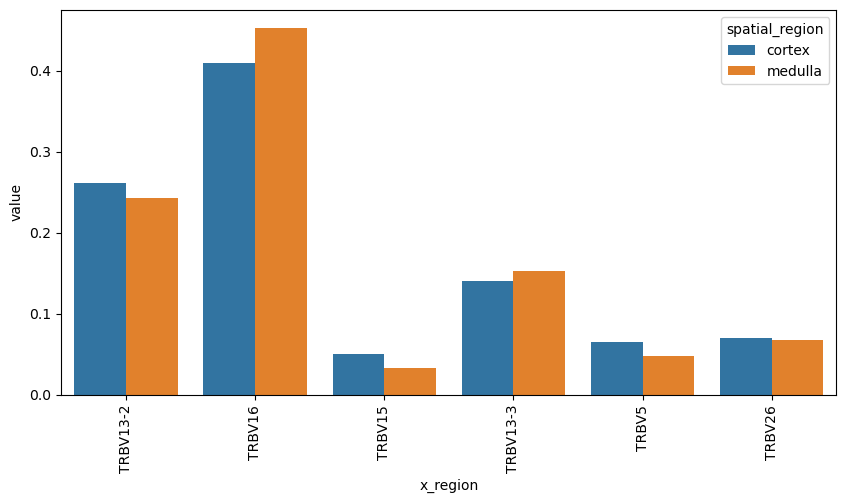

In [113]:
# Difference between cortex and medulla across all samples?
region_type = 'v' # Can change this to "v" or "j" for main figure vs. supplemental

# Initialize a list to record p-values
pval_recorder = []

# Filter out samples with 'NA' in the 'cortex_medulla' column
adata_filt = adata[adata.obs['cortex_medulla'] != 'NA']

# Filter out samples with 'NA' in the specified region type column ('beta_v' or 'beta_j')
adata_with_x = adata_filt[adata_filt.obs[f'beta_{region_type}'] != 'NA']

# Separate data into cortex and medulla samples
adata_cortex = adata_with_x[adata_with_x.obs['cortex_medulla'] == 'cortex']
adata_medulla = adata_with_x[adata_with_x.obs['cortex_medulla'] == 'medulla']

# Function to extract the TCRV region with the highest alignment score
def extract_max_score(bead):
    split = [i.split('(') for i in bead]
    x_to_score = {i[0][:-3]: i[1][:-1] for i in split}
    return max(x_to_score, key=x_to_score.get)

# Extract TCRV regions for cortex samples
x_regions_filt_cortex = [extract_max_score(ast.literal_eval(i)) for i in adata_cortex.obs[f'beta_{region_type}']]

# Extract TCRV regions for medulla samples
x_regions_filt_medulla = [extract_max_score(ast.literal_eval(i)) for i in adata_medulla.obs[f'beta_{region_type}']]

# Count occurrences of regions in medulla
cter_med = Counter(x_regions_filt_medulla)

# Calculate fractions of each region in medulla
x_med_frac = {i: cter_med[i] / sum(cter_med.values()) for i in cter_med}

# Count occurrences of regions in cortex
cter_cort = Counter(x_regions_filt_cortex)

# Calculate fractions of each region in cortex
x_cort_frac = {i: cter_cort[i] / sum(cter_cort.values()) for i in cter_cort}


# Initialize lists to store TCRV regions and corresponding p-values
tcr_x_to_plot = []
pval_recorder = []

# Total counts of TCRV regions in cortex and medulla
all_cort = sum(cter_cort.values())
all_med = sum(cter_med.values())

# Iterate over each TCRV region
for tcr_x in cter_cort:
    a = cter_cort[tcr_x]  # Count of TCRV region in cortex
    b = cter_med[tcr_x]   # Count of TCRV region in medulla
    
    # Skip if either count is less than 10
    if a < 10 or b < 10:
        continue
    
    # Calculate counts for not TCRV region
    c = all_cort - a
    d = all_med - b
    
    # Perform Fisher exact test
    res = fisher_exact([[a, b], [c, d]])
    
    # Record TCRV region and corresponding p-value
    tcr_x_to_plot.append(tcr_x)
    pval_recorder.append(res[1])
    
    # Print TCRV region, p-value, and counts for debugging
    print(tcr_x, res[1])
    print(a, b, c, d)

Paired t-test results:
t-statistic: -0.0157526350041803
p-value: 0.9880409822495819


{0.0027778685106251712: 0.0041668027659377575,
 8.533579752971202e-10: 5.120147851782721e-09,
 2.4261100674260237e-09: 7.278330202278071e-09,
 0.009444548584409447: 0.011333458301291335,
 2.731463954414264e-07: 5.462927908828528e-07,
 0.6400122774287194: 0.6400122774287194}

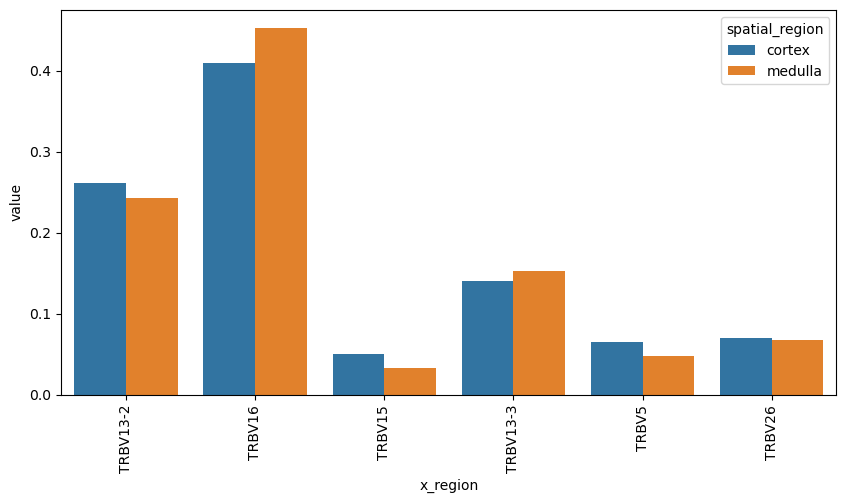

In [ ]:
# Initialize dictionaries to store shared fractions
x_cort_frac_shared = {}
x_med_frac_shared = {}

# Filter shared fractions based on TCR regions
for x in x_cort_frac:
    if x not in tcr_x_to_plot or x not in x_med_frac:
        continue
    else:
        x_cort_frac_shared[x] = x_cort_frac[x]
        x_med_frac_shared[x] = x_med_frac[x]

# Initialize lists to store data for plotting
x_region = []
spatial_region = []
value = []

# Populate lists with data for plotting
for x in x_cort_frac_shared:
    x_region.extend([x, x])
    spatial_region.extend(['cortex', 'medulla'])
    value.extend([x_cort_frac_shared[x], x_med_frac_shared[x]])

# Create DataFrame for plotting
df = {'x_region': x_region, 'spatial_region': spatial_region, 'value': value}

# Perform paired t-test
t_stat, p_val = scipy.stats.ttest_rel(list(x_cort_frac_shared.values()), list(x_med_frac_shared.values()))
print("Paired t-test results:")
print("t-statistic:", t_stat)
print("p-value:", p_val)

# Create bar plot
plt.figure(figsize=(10, 5))
sns.barplot(data=df, x='x_region', y='value', hue='spatial_region')
plt.xticks(rotation=90)

# Save plot
fn = f'{region_type}_bias_cortex_medulla.pdf'
plt.savefig(fn)

corr_list = stats.multitest.multipletests(pval_recorder,method = 'fdr_bh')
corr_pval_dict = {i:j for i,j in zip(pval_recorder,corr_list[1])}
corr_pval_dict


## Figure 2C, S4B

/tmp/ipykernel_17075/664428601.py:17: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_with_x.obs['max_v'] = x_regions_filt
/PHShome/sx931/.conda/envs/aging-thymus/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)
100%|██████████| 47/47 [00:00<00:00, 146.75it/s]


{0.001674480604523597: 0.0050234418135707915, 0.011150362885190704: 0.02230072577038141, 0.1430518239482155: 0.15451730634471905, 0.0007429488821933052: 0.004457693293159831, 0.03583750052100656: 0.05375625078150984, 0.15451730634471905: 0.15451730634471905}


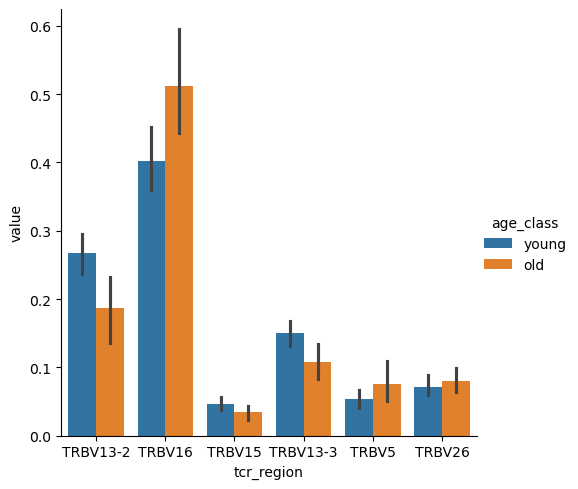

In [120]:
# Difference between cortex and medulla across all samples?
region_type = 'v'

pval_all = []
adata_filt = adata[adata.obs['cortex_medulla'] != 'NA']
adata_with_x = adata_filt[adata_filt.obs[f'beta_{region_type}'] != 'NA']

# Extracting beta values
x_regions = list(ast.literal_eval(i) for i in adata_with_x.obs[f'beta_{region_type}'])
x_regions_filt = []
for bead in x_regions:
    split = [i.split('(') for i in bead]
    x_to_score = {i[0][:-3]: i[1][:-1] for i in split}
    x_regions_filt.append(max(x_to_score, key=x_to_score.get))

# Add filtered beta values to the observation metadata
adata_with_x.obs['max_v'] = x_regions_filt

# Separate data for cortex and medulla
adata_cortex = adata_with_x[adata_with_x.obs['cortex_medulla'] == 'cortex']
adata_medulla = adata_with_x[adata_with_x.obs['cortex_medulla'] == 'medulla']

# Define TRB region lists
if region_type == 'v':
    trb_list = ['TRBV13-2', 'TRBV16', 'TRBV15', 'TRBV13-3', 'TRBV5', 'TRBV26']
elif region_type == 'j':
    trb_list = ['TRBJ1-4', 'TRBJ2-1', 'TRBJ2-5', 'TRBJ2-4', 'TRBJ1-3',
                'TRBJ1-2', 'TRBJ1-1', 'TRBJ2-3', 'TRBJ2-2', 'TRBJ1-5', 'TRBJ2-7', 'TRBJ1-6']

# Initialize dictionary to store region frequencies over age
region_frac_over_age = {i: [] for i in trb_list}
adata_to_use = adata_with_x  # For all locations, adata_with_x; for cortex only, adata_cortex; for medulla only, adata_medulla

# Iterate over batches and calculate region frequencies
for batch in tqdm(set(adata_to_use.obs['Batch'])):
    adata_filt = adata_to_use[adata_to_use.obs['Batch'] == batch]
    cter = Counter(adata_filt.obs['max_v'])
    cter_frac = {i: cter[i] / sum(cter.values()) for i in cter}
    for region in trb_list:
        try:
            region_frac_over_age[region].append(cter_frac[region])
        except:
            region_frac_over_age[region].append(0)

# Initialize lists to store data for plotting
tcr_region_list = []
value_list = []
age_list = []

# Calculate t-test and store data
for region in region_frac_over_age:
    x = [puck_name_to_days[batch_to_puck_name[i]] for i in range(len(region_frac_over_age[region]))]
    y = region_frac_over_age[region]
   
    stat, pval = scipy.stats.ttest_ind(y[:27], y[27:])
    pval_all.append(pval)
    tcr_region_list = tcr_region_list + [region] * len(x)
    value_list = value_list + y
    age_list = age_list + x

# Correct p-values for multiple comparisons
corr_vals = stats.multitest.multipletests(pval_all, method='fdr_bh')
pval_corr_dict = {i: j for i, j in zip(pval_all, corr_vals[1])}
print(pval_corr_dict)

# Create a DataFrame for plotting
plotting_df = {'tcr_region': tcr_region_list,
               'value': value_list,
               'age': age_list,
               'age_class': ['young' if i <= 35 else 'old' for i in age_list]}

plotting_df = pd.DataFrame.from_dict(plotting_df)

# Plotting
sns.catplot(data=plotting_df, x='tcr_region', y='value', hue='age_class', kind='bar')
fn = f'vdj_bias_{region_type}.pdf'
plt.savefig(fn)

## Figure 2E and 2F

  0%|          | 0/3 [00:00<?, ?it/s]

9 90wks
Started with 343 TCR locs
Ended with 286 TCR locs


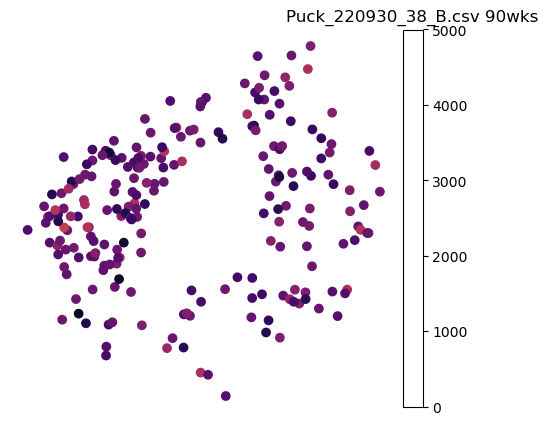

Iteration: 1
Number of Cortex Locations: 286


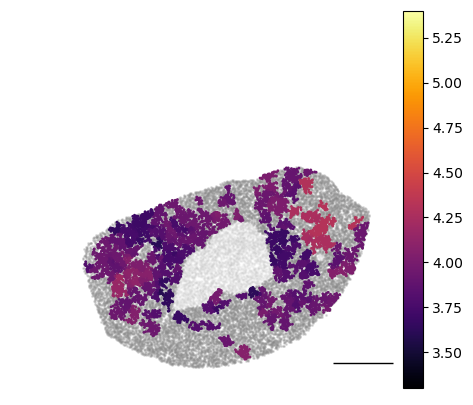

Iteration: 2
Number of Cortex Locations: 6823


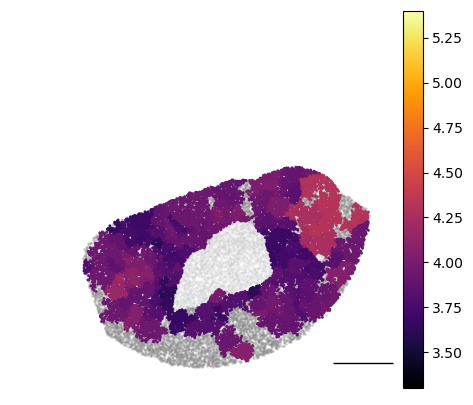

 33%|███▎      | 1/3 [00:11<00:22, 11.07s/it]

Hotspot dilation complete
34 1 day
Started with 1674 TCR locs
Ended with 1619 TCR locs


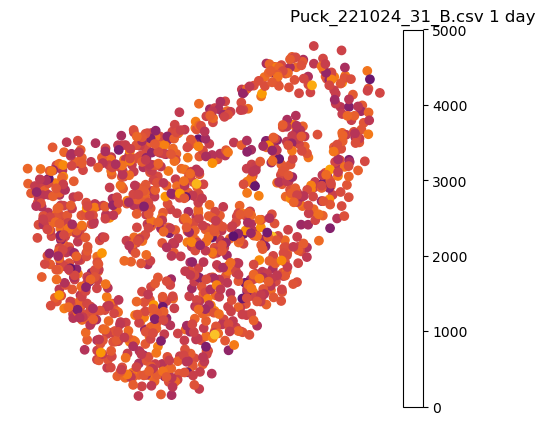

Iteration: 1
Number of Cortex Locations: 1619


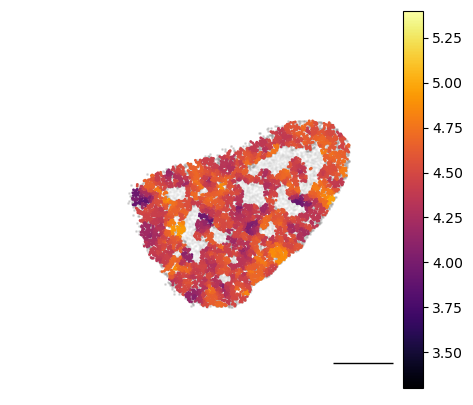

Iteration: 2
Number of Cortex Locations: 8301


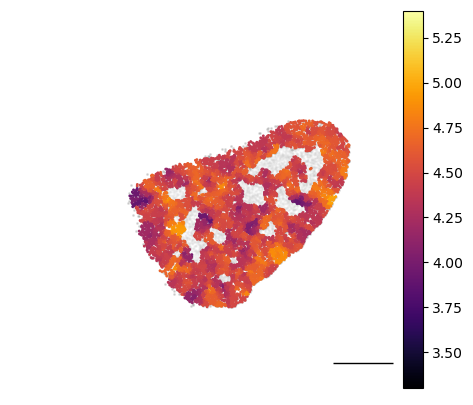

 67%|██████▋   | 2/3 [00:15<00:07,  7.15s/it]

Hotspot dilation complete
5 32wks
Started with 922 TCR locs
Ended with 920 TCR locs


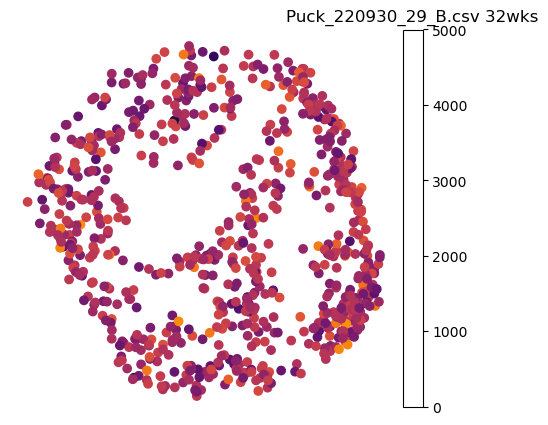

Iteration: 1
Number of Cortex Locations: 920


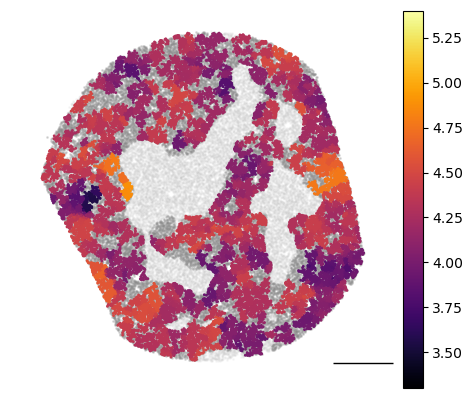

Iteration: 2
Number of Cortex Locations: 19321


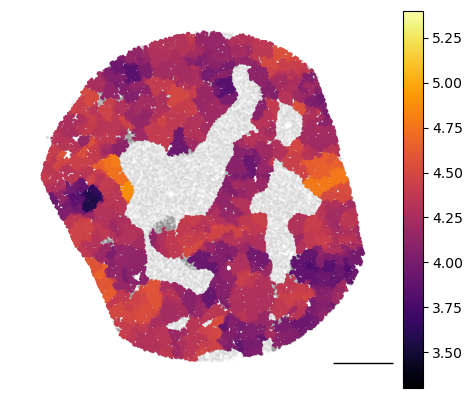

100%|██████████| 3/3 [00:56<00:00, 18.76s/it]

Hotspot dilation complete


In [130]:
# Show these three plots, selected from earlier section ("Calculate spatial diversity score and save as new data)
# Puck_220930_38 - 90 weeks
# Puck_221024_31 - 1 day
# Puck_220930_29 - 32 weeks

all_diversity_values = []

# Loop over the selected CSV files
for csv_name in tqdm(['Puck_220930_38_B.csv', 'Puck_221024_31_B.csv', 'Puck_220930_29_B.csv']):
    puck_name = csv_name_to_puck_name[csv_name]

    # Load necessary data
    batch = puck_name_to_batch[puck_name]
    timepoint = puck_name_to_timepoint[puck_name]
    print(batch, timepoint)
    bc_loc_dict_s1 = batch_to_bc_loc_dict[batch]
    loc_to_bc_s1 = batch_to_loc_bc_dict[batch]
    matched_bead_barcodes = batch_to_matched_bead_barcodes_dict[batch]

    df = pd.read_csv(directory + csv_name)

    try:
        cortex_medulla_df = pd.read_csv(f'{directory}{puck_name}_cortex_medulla.csv')
    except:
        print(f'{puck_name} is missing cortex_medulla')
        continue

    loc_to_cm = {i: j for i, j in zip(cortex_medulla_df.locations, cortex_medulla_df.cortex_medulla)}
    bc_to_cm = {loc_to_bc_s1[ast.literal_eval(i)]: loc_to_cm[i] for i in loc_to_cm}
    bc_cortex = [bc for bc in bc_to_cm if bc_to_cm[bc] == 'cortex']
    bc_medulla = [bc for bc in bc_to_cm if bc_to_cm[bc] == 'medulla']
    bc_all = [bc for bc in matched_bead_barcodes.values()]
    locs_medulla = [bc_loc_dict_s1[i] for i in bc_medulla]
    locs_cortex = [bc_loc_dict_s1[i] for i in bc_cortex]

    # Process the data
    clone_to_loc = {}
    loc_to_clone = {}
    loc_to_j = {}
    loc_to_v = {}
    for index, row in df.iterrows():
        clone = row['cdr3']
        loc = (float(row['x']), float(row['y']))

        loc_to_clone.setdefault(loc, []).append(clone)
        clone_to_loc.setdefault(clone, []).append(loc)
        loc_to_v.setdefault(loc, []).append(row['allVHitsWithScore'])
        loc_to_j.setdefault(loc, []).append(row['allJHitsWithScore'])

    all_tcr_locs = list(loc_to_clone.keys())
    point_tree = cKDTree(all_tcr_locs)
    diversity = []
    num_neighbors = 20

    print(f'Started with {len(all_tcr_locs)} TCR locs')
    all_tcr_locs_keep = []
    for point in all_tcr_locs:
        idx_closeby_points = point_tree.query_ball_point(point, r=200/0.65)
        if len(idx_closeby_points) < 5:
            continue
        dist, idx = point_tree.query(point, num_neighbors)
        close_pts = [all_tcr_locs[i] for i in idx]
        close_clones = [loc_to_clone[i] for i in close_pts]
        close_clones = list(itertools.chain.from_iterable(close_clones))
        fractions = [i / len(close_clones) for i in list(Counter(close_clones).values())]
        diversity.append(skbio.diversity.alpha.shannon(fractions))
        all_tcr_locs_keep.append(point)

    all_tcr_locs = copy.deepcopy(all_tcr_locs_keep)
    loc_to_diversity = {i:j for i,j in zip(all_tcr_locs,diversity)}

    print(f'Ended with {len(all_tcr_locs)} TCR locs')
    all_diversity_values += diversity

    # Plot of all TCRs
    all_tcr_locs = set(all_tcr_locs)
    all_tcr_locs_filt, div_filt = zip(*[[i, j] for i, j in zip(all_tcr_locs, diversity) if i in locs_cortex])
    x, y = zip(*all_tcr_locs_filt)
    fig = plt.figure(figsize=(5, 5))
    p = plt.scatter(x, y, c=div_filt, cmap='inferno', vmin=3.3, vmax=5.4)
    plt.axis('off')
    cb_ax = fig.add_axes([.91, .124, .04, .754])
    fig.colorbar(p, orientation='vertical', cax=cb_ax)
    plt.title(csv_name + ' ' + timepoint)
    plt.xlim([0, 5000])
    plt.ylim([0, 5000])
    plt.show()

    # Save diversity data
    if timepoint not in record:
        record[timepoint] = []
    record[timepoint] += diversity

    # Make exvar for C-SIDE
    exvar_recorder = {
        'barcode': [loc_to_bc_s1[i] for i in all_tcr_locs],
        'x': [i[0] for i in all_tcr_locs],
        'y': [i[1] for i in all_tcr_locs],
        'diversity': diversity,
        'diversity_binar': [1 if i > 4.48 else 0 for i in diversity],
        'diversity_norm': [(i - 3.74) / 1.69 for i in diversity]
    }
    
    # Save diversity data to CSV
    df_diversity = pd.DataFrame.from_dict(exvar_recorder)
    df_diversity.to_csv(f'{puck_name}_diversity.csv')

    # Perform cortex dilation and update dictionaries
    cort_loc_to_diversity = dilate_cortex_points(bc_cortex, bc_medulla, bc_loc_dict_s1,
                                                  loc_to_bc_s1, matched_bead_barcodes,
                                                  locs_cortex, loc_to_diversity, filt_plot=True)

    # Update dictionaries with new data
    cort_loc_to_diversity_all[puck_name] = cort_loc_to_diversity
    loc_to_clone_all[puck_name] = loc_to_clone
    clone_to_loc_all[puck_name] = clone_to_loc
    loc_to_v_all[puck_name] = loc_to_v
    loc_to_j_all[puck_name] = loc_to_j


In [132]:
# Compute percentiles for differential expression
all_div_values = [value for timepoint_values in cort_loc_to_diversity_all.values() for value in timepoint_values.values()]
lowest_portion = np.percentile(all_div_values, 10)
highest_portion = np.percentile(all_div_values, 90)

# Count values falling below the lowest 10th percentile and above the highest 90th percentile
below_lowest = sum(1 for value in all_div_values if value < lowest_portion)
above_highest = sum(1 for value in all_div_values if value > highest_portion)

# Print the counts
print(f"Total number of diversity values: {len(all_div_values)}")
print(f"Number of values below the lowest 10th percentile: {below_lowest}")
print(f"Number of values above the highest 90th percentile: {above_highest}")

cort_loc_to_diversity_all_filtered = {}

# Binarize diversity values into top and bottom categories
for puck, loc_diversity in cort_loc_to_diversity_all.items():
    filtered_diversity = {loc: 0 for loc, div_value in loc_diversity.items() if div_value < lowest_portion}
    filtered_diversity.update({loc: 1 for loc, div_value in loc_diversity.items() if div_value > highest_portion})
    if filtered_diversity:  # Check if there are any filtered values
        cort_loc_to_diversity_all_filtered[puck] = filtered_diversity


Total number of diversity values: 843611
Number of values below the lowest 10th percentile: 83847
Number of values above the highest 90th percentile: 84360


In [133]:
# Print missing timepoints
missing_timepoints = [tpt for tpt in set(puck_name_to_timepoint.values()) if tpt not in tpt_order]
print('Missing time points:')
print(missing_timepoints)

# Define index values for age categories
young_id_val = tpt_order.index('7wks')  # all timepoints younger than this timepoint
mid_id_val = tpt_order.index('13 wks')  # all timepoints younger than this timepoint

# Initialize lists to store data
record_timepoints = []
record_div = []
record_youngold = []
record_youngmidold = []

# Iterate over timepoints and diversity values
for tpt in record:
    if tpt not in tpt_order:
        print(f'{tpt} is missing')
        continue
    for div in record[tpt]:
        record_timepoints.append(tpt)
        record_div.append(div)
        id_val = tpt_order.index(tpt)
        # Determine age categories
        if id_val < young_id_val:
            record_youngold.append('young')
            record_youngmidold.append('young')
        else:
            record_youngold.append('old')
            if id_val < mid_id_val:
                record_youngmidold.append('mid')
            else:
                record_youngmidold.append('old')

# Create DataFrame from the collected data
df = pd.DataFrame.from_dict({
    'timepoint': record_timepoints,
    'diversity': record_div,
    'young_old': record_youngold,
    'young_mid_old': record_youngmidold
})

# Set figure size
plt.figure(figsize=(2, 5))

# Create violin plot
sns.violinplot(data=df, x='young_old', y='diversity', order=['young', 'old'])

# Save the plot
plt.savefig('Young_old_tcr_div_violin_plot.pdf')

# Perform t-test
t_stat, p_val = scipy.stats.ttest_ind(df[df.young_old == 'young'].diversity,
                                       df[df.young_old == 'old'].diversity)

print("T-test results:")
print(f"T-statistic: {t_stat}")
print(f"P-value: {p_val}")


Missing time points:
[]


## Figure 2G and S4C

In [ ]:
# Load data from h5ad file
with open(f'{directory}Thymus_data_TCR_locs_diver.h5ad', "rb") as handle:
    adata = sc.read_h5ad(handle)
    
# Create mappings between batch and puck names
batch_to_puck_name = {i: j for i, j in enumerate(puck_names)}
puck_name_to_batch = {j: i for i, j in enumerate(puck_names)}

batch_all = adata.obs.Batch

# Initialize dictionaries to store data
batch_to_bc_loc_dict = {}
batch_to_loc_bc_dict = {}
batch_to_matched_bead_barcodes_dict = {}

for b in tqdm(range(len(puck_names))):
    p = batch_to_puck_name[b]
    abbrev_sample_reference = p[11:]
    fn = f'{directory}{abbrev_sample_reference}_barcode_matching.txt'
    bc_loc_df = pd.read_csv(fn, sep='\t', header=None)
    spatial_barcodes_s1 = list(bc_loc_df[0])
    spatial_locations_s1 = [(i, j) for i, j in zip(bc_loc_df[2], bc_loc_df[3])]
    bc_loc_dict_s1 = {i: j for i, j in zip(spatial_barcodes_s1, spatial_locations_s1)}
    loc_to_bc_s1 = {j: i for i, j in zip(spatial_barcodes_s1, spatial_locations_s1)}
    matched_bead_barcodes = {i: j for i, j in zip(bc_loc_df[1], bc_loc_df[0])}
    batch_to_bc_loc_dict[b] = copy.deepcopy(bc_loc_dict_s1)
    batch_to_loc_bc_dict[b] = copy.deepcopy(loc_to_bc_s1)
    batch_to_matched_bead_barcodes_dict[b] = copy.deepcopy(matched_bead_barcodes)

cort_loc_to_diversity_all = pkl_load(f'{directory}cort_loc_to_diversity_all')
loc_to_clone_all = pkl_load(f'{directory}loc_to_clone_all')
clone_to_loc_all = pkl_load(f'{directory}clone_to_loc_all')
loc_to_v_all = pkl_load(f'{directory}loc_to_v_all')
loc_to_j_all = pkl_load(f'{directory}loc_to_j_all')
all_diversity_values = pkl_load(f'{directory}all_diversity_values')
record = pkl_load(f'{directory}record')
record_all_div = pkl_load(f'{directory}record_all_div')
exvar_recorder = pkl_load(f'{directory}exvar_recorder')

100%|██████████| 1125219/1125219 [00:06<00:00, 170132.30it/s]
/tmp/ipykernel_17075/3598074556.py:37: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['diversity_group'] = diversity_label


/PHShome/sx931/.conda/envs/aging-thymus/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


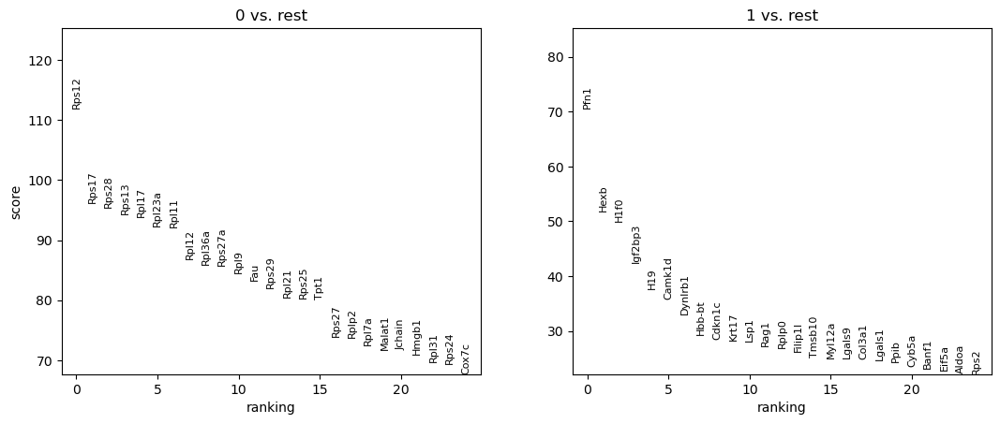

100%|██████████| 4421/4421 [00:00<00:00, 80131.62it/s]

601
267


In [165]:
# Create a dictionary to store barcode groups based on age
age_to_bc_group = {}

# Filter out cells with 'NA' cortex_medulla values
adata = adata[adata.obs['cortex_medulla'] != 'NA']

# Extract relevant data
bc_all = list(adata.obs.index)
batch_all = adata.obs.Batch
age_all = [batch_to_tpt[int(i) - 1] for i in batch_all]
diversity_label = []

# Iterate over each cell
for idx in tqdm(range(len(bc_all))):
    # Extract batch and puck information
    batch = batch_all[idx] - 1
    puck_name = batch_to_puck_name[batch]
    age = age_all[idx]
    bc = bc_all[idx].split('_')[2][:-2]

    # Get barcode to location mappings
    loc_to_bc_dict = batch_to_loc_bc_dict[batch]
    bc_to_loc_dict = batch_to_bc_loc_dict[batch]
    matched_bead_barcodes = batch_to_matched_bead_barcodes_dict[batch]
    loc = bc_to_loc_dict[matched_bead_barcodes[bc + '-1']]

    # Check if the puck and location are present in the diversity data
    if puck_name not in cort_loc_to_diversity_all_filtered or loc not in cort_loc_to_diversity_all_filtered[puck_name]:
        div_val = 'NA, skip puck' if puck_name not in cort_loc_to_diversity_all_filtered else 'NA, skip loc'
    else:
        div_val = cort_loc_to_diversity_all_filtered[puck_name][loc]

    # Assign diversity value to the cell
    diversity_label.append(div_val)

# Assign diversity groups to the cell annotations
adata.obs['diversity_group'] = diversity_label
adata.obs['diversity_group'] = adata.obs['diversity_group'].astype('category')

# Filter genes based on minimum cell count
sc.pp.filter_genes(adata, min_cells=100)

# Normalize the data
sc.pp.normalize_total(adata, target_sum=1e4)

# Log-transform the data
sc.pp.log1p(adata)

# Filter cells based on diversity groups
adata_filt = adata[adata.obs['diversity_group'].isin([0, 1])]

# Perform differential gene expression analysis
sc.tl.rank_genes_groups(adata_filt, groupby='diversity_group', key_added='diversity_results', use_raw=False)

# Visualize the results
sc.pl.rank_genes_groups(adata_filt, key='diversity_results', n_genes=25, sharey=False, use_raw=False)

# Set thresholds for significance
pval_cutoff = 0.05
lfc_cutoff = 0.5

# Initialize lists to store significant genes
glist_0 = []
glist_1 = []
results = adata_filt.uns['diversity_results']

# Iterate over results to identify significant genes
for idx in tqdm(range(len(results['names']))):
    gene = results['names'][idx][0]
    pval_adj = results['pvals_adj'][idx][0]
    lfc = results['logfoldchanges'][idx][0]

    # Check if the gene is significant for each diversity group
    if pval_adj < pval_cutoff and lfc > lfc_cutoff:
        glist_0.append(gene)
    if pval_adj < pval_cutoff and lfc < -lfc_cutoff:
        glist_1.append(gene)

# Print the number of significant genes for each group
print(len(glist_0))
print(len(glist_1))

In [166]:
# Perform enrichment analysis using GSEApy
enr_res = gseapy.enrichr(gene_list=glist_0,  # Gene list for enrichment analysis
                         organism='Mouse',  # Organism (e.g., 'Mouse' or 'Human')
                         gene_sets='MSigDB_Hallmark_2020',  # Gene sets to use for enrichment
                         cutoff=0.05)  # Adjusted p-value cutoff for significance

# Extract and display enrichment analysis results
enr_res.results

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Allograft Rejection,29/200,2.173261e-12,1.043165e-10,0,0,5.700855,153.095269,CD86;CXCL9;IGSF6;LY75;CFP;RPL9;CTSS;CD79A;RPS1...
1,MSigDB_Hallmark_2020,Inflammatory Response,27/200,6.785339e-11,1.628481e-09,0,0,5.227508,122.395157,CXCL9;CSF3R;EBI3;LPAR1;CXCR6;SLC7A2;ADGRE1;GNA...
2,MSigDB_Hallmark_2020,Apoptosis,21/161,1.667862e-08,2.668579e-07,0,0,4.980776,89.201404,TOP2A;APP;JUN;GSTM1;GSN;ROCK1;HMGB2;BGN;HSPB1;...
3,MSigDB_Hallmark_2020,Complement,22/200,1.696192e-07,2.035431e-06,0,0,4.102987,63.964369,LYN;C1QA;KLK1;CFH;HSPA5;LRP1;PLEK;PRCP;PLA2G7;...
4,MSigDB_Hallmark_2020,KRAS Signaling Up,21/200,7.016999e-07,6.736319e-06,0,0,3.887690,55.087637,ADAMDEC1;CFH;PRRX1;FLT4;LAPTM5;KLF4;CTSS;DCBLD...
5,MSigDB_Hallmark_2020,IL-6/JAK/STAT3 Signaling,13/87,1.907014e-06,1.525611e-05,0,0,5.773695,76.039396,ACVRL1;CXCL9;JUN;CSF3R;EBI3;DNTT;IL17RA;IL1B;C...
6,MSigDB_Hallmark_2020,Interferon Gamma Response,20/200,2.755269e-06,1.889327e-05,0,0,3.675464,47.053271,CD86;CD74;SAMD9L;CXCL9;CIITA;VCAM1;EIF4E3;CFH;...
7,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,17/200,1.195002e-04,6.373344e-04,0,0,3.056666,27.608395,ABCA1;JUN;JAG1;CD83;CEBPD;PLEK;TNFAIP2;ATP2B1;...
8,MSigDB_Hallmark_2020,Myc Targets V1,17/200,1.195002e-04,6.373344e-04,0,0,3.056666,27.608395,NOP56;NPM1;HNRNPA3;SET;CBX3;RPS6;U2AF1;DEK;RPL...
9,MSigDB_Hallmark_2020,mTORC1 Signaling,16/200,3.728054e-04,1.789466e-03,0,0,2.856187,22.548040,FKBP2;IGFBP5;HSPA5;SRD5A1;FGL2;CFP;TUBA4A;HSP9...


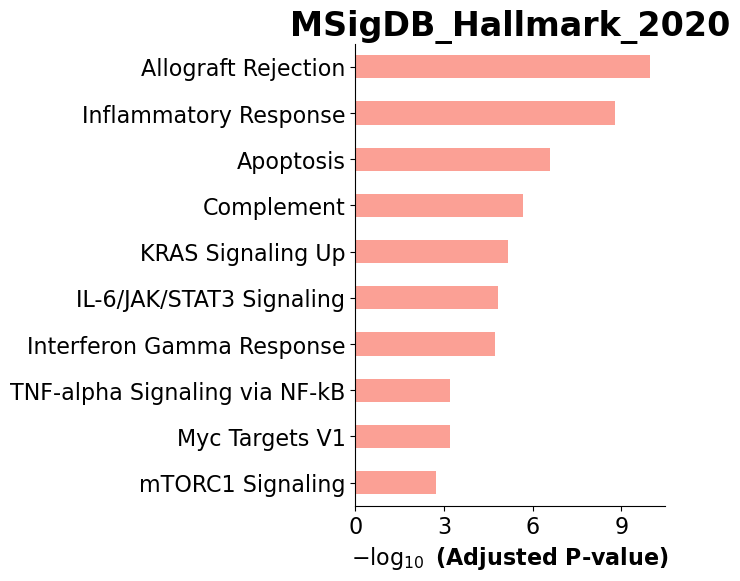

In [167]:
# Generate barplot for gene set enrichment analysis results
gseapy.barplot(enr_res.res2d, title='MSigDB_Hallmark_2020')

# Save the barplot as a PDF file
plt.savefig('MSigDB_Hallmark_2020_decrease_diversity.pdf')

Igf2bp3 2.2445319 306.61134219934587
H19 2.40415 306.61134219934587
Hbb-bt 2.3074706 185.54222256162183
Rag1 [0.48639157, 160.7910471948301, 0.05697540855218504, 0.047976501305483026]
Rag1 [0.48639157, 160.7910471948301, 0.05697540855218504, 0.047976501305483026]
Lgals1 0.5840844 131.740466557725
Herpud1 -0.758799 72.42476974340423
Dbi -0.47925776 91.58849208636126
Birc5 -0.4453961 113.98331636145538
Gas6 -0.81949365 118.33929273818755


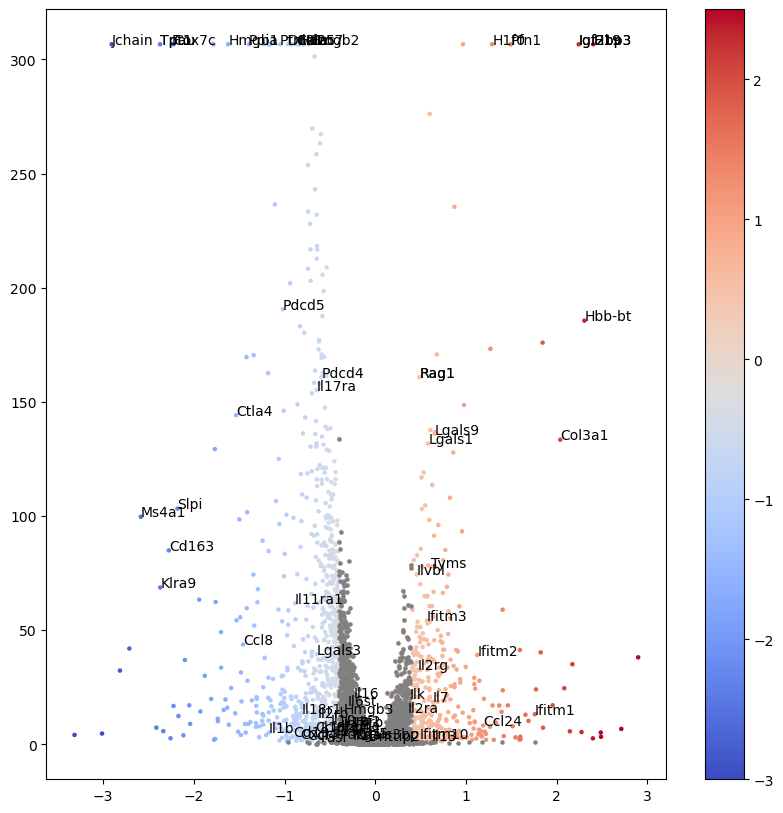

In [170]:
names = adata_filt.uns['diversity_results']['names']
gene_names = [i[1] for i in names]

# Extract p-values and adjust them
pval_adj = adata_filt.uns['diversity_results']['pvals_adj']
pval = [i[1] for i in pval_adj]
# If p-value is 0, set it to the minimum p-value in the list
pval = [-np.log10(i) if i!=0 else -np.log10((min([i for i in pval if i!= 0]))) for i in pval]

# Extract log-fold changes
lfc = adata_filt.uns['diversity_results']['logfoldchanges']
lfc = [i[1] for i in lfc]

# Filter by cell types
adata_filt_low = adata_filt[adata_filt.obs['diversity_group'] == 0]
adata_filt_high = adata_filt[adata_filt.obs['diversity_group'] == 1]

# Calculate fraction expressed in low diversity group
arr_low = scipy.sparse.csr_matrix.toarray(adata_filt_low.X)
arr_low = arr_low.astype(bool).sum(axis=0)
frac_exp_low = [i/len(adata_filt_low) for i in arr_low]

# Calculate fraction expressed in high diversity group
arr_high = scipy.sparse.csr_matrix.toarray(adata_filt_high.X)
arr_high = arr_high.astype(bool).sum(axis=0)
frac_exp_high = [i/len(adata_filt_high) for i in arr_high]

# Filter results based on gene criteria
scores = adata_filt.uns['diversity_results']['scores']
lfc_filt = []
pval_filt = []
frac_exp_low_filt = []
frac_exp_high_filt = []
gene_names_filt = []
for i,txt in enumerate(gene_names):
    if 'Rps' in txt or 'Rpl' in txt or 'Mt-' in txt: # Skip ribosomal genes and mitochondria-related genes
        continue
    lfc_filt.append(lfc[i])
    pval_filt.append(pval[i])
    frac_exp_low_filt.append(frac_exp_low[i])
    frac_exp_high_filt.append(frac_exp_high[i])
    gene_names_filt.append(txt)

# Select significant genes based on p-value and log-fold change thresholds
fig,ax = plt.subplots(figsize=(10,10))
lfc_sig, pval_sig = zip(*[(i,j) for i,j in zip(lfc_filt,pval_filt) if ((j > -np.log10(0.05)) and (np.abs(i)>0.1))])
frac_exp_low_sig, _ = zip(*[(i,j) for i,j in zip(frac_exp_low_filt,pval_filt) if ((j > -np.log10(0.05)))])
frac_exp_high_sig, _ = zip(*[(i,j) for i,j in zip(frac_exp_high_filt,pval_filt) if ((j > -np.log10(0.05)))])
plt.scatter(lfc_sig,pval_sig,s=5, c = lfc_sig, cmap = 'coolwarm', vmin = -3, vmax = 2.5)
plt.colorbar()
lfc_insig, pval_insig = zip(*[(i,j) for i,j in zip(lfc_filt,pval_filt) if((j <= -np.log10(0.05)) or (np.abs(i)<0.4))])
plt.scatter(lfc_insig,pval_insig,c='gray',s=5)

# Annotate significant genes
annotated_genes = ['Rag1','Ifitm','Lgals','Tyms','Nlrp3',
                   'Cxcr3','Fasl','Cd19','Ccl3','Tpt1','Hmgb','Ppia','Ptma','Ccl','Il',
                   'Dntt','Hdac7','Atrx'
                  'Hexb','H1f0','Pfn1','Igf2bp3','H19','Ctla4','Rag1','Pdcd','Ccl25']
record_all_annotated_genes = {}
for i, txt in enumerate(gene_names_filt):
    if pval_filt[i]<-np.log10(0.05):
        continue
    for g in annotated_genes:
        if g in txt:
            ax.annotate(txt, (lfc_filt[i], pval_filt[i]))
            record_all_annotated_genes[txt] = [lfc_filt[i],pval_filt[i],frac_exp_low[i],frac_exp_high[i]]
            if g == 'Rag1':
                print('Rag1',record_all_annotated_genes[txt])
    if pval_filt[i] < 50:
        continue
    if np.abs(lfc_filt[i])>2:
        if pval[i] > -np.log10(0.05):
            ax.annotate(txt, (lfc_filt[i], pval_filt[i]))
            record_all_annotated_genes[txt] =  [lfc_filt[i],pval_filt[i],frac_exp_low[i],frac_exp_high[i]]
    if np.abs(lfc[i]) >= 2:
        print(txt,lfc_filt[i],pval_filt[i])
plt.savefig('volcano_de_div.pdf')

## Figure 2H

100%|██████████| 3/3 [00:47<00:00, 15.92s/it]


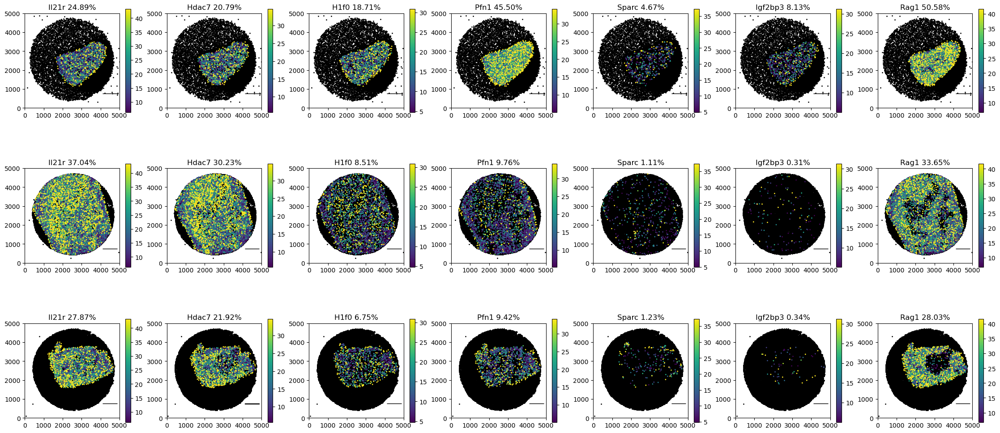

In [171]:
# Define a dictionary to store loaded pucks
loaded_pucks = {}

# Define the pucks and genes to plot
pucks_to_plot = [
    "2022-11-23_Puck_221024_31",  # 1 day
    "2022-12-16_Puck_220930_29_trunc",  # 32 weeks
    "2022-12-16_Puck_220930_37_trunc"  # 90 weeks
]

genes_to_plot = ['Il21r', 'Hdac7', 'H1f0', 'Pfn1', 'Sparc', 'Igf2bp3', 'Rag1']

# Call the function to plot gene expression on specified pucks for selected genes
plot_gene_expression_on_pucks(pucks_to_plot, genes_to_plot)

## Figure S4D, S4F

In [50]:
# Read the raw and processed datasets
with open(f'{directory}thymuscombined_raw_xy.h5ad', "rb") as handle:
    adata_raw = sc.read_h5ad(handle)

with open(f'{directory}thymuscombined_xy.h5ad', "rb") as handle:
    adata = sc.read_h5ad(handle)

# Extract puck information and corresponding timepoints
pucks = [batch_to_puck_name[i] for i in list(adata_raw.obs.Batch)]
timepoints = [puck_to_time[i] for i in pucks]
days = [tpt_to_day[i] for i in timepoints]

# Assign age information to the raw dataset
adata_raw.obs['Age'] = days

# Filter the raw dataset to include only barcodes with assigned cell types
bcs_with_cell_types_assigned = set(adata.obs.index)
adata_raw_with_cell_types = adata_raw[adata_raw.obs.index.isin(bcs_with_cell_types_assigned)]

# Map barcode to cell type and spot class
bc_to_ct_all = {i: j for i, j in zip(adata.obs.index, adata.obs.Cell_type)}
bc_to_spot_class = {i: j for i, j in zip(adata.obs.index, adata.obs.Spot_class)}

# Assign cell types and spot classes to the raw dataset
adata_raw_with_cell_types.obs['Cell_type'] = [bc_to_ct_all[i] for i in list(adata_raw_with_cell_types.obs.index)]
adata_raw_with_cell_types.obs['Spot_class'] = [bc_to_spot_class[i] for i in list(adata_raw_with_cell_types.obs.index)]

# Filter the dataset for analysis, considering only singlet cells
adata_analyze = adata_raw_with_cell_types[adata_raw_with_cell_types.obs['Spot_class'] == 'singlet']


/tmp/ipykernel_44408/3831988677.py:25: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_raw_with_cell_types.obs['Cell_type'] = [bc_to_ct_all[i] for i in list(adata_raw_with_cell_types.obs.index)]
/PHShome/sx931/.conda/envs/aging-thymus/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [62]:
# Test and correct p values for these genes
genes_to_test = ['Rag1','Hdac7','Pfn1','Il21r','H1f0','Ccl25','Itm2a','Runx3']

# Get the list of all genes in the dataset
all_genes = list(adata_analyze.var.features)

# Initialize a list to store p-values for correction
pval_all_rec_for_correction = []

# Iterate over each gene to test
for gene_to_test in tqdm(genes_to_test):
    gene_index = all_genes.index(gene_to_test)

    # Iterate over each cell type
    for cell_type in ['DN(P)', 'DN(Q)', 'DP(P)', 'DP(Q)', 'CD4+T', 'CD8+T']:
        cell_type_index = ['DN(P)', 'DN(Q)', 'DP(P)', 'DP(Q)', 'CD4+T', 'CD8+T'].index(cell_type)

        # Filter the data for the specific cell type
        adata_analyze_ct = adata_analyze[adata_analyze.obs['Cell_type'] == cell_type]
        times = adata_analyze_ct.obs.Age

        # Get gene expression data for the specific cell type
        cts = adata_analyze_ct.X[:, gene_index]
        values = cts.toarray()
        
        # Normalize values to total counts per cell
        cts_per_cell = np.array(adata_analyze_ct.X.sum(axis=1))
        values = values / cts_per_cell  
        values = [float(i) for i in values]

        # Calculate timepoint averages
        timepoint_averages = {}
        for time, value in zip(times, values):
            if time in timepoint_averages:
                timepoint_averages[time].append(value)
            else:
                timepoint_averages[time] = [value]

        unique_times = sorted(list(set(times)))
        averages = [float(sum(timepoint_averages[time]) / len(timepoint_averages[time])) for time in unique_times]
        if sum(averages) == 0:
            averages = averages
        else:
            # Z-score averages
            averages = scipy.stats.zscore(averages)

        # Calculate Pearson correlation coefficient and p-value
        stat, pval = scipy.stats.pearsonr(np.log10([i + 1 for i in unique_times]), averages)
        pval_all_rec_for_correction.append(pval)

        # Print gene, cell type, correlation coefficient, and p-value
        # print(gene_to_test, cell_type, stat, pval)

        # Additional plotting and analysis can be done here if needed

100%|██████████| 8/8 [00:15<00:00,  1.98s/it]


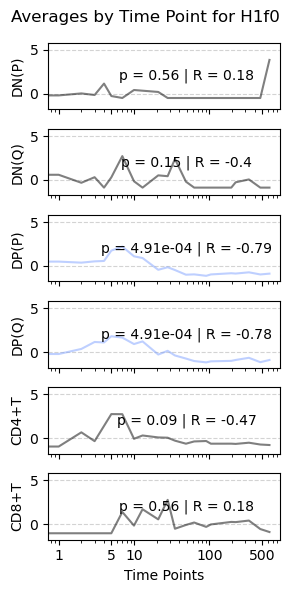

In [63]:
# Correct p-values using the Benjamini-Hochberg method and create a dictionary for corrected p-values
_, new_pval, _, _ = stats.multitest.multipletests(pval_all_rec_for_correction, method='fdr_bh')
corr_pval = dict(zip(pval_all_rec_for_correction, new_pval))

# Specify the gene for analysis
gene = 'H1f0'

# Create subplots for each cell type
fig, ax = plt.subplots(6, 1, figsize=(3, 6), sharex=True)

# Initialize variables for y-axis limits
ylim_min = 0
ylim_max = 0

# Initialize a list to store heatmap data
heatmap = []

# Iterate over each cell type
for cell_type in ['DN(P)', 'DN(Q)', 'DP(P)', 'DP(Q)', 'CD4+T', 'CD8+T']:
    # Get the index of the cell type
    idx = ['DN(P)', 'DN(Q)', 'DP(P)', 'DP(Q)', 'CD4+T', 'CD8+T'].index(cell_type)
    
    # Filter the data for the specific cell type
    adata_analyze_ct = adata_analyze[adata_analyze.obs['Cell_type'] == cell_type]
    times = adata_analyze_ct.obs.Age

    # Get gene expression data for the specific cell type
    gene_index = all_genes.index(gene)
    cts = adata_analyze_ct.X[:, gene_index]
    values = cts.toarray()

    # Normalize values to total counts per cell
    cts_per_cell = np.array(adata_analyze_ct.X.sum(axis=1))
    values = values / cts_per_cell  
    values = [float(i) for i in values]

    # Calculate timepoint averages
    timepoint_averages = {}
    for time, value in zip(times, values):
        if time in timepoint_averages:
            timepoint_averages[time].append(value)
        else:
            timepoint_averages[time] = [value]

    unique_times = sorted(list(set(times)))
    averages = [float(sum(timepoint_averages[time]) / len(timepoint_averages[time])) for time in unique_times]
    
    # Check if all averages are zero
    if sum(averages) == 0:
        averages = averages
    else:
        # Z-score averages
        averages = scipy.stats.zscore(averages)

    # Calculate Pearson correlation coefficient and fetch corrected p-value
    stat, pval = scipy.stats.pearsonr(np.log10([i + 1 for i in unique_times]), averages)
    pval = corr_pval[pval]
    
    # Prepare text for annotation
    if pval < 0.05:
        text_to_print = f'p = {pval:.2e} | R = {round(stat,2)}'
    else:
        text_to_print = f'p = {round(pval,2)} | R = {round(stat,2)}'
    
    # Set xscale and xticks for logarithmic time points
    ax[idx].set_xscale('log')
    ax[idx].set_xticks([1, 5, 10, 100, 500], labels=[1, 5, 10, 100, 500])

    # Add annotation text
    ax[idx].text(50, 2, text_to_print, ha='center', va='center')
    
    # Plot the data
    if pval > 0.05:
        ax[idx].plot(unique_times, averages, alpha=0.5, label=cell_type + f'pval: {pval}, r: {stat}', color='k')
    else:
        if stat > 0:
            ax[idx].plot(unique_times, averages, alpha=0.5, label=cell_type + f'pval: {pval}, r: {stat}', color='#FE807F')
        else:
            ax[idx].plot(unique_times, averages, alpha=0.5, label=cell_type + f'pval: {pval}, r: {stat}', color='#7EA1FF')
            
    # Set labels and ticks
    plt.xlabel('Time Points')
    ax[idx].set_ylabel(cell_type)
    
    # Update y-axis limits
    if max(averages) > ylim_max:
        ylim_max = max(averages)
    if min(averages) < ylim_min:
        ylim_min = min(averages)
        
    # Append averages to heatmap data
    heatmap.append(list(averages))
    
    # Add grid lines
    ax[idx].grid(axis='y', linestyle='--', color='lightgray')
    
# Set the title of the figure
fig.suptitle(f'Averages by Time Point for {gene}')

# Set y-axis limits for all subplots
for a in ax:
    a.set_ylim([ylim_min * 1.5, ylim_max * 1.5])

# Adjust layout and save the plot
plt.tight_layout()
plt.savefig(f'{g}_changes_thymocytes.pdf')


## Figure S4E

In [213]:
# Read the AnnData object from the h5ad file
with open(f'{directory}Thymus_data_TCR_locs_diver.h5ad', "rb") as handle:
    adata = sc.read_h5ad(handle)

53816
90212


100%|██████████| 192/192 [00:00<00:00, 29430.49it/s]

100%|██████████| 524/524 [00:00<00:00, 29009.85it/s]

0it [00:00, ?it/s]
2629it [00:00, 26282.07it/s]
5649it [00:00, 28583.42it/s]
8635it [00:00, 29161.70it/s]
13481it [00:00, 29734.98it/s]
100%|██████████| 317/317 [00:00<00:00, 27999.71it/s]

100%|██████████| 606/606 [00:00<00:00, 29695.05it/s]

0it [00:00, ?it/s]
1727it [00:00, 17266.85it/s]
5012it [00:00, 26428.03it/s]
8303it [00:00, 29383.22it/s]
11556it [00:00, 30624.67it/s]
14779it [00:00, 31202.86it/s]
19929it [00:00, 29979.76it/s]
100%|██████████| 99/99 [00:00<00:00, 25165.82it/s]

100%|██████████| 307/307 [00:00<00:00, 29403.80it/s]

0it [00:00, ?it/s]
2896it [00:00, 28956.09it/s]
6053it [00:00, 30489.08it/s]
11257it [00:00, 28175.46it/s][A
100%|██████████| 225/225 [00:00<00:00, 27420.12it/s]

100%|██████████| 521/521 [00:00<00:00, 29318.99it/s]

0it [00:00, ?it/s]
2908it [00:00, 29073.23it/s]
6144it [00:00, 31004.63it/s]
9406it [00:00, 31737.50it/s]
15665it [00:00, 31209.7

/PHShome/sx931/.conda/envs/aging-thymus/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/PHShome/sx931/.conda/envs/aging-thymus/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


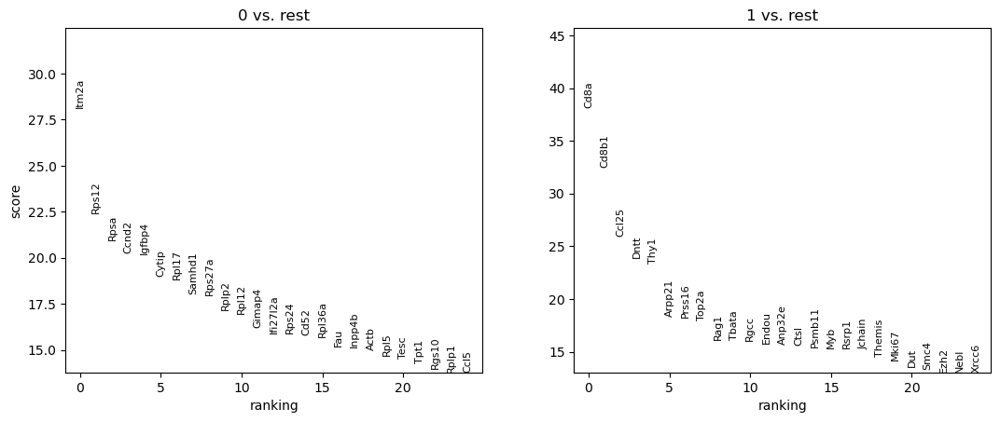

In [214]:
# Assign CD4 or CD8 label based on the 'Cell_type' column in adata.obs
cd4_cd8 = []
for cell_type in adata.obs['Cell_type']:
    if cell_type == 'CD4+T':
        cd4_cd8.append('CD4')
    elif cell_type == 'CD8+T':
        cd4_cd8.append('CD8')
    else:
        cd4_cd8.append('NA')

# Add 'cd4_cd8' column to adata.obs
adata.obs['cd4_cd8'] = cd4_cd8

# Print the number of CD4 and CD8 cells
print(len(adata[adata.obs['Cell_type'] == 'CD4+T']))  # Number of CD4 cells
print(len(adata[adata.obs['Cell_type'] == 'CD8+T']))  # Number of CD8 cells

# Create 'cd4_cd8_label_neighbor' column to identify neighboring CD4 and CD8 cells
cd4_cd8_label_neighbor = []

# Iterate over batches to identify neighbors that are CD4 and CD8 cells
for batch in tqdm(range(int(max(adata.obs['Batch'])))):
    batch += 1
    adata_batch = adata[adata.obs['Batch'] == batch]

    # Split data into CD4, CD8, and other cells
    adata_batch_cd4 = adata_batch[adata_batch.obs['cd4_cd8'] == 'CD4']
    adata_batch_cd8 = adata_batch[adata_batch.obs['cd4_cd8'] == 'CD8']
    adata_batch_other = adata_batch[adata_batch.obs['cd4_cd8'] == 'NA']

    # Create dictionaries for barcode to location mapping
    all_locs = [(x, y) for x, y in zip(adata_batch.obs['x_val'], adata_batch.obs['y_val'])]
    all_bcs = [i.split('_')[2] for i in adata_batch.obs.index]
    loc_to_bc = {loc: bc for loc, bc in zip(all_locs, all_bcs)}
    bc_to_loc = {bc: loc for bc, loc in zip(all_bcs, all_locs)}
    
    # Define M1 (CD4) and M2 (CD8) cell locations
    m1_locs = [(x, y) for x, y in zip(adata_batch_cd4.obs['x_val'], adata_batch_cd4.obs['y_val'])]
    m2_locs = [(x, y) for x, y in zip(adata_batch_cd8.obs['x_val'], adata_batch_cd8.obs['y_val'])]
    
    # Create a set of other cell locations
    other_locs = {(x, y) for x, y in zip(adata_batch_other.obs['x_val'], adata_batch_other.obs['y_val'])}
    
    # Build a KD tree for fast neighbor searching
    point_tree = cKDTree(all_locs)
    
    # Define a dictionary to store the resulting CD4/CD8 labels for each barcode
    exvar_out = {}
    
    # Define the search distance for finding neighboring cells
    distance = 20 / 0.65  # microns to pixel conversion

    # Find CD4 neighbors
    for loc in tqdm(m1_locs):
        nearby_pts = point_tree.data[point_tree.query_ball_point(loc, distance)]
        for l in nearby_pts:
            loc = tuple(l)
            bc = loc_to_bc[loc]
            exvar_out[bc] = 0
    
    # Find CD8 neighbors
    for loc in tqdm(m2_locs):
        nearby_pts = point_tree.data[point_tree.query_ball_point(loc, distance)]
        for l in nearby_pts:
            loc = tuple(l)
            bc = loc_to_bc[loc]
            if bc in exvar_out:
                exvar_out[bc] = 'NA'
            else:
                exvar_out[bc] = 1
    
    # Map the resulting labels to the corresponding barcodes
    for index, row in tqdm(adata_batch.obs.iterrows()):
        this_bc = index.split('_')[2]
        if this_bc in exvar_out:
            cd4_cd8_label_neighbor.append(exvar_out[this_bc])
        else:
            cd4_cd8_label_neighbor.append('NA')

# Add 'cd4_cd8_label_neighbor' column to adata.obs
adata.obs['cd4_cd8_label_neighbor'] = cd4_cd8_label_neighbor
adata.obs['cd4_cd8_label_neighbor'] = adata.obs['cd4_cd8_label_neighbor'].astype('category')

# Filter genes by minimum number of cells and normalize
sc.pp.filter_genes(adata, min_cells=100)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Filter data based on CD4/CD8 labels and run differential gene expression analysis
adata_filt = adata[adata.obs['cd4_cd8_label_neighbor'].isin([0, 1])]
sc.tl.rank_genes_groups(adata_filt, groupby='cd4_cd8_label_neighbor', key_added='cd4_cd8_label_neighbor_results', use_raw=False)

# Plot results of differential gene expression analysis
sc.pl.rank_genes_groups(adata_filt, key='cd4_cd8_label_neighbor_results', n_genes=25, sharey=False, use_raw=False)


{'Cd8a': [0.70499533,
  226.29891413655832,
  0.019114483851474053,
  0.016759377202827278],
 'Cd8b1': [0.6281918,
  226.29891413655832,
  0.014924442143225247,
  0.013021369753583525],
 'Ccl25': [0.4786481,
  144.36702984327562,
  0.019920440288389175,
  0.01393528834200404],
 'Dntt': [0.43515182,
  122.76785342736319,
  0.019857006224028206,
  0.013239733902993309],
 'Thy1': [0.42477876,
  117.42076161434719,
  0.018370341437078726,
  0.009562007016312178],
 'Arpp21': [0.36369407,
  71.4395666464899,
  0.017029291890255874,
  0.011736104138546385],
 'Prss16': [0.44724333,
  71.18285241393322,
  0.014488810655389045,
  0.012199081987096414],
 'Top2a': [0.3312778,
  69.24330782175598,
  0.01668609545248184,
  0.012199379174697336],
 'Rag1': [0.3215495,
  55.35637393069393,
  0.013854084972249034,
  0.010717264175209712],
 'Tbata': [0.38652584,
  55.26916246717622,
  0.01538864004932596,
  0.01263412420115973],
 'Rgcc': [0.41404244,
  54.91175059381695,
  0.014056019832635299,
  0.01112

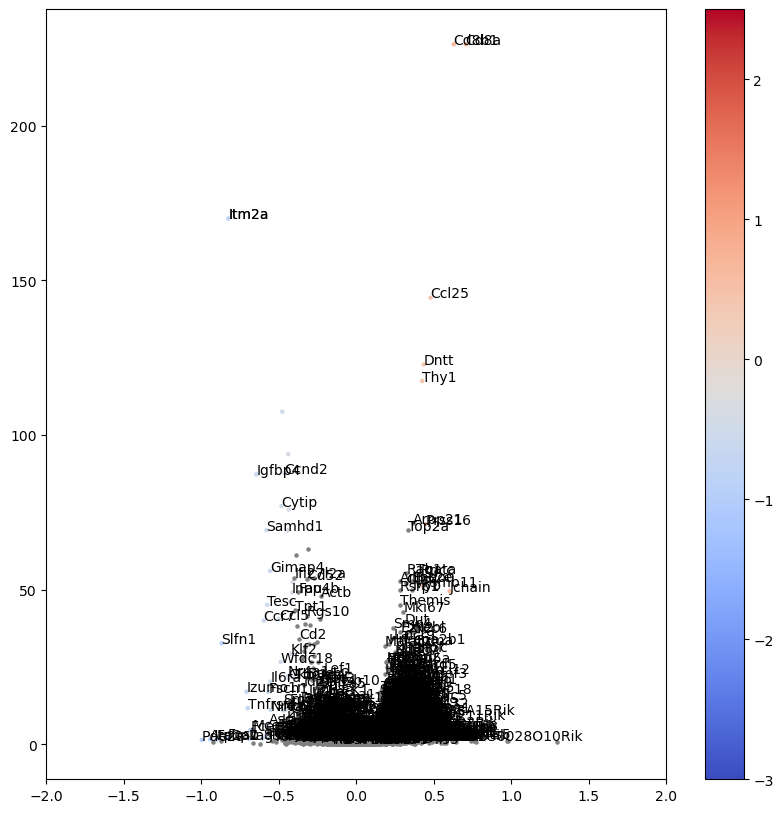

In [215]:
# Extract gene names, p-values, log-fold changes, and expression levels
names = adata_filt.uns['cd4_cd8_label_neighbor_results']['names']
gene_names = [i[1] for i in names]
pval_adj = [i[1] for i in adata_filt.uns['cd4_cd8_label_neighbor_results']['pvals_adj']]
pval = [-np.log10(i) if i != 0 else -np.log10((min([i for i in pval_adj if i != 0]))) for i in pval_adj]
lfc = [i[1] for i in adata_filt.uns['cd4_cd8_label_neighbor_results']['logfoldchanges']]

# Calculate expression level for low and high CD4/CD8 cells
adata_filt_low = adata_filt[adata_filt.obs['cd4_cd8_label_neighbor'] == 0]
adata_filt_high = adata_filt[adata_filt.obs['cd4_cd8_label_neighbor'] == 1]
frac_exp_low = [i.sum() / len(adata_filt_low) for i in scipy.sparse.csr_matrix.toarray(adata_filt_low.X)]
frac_exp_high = [i.sum() / len(adata_filt_high) for i in scipy.sparse.csr_matrix.toarray(adata_filt_high.X)]

# Further filter genes based on expression levels and other criteria
lfc_filt, pval_filt, frac_exp_low_filt, frac_exp_high_filt, gene_names_filt = [], [], [], [], []
for i, txt in enumerate(gene_names):
    lfc_filt.append(lfc[i])
    pval_filt.append(pval[i])
    frac_exp_low_filt.append(frac_exp_low[i])
    frac_exp_high_filt.append(frac_exp_high[i])
    
# Create a scatter plot with significant and insignificant points
fig, ax = plt.subplots(figsize=(10, 10))
lfc_sig, pval_sig = zip(*[(i, j) for i, j in zip(lfc_filt, pval_filt) if ((j > -np.log10(0.05)) and (np.abs(i) > 0.4))])
frac_exp_low_sig, _ = zip(*[(i, j) for i, j in zip(frac_exp_low_filt, pval_filt) if ((j > -np.log10(0.05)))])
frac_exp_high_sig, _ = zip(*[(i, j) for i, j in zip(frac_exp_high_filt, pval_filt) if ((j > -np.log10(0.05)))])
plt.scatter(lfc_sig, pval_sig, s=5, c=lfc_sig, cmap='coolwarm', vmin=-3, vmax=2.5)
plt.colorbar()
lfc_insig, pval_insig = zip(*[(i, j) for i, j in zip(lfc_filt, pval_filt) if ((j <= -np.log10(0.05)) or (np.abs(i) < 0.4))])
plt.scatter(lfc_insig, pval_insig, c='gray', s=5)

# Define a list of genes to annotate on the plot
annotated_genes = ['Runx3', 'Itm2a']
record_all_annotated_genes = {}

# Annotate genes on the plot
for i, txt in enumerate(gene_names):
    if 'Rps' in txt or 'Rpl' in txt or pval[i] < -np.log10(0.05):
        continue
    for g in annotated_genes:
        if g in txt:
            if pval_filt[i] > -np.log10(0.05):
                ax.annotate(txt, (lfc_filt[i], pval_filt[i]))
                record_all_annotated_genes[txt] = [lfc_filt[i], pval_filt[i], frac_exp_low[i], frac_exp_high[i]]
                if g == 'Rag1':
                    print('Rag1', record_all_annotated_genes[txt])
    if pval[i] < 50 or np.abs(lfc[i]) > 0.5 or pval[i] > -np.log10(0.05) or np.abs(lfc[i]) >= 2:
        ax.annotate(txt, (lfc_filt[i], pval_filt[i]))
        record_all_annotated_genes[txt] = [lfc_filt[i], pval_filt[i], frac_exp_low[i], frac_exp_high[i]]
plt.xlim([-2, 2])

# Save the plot as a PDF file
plt.savefig('volcano_de_div.pdf')

# Display annotated genes
record_all_annotated_genes

# Figure 3

## Figure 3A

 45%|████▌     | 9/20 [00:00<00:00, 86.36it/s]

0.0 192
1.0 1598
2.0 2818
3.0 6005
5.0 291
7.0 6558
10.0 6426
13.0 20798
21.0 16087
28.0 9831
35.0 30995
49.0 15744


100%|██████████| 20/20 [00:00<00:00, 52.30it/s]

63.0 20651
196.0 14855
336.0 11666
91.0 11035
476.0 20291
224.0 23616
105.0 19919
630.0 6196


<AxesSubplot: >

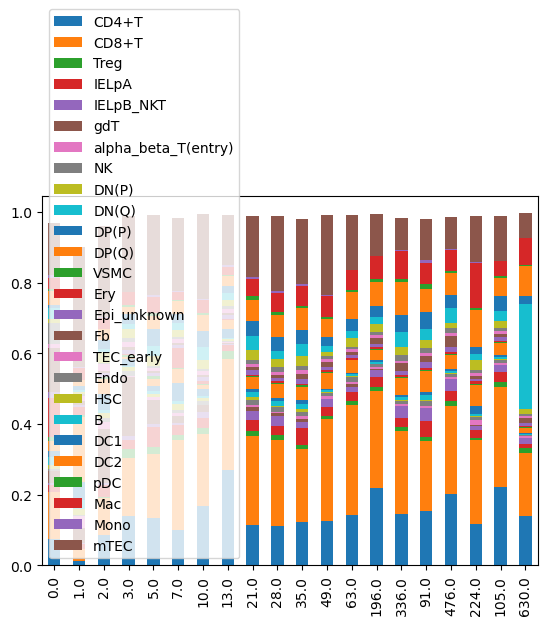

In [65]:
# Open the dataset
with open(f'{directory}Thymus_data_TCR_locs_diver.h5ad', "rb") as handle:
    adata = sc.read_h5ad(handle)

# Define the region of interest
region = 'medulla'

# Filter the dataset based on the region
adata_to_use = adata[adata.obs.cortex_medulla == region]

# Define the TEC cell type based on the region
if region == 'medulla':
    tec_cell = 'mTEC' 
elif region == 'cortex':
    tec_cell = 'cTEC'     

# Define lists of cell types
effector_lymphocytes = ['CD4+T', 'CD8+T', 'Treg', 'IELpA', 'IELpB_NKT', 'gdT', 'alpha_beta_T(entry)', 'NK']
thymocytes = ['DN(P)', 'DN(Q)', 'DP(P)', 'DP(Q)']
stroma = ['VSMC', 'Ery', 'Epi_unknown', 'Fb', 'TEC_early', 'Endo', 'HSC'] 
apcs = ['B', 'DC1', 'DC2', 'pDC', 'Mac', 'Mono']
tec = [tec_cell]

# Combine all cell types
all_ct = effector_lymphocytes + thymocytes + stroma + apcs + tec

# Get all unique ages in the dataset
all_ages = set(adata_to_use.obs.Age)

# Dictionary to store cell type fractions for each age
age_to_cter = {}

# Calculate cell type fractions for each age
for a in tqdm(all_ages):
    adata_filt = adata_to_use[adata_to_use.obs.Age == a] 
    cter = Counter(adata_filt.obs.Cell_type)
    num_beads = 0
    for i in cter:
        if i in all_ct:
            num_beads += cter[i]
    print(a, num_beads)
    cter = {i: cter[i] / sum(cter.values()) for i in cter}
    age_to_cter[a] = cter
    
# Dictionary to store plotting data
plotting_dict = {}

# Populate plotting dictionary
for a in age_to_cter:
    for ct in all_ct: 
        if ct not in plotting_dict:
            plotting_dict[ct] = []
        if ct not in age_to_cter[a]:
            plotting_dict[ct].append(0)
        else:
            plotting_dict[ct].append(age_to_cter[a][ct])

# Create a DataFrame from the plotting dictionary
df = pd.DataFrame(plotting_dict, index=age_to_cter.keys())

# Plot stacked bar chart
df.plot(kind='bar', stacked=True)


In [232]:
# Define classes corresponding to broader categories of cell types
classes = ['EL', 'Thym', 'Stroma', 'APCs', 'TEC']

# Initialize a dictionary to store cell type fractions for each age and class
age_to_cter_classes = {}

# Iterate over each age in the original dictionary
for age in age_to_cter:
    # Initialize a dictionary for the current age to store fractions for each class
    age_to_cter_classes[age] = {}
    # Initialize fractions for each class to 0
    for cla in classes:
        age_to_cter_classes[age][cla] = 0
    # Iterate over cell types in the original dictionary
    for ct in age_to_cter[age]:
        # Assign fractions to corresponding classes based on cell type
        if ct in effector_lymphocytes:
            age_to_cter_classes[age]['EL'] += age_to_cter[age][ct]
        if ct in thymocytes:
            age_to_cter_classes[age]['Thym'] += age_to_cter[age][ct]
        if ct in stroma:
            age_to_cter_classes[age]['Stroma'] += age_to_cter[age][ct]
        if ct in apcs:
            age_to_cter_classes[age]['APCs'] += age_to_cter[age][ct]
        if ct in tec:
            age_to_cter_classes[age]['TEC'] += age_to_cter[age][ct]


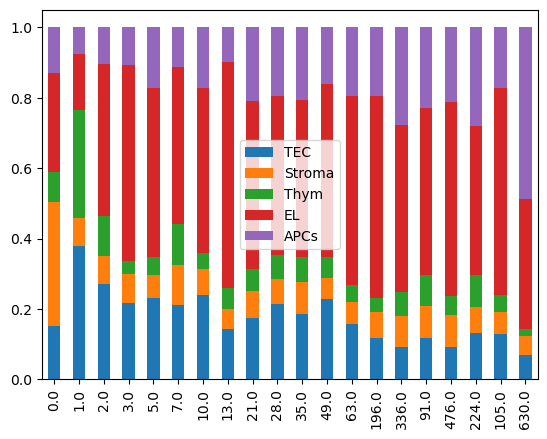

In [233]:
# Initialize a dictionary to store normalized cell type fractions for each age and class
age_to_cter_classes_norm = {}

# Normalize fractions to sum up to 1 for each age
for a in age_to_cter_classes:
    age_to_cter_classes_norm[a] = {i: age_to_cter_classes[a][i] / sum(age_to_cter_classes[a].values()) for i in age_to_cter_classes[a]}
    
# Initialize a dictionary for plotting
plotting_dict = {}

# Populate the plotting dictionary
for a in age_to_cter_classes_norm:
    for cla in classes: 
        if cla not in plotting_dict:
            plotting_dict[cla] = []
        if cla not in age_to_cter_classes_norm[a]:
            plotting_dict[cla].append(0)
        else:
            plotting_dict[cla].append(age_to_cter_classes_norm[a][cla])

# Create a DataFrame from the plotting dictionary
df = pd.DataFrame(plotting_dict, index=age_to_cter_classes_norm.keys())

# Set the column order for the DataFrame
df.columns = pd.CategoricalIndex(df.columns.values, ordered=True, categories=['TEC', 'Stroma', 'Thym', 'EL', 'APCs'])

# Sort columns by category order
df = df.sort_index(axis=1)

# Plot stacked bar chart
df.plot(kind='bar', stacked=True)

# Save the plot
plt.savefig(f'cell_type_counts_{region}.pdf')


### Fig S5A - binned

In [234]:
# Initialize the number of bins based on the region
num_bins = 6

# Create bins based on the number of bins specified
time_points = list(df.index)
deciles_dict = create_bins_dict(time_points, num_bins)

# Dictionary to map time points to deciles
time_to_decile_dict = {}

# Populate the time_to_decile_dict
for key, values in deciles_dict.items():
    print(f'{key}: {values}')  # Print the result for each bin
    for val in values:
        time_to_decile_dict[val] = key

# Handle special case for cortex region
if region == 'cortex':
    try:
        time_to_decile_dict[4.0] = 'Decile 2'  # Assign a specific decile to a time point for cortex
    except:
        print('Please run medulla first.')  # Print a message if the condition is not met

# Create a deep copy of the DataFrame
df_decile = copy.deepcopy(df)

# Add a new column 'Decile' to the DataFrame based on time_to_decile_dict
df_decile['Decile'] = [time_to_decile_dict[i] for i in df_decile.index]

# Set the index of the DataFrame to 'Decile'
df_decile = df_decile.set_index('Decile')


Decile 1: [0.0, 1.0, 2.0]
Decile 2: [3.0, 5.0, 7.0]
Decile 3: [10.0, 13.0, 21.0, 28.0]
Decile 4: [35.0, 49.0, 63.0]
Decile 5: [91.0, 105.0, 196.0]
Decile 6: [224.0, 336.0, 476.0, 630.0]


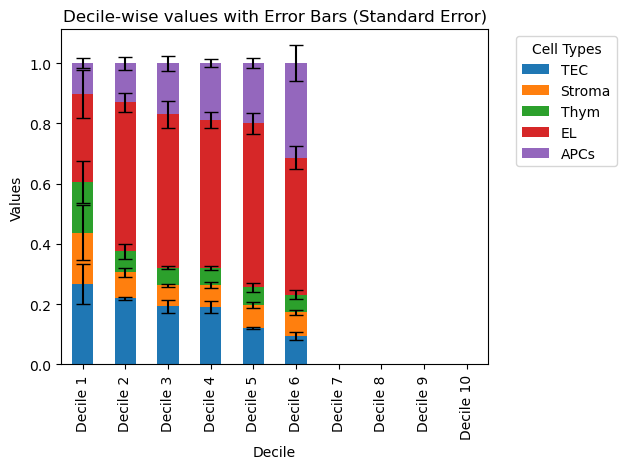

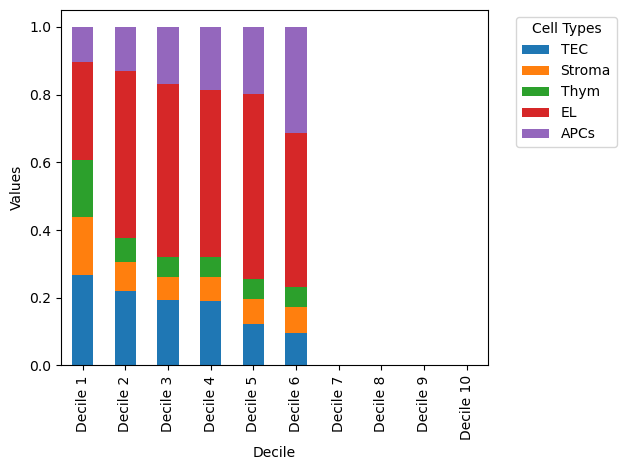

In [235]:
# Assuming df_decile is your DataFrame with relevant data

# Calculate mean and standard error for each decile
means = df_decile.groupby(df_decile.index).mean()
std_errs = df_decile.groupby(df_decile.index).sem()  # Standard error

# Change the order of the x-axis
means = means.reindex(['Decile 1', 'Decile 2', 'Decile 3', 'Decile 4', 'Decile 5', 'Decile 6', 'Decile 7', 'Decile 8', 'Decile 9', 'Decile 10'])

# Plot the bar chart with error bars using standard error
ax = means.plot(kind='bar', stacked=True, yerr=std_errs, capsize=5)
plt.xlabel('Decile')
plt.ylabel('Values')
plt.title('Decile-wise values with Error Bars (Standard Error)')
plt.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Plot the bar chart with error bars using standard error
ax = means.plot(kind='bar', stacked=True,  capsize=5)
plt.xlabel('Decile')
plt.ylabel('Values')
plt.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


## S5A

100%|██████████| 27/27 [00:00<00:00, 1612.73it/s]


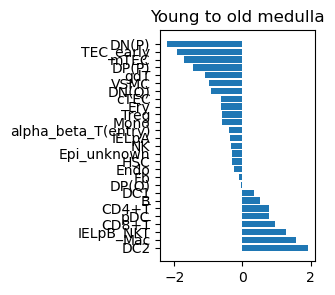

100%|██████████| 27/27 [00:00<00:00, 1548.75it/s]


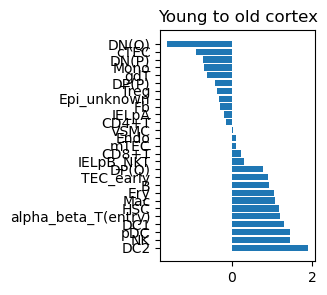

In [101]:
# Read the dataset
with open(f'{directory}Thymus_data_TCR_locs_diver.h5ad', "rb") as handle:
    adata = sc.read_h5ad(handle)

# Filter out rows with 'cortex_medulla' value as 'NA'
adata = adata[adata.obs['cortex_medulla'] != 'NA']

# Get unique ages from the dataset and set a cutoff age for defining young and old
ages = set(adata.obs['Age'])
young_cutoff = 35

# Define young and old age groups based on the cutoff age
young_ages = [i for i in ages if i <= young_cutoff]
old_ages = [i for i in ages if i > young_cutoff]

# Subset the data for medulla region and calculate proportions of each cell type in young and old age groups
adata_filt = adata[adata.obs['cortex_medulla'] == 'medulla']
young, old = young_old_props(adata_filt)
ct_m, vals_m, pvals_m = find_cohens_d_by_ct(adata_filt, young, old)

# Plot the Cohen's d effect sizes for medulla region
plt.figure(figsize=(2, 3))
plt.barh(ct_m, vals_m)
plt.title('Young to old medulla')
plt.savefig('Cohens_effect_size_medulla.pdf')
plt.show()

# Subset the data for cortex region and calculate proportions of each cell type in young and old age groups
adata_filt = adata[adata.obs['cortex_medulla'] == 'cortex']
young, old = young_old_props(adata_filt)
ct_c, vals_c, pvals_c = find_cohens_d_by_ct(adata_filt, young, old)

# Plot the Cohen's d effect sizes for cortex region
plt.figure(figsize=(2, 3))
plt.barh(ct_c, vals_c)
plt.title('Young to old cortex')
plt.savefig('Cohens_effect_size_cortex.pdf')
plt.show()


In [102]:
# Define the cell type of interest
ct = 'NK'

# Find the index of the cell type in the list of cell types for the cortex region
ct_idx = ct_c.index(ct)

# Print the cell type, Cohen's d effect size value, and p-value
print(f'Cell Type: {ct_c[ct_idx]}')
print(f'Cohen\'s d Effect Size: {vals_c[ct_idx]}')
print(f'P-value: {pvals_c[ct]}')


Cell Type: NK
Cohen's d Effect Size: 1.4545750828485382
P-value: 0.0040555288604998425


## Fig 3B, S5B, S5C

In [67]:
# Set the region type for analysis
region_type = 'cortex'  # This test only looks at interactions in this region

# Define the maximum number of worker processes for parallelization
max_pool = 8

# Initialize a list to store samples for permutation testing
all_samples = []

# Iterate over puck names to prepare samples for analysis
for s in puck_names:
    # Exclude specific puck names if not enough cells are present for the specified region
    if region_type == 'medulla':
        if s == '2022-11-23_Puck_221024_34':  # not enough cells, 2 days
            continue
        if s == '2023-01-24_Puck_221103_09':  # not enough cells, 4 days
            continue
        if s == '2023-01-24_Puck_221103_12':  # not enough cells, 4 days
            continue
    
    # Define the filename for the processed data
    fn = f'zscore_{s}_pd_{region_type}.pkl'
    
    # Add sample to the list if the processed data file doesn't exist
    if not os.path.exists(directory + fn):
        all_samples.append([s, region_type, directory])

# Print the number of samples remaining for analysis
print(len(all_samples), 'samples left')

# Execute parallelized jobs for permutation testing
with Pool(max_pool) as p:
    pool_outputs = list(tqdm(
        p.imap(perm_test_to_final_plot, all_samples),
        total=len(all_samples)
    ))

0 samples left


0it [00:00, ?it/s]


In [68]:
# Iterate over each puck name and load corresponding data
for s in tqdm(puck_names):
    # Skip specific pucks with insufficient cells for medulla region
    if region_type == 'medulla':
        if s == '2022-11-23_Puck_221024_34':  # Not enough cells, 2 days
            continue
        if s == '2023-01-24_Puck_221103_09':  # Not enough cells, 4 days
            continue
        if s == '2023-01-24_Puck_221103_12':  # Not enough cells, 4 days
            continue
    
    # Define the filename for the data file
    fn = f'zscore_{s}_pd_{region_type}.pkl'
    
    # Load the data from the file
    with open(directory + fn, 'rb') as f:
        z_score_df = pkl.load(f)


100%|██████████| 47/47 [00:00<00:00, 447.02it/s]


In [69]:
# Initialize dictionaries to store data
all_cell_type_pairs = {}
arr_all = {}

# Iterate over each puck
for i in range(len(puck_names)):
    # Get the timepoint and puck name
    tpt = puck_to_time[puck_names[i]]
    pn = puck_names[i]
    
    try:
        # Load data from the file
        with open(f'{directory}zscore_{pn}_pd_{region_type}.pkl', 'rb') as fn:
            df = pkl.load(fn)
    except FileNotFoundError:
        # Handle missing data
        print(f'{tpt} {pn} is missing')
        continue
    
    print(pn)
    
    # Store data in the dictionary
    arr_all[tpt] = df
    
    # Extract cell types and their z-scores
    ct1 = df.columns
    ct2 = df.index
    arr = np.array(df)
    
    # Iterate over each cell type pair
    for i in range(len(ct1)):
        for j in range(len(ct2)):
            c1 = ct1[i]
            c2 = ct2[j]
            
            # Append z-score for the pair to the list
            if (c1, c2) not in all_cell_type_pairs:
                all_cell_type_pairs[(c1, c2)] = []
            all_cell_type_pairs[(c1, c2)].append((tpt, arr[i][j]))


2023-01-24_Puck_221024_23
2022-11-23_Puck_221024_24
2022-11-23_Puck_221024_31
2023-01-16_Puck_221024_27
2022-11-23_Puck_221024_34
2023-01-24_Puck_221024_33
2023-01-24_Puck_221024_36
2022-11-23_Puck_221024_38
2023-01-24_Puck_221024_37
2023-01-24_Puck_221024_39
2023-01-24_Puck_221103_09
2023-01-24_Puck_221103_12
2023-01-24_Puck_221019_08
2023-01-24_Puck_221019_05
2023-01-24_Puck_221019_10
2023-01-24_Puck_221019_14
2022-12-16_Puck_221006_22_trunc
2023-01-24_Puck_221006_23
2022-12-16_Puck_221011_32_trunc
2022-12-16_Puck_221011_33_trunc
2023-01-24_Puck_221118_38
2023-01-24_Puck_221118_39
2023-01-24_Puck_221103_22
2023-01-24_Puck_221118_40
2023-01-24_Puck_220930_18
2023-01-24_Puck_220930_20
2023-01-24_Puck_220930_22
2023-01-24_Puck_220930_23
2023-01-24_Puck_220930_28
2023-01-24_Puck_221011_37
2023-01-24_Puck_221011_39
2023-01-24_Puck_221011_12
2023-01-24_Puck_221011_13
2022-11-04_Puck_221006_24
2022-12-16_Puck_221006_26_trunc
2022-11-04_Puck_221006_29
2022-12-16_Puck_221006_35_trunc
2022-11-

  8%|▊         | 61/729 [00:00<00:02, 296.75it/s]

DP(Q) and alpha_beta_T(entry)-1
DP(Q) and gdT-1
DP(Q) and NK-1
DP(Q) and mTEC-1
DP(Q) and Ery-1
DP(Q) and HSC-1
DP(Q) and DC1-1
DC2 and DC2-1
DC2 and CD8+T-1
DC2 and B-1
DC2 and alpha_beta_T(entry)-1
DC2 and CD4+T-1
DC2 and DP(P)-1
DC2 and Mac-1
DC2 and DN(P)-1
DC2 and Ery-1
DC2 and Fb-1
DC2 and DC1-1
CD8+T and DC2-1
CD8+T and CD8+T-1
CD8+T and B-1
CD8+T and DP(P)-1
CD8+T and gdT-1
CD8+T and Mac-1
CD8+T and DN(P)-1
Endo and CD4+T-1
Endo and Mac-1


 20%|██        | 147/729 [00:00<00:01, 376.98it/s]

B and DP(Q)-1
B and DC2-1
B and CD8+T-1
B and B-1
B and CD4+T-1
B and DP(P)-1
B and Mac-1
B and DN(P)-1
alpha_beta_T(entry) and DC2-1
alpha_beta_T(entry) and alpha_beta_T(entry)-1
alpha_beta_T(entry) and DP(P)-1
alpha_beta_T(entry) and pDC-1
alpha_beta_T(entry) and Mac-1
alpha_beta_T(entry) and NK-1
alpha_beta_T(entry) and mTEC-1
CD4+T and DC2-1
CD4+T and Endo-1
CD4+T and gdT-1
CD4+T and Mac-1
CD4+T and DN(P)-1
CD4+T and Fb-1
DP(P) and DC2-1
DP(P) and alpha_beta_T(entry)-1
DP(P) and pDC-1


 40%|███▉      | 290/729 [00:00<00:00, 450.34it/s]

DP(P) and gdT-1
DP(P) and Mac-1
DP(P) and DN(Q)-1
DP(P) and NK-1
DP(P) and VSMC-1
pDC and alpha_beta_T(entry)-1
pDC and DP(P)-1
pDC and mTEC-1
cTEC and gdT-1
cTEC and DN(Q)-1
cTEC and IELpA-1
cTEC and NK-1
cTEC and mTEC-1
cTEC and DN(P)-1
cTEC and Ery-1
gdT and DP(Q)-1
gdT and CD8+T-1
gdT and CD4+T-1
gdT and DP(P)-1
gdT and cTEC-1
gdT and gdT-1
gdT and Mac-1
gdT and IELpA-1
gdT and NK-1
gdT and mTEC-1


 46%|████▌     | 336/729 [00:00<00:00, 424.94it/s]

gdT and DN(P)-1
gdT and HSC-1
gdT and DC1-1
gdT and Epi_unknown-1
Mac and DP(Q)-1
Mac and DC2-1
Mac and CD8+T-1
Mac and Endo-1
Mac and B-1
Mac and alpha_beta_T(entry)-1
Mac and CD4+T-1
Mac and DP(P)-1
Mac and gdT-1
Mac and Mac-1
Mac and IELpA-1
Mac and mTEC-1
Mac and DN(P)-1
Mac and Ery-1
Mac and HSC-1
Mac and Fb-1
DN(Q) and DP(Q)-1
DN(Q) and DC2-1
DN(Q) and alpha_beta_T(entry)-1
DN(Q) and cTEC-1
DN(Q) and gdT-1


 66%|██████▌   | 480/729 [00:01<00:00, 429.00it/s]

DN(Q) and mTEC-1
DN(Q) and DN(P)-1
DN(Q) and DC1-1
IELpA and gdT-1
IELpA and Mac-1
IELpA and Ery-1
NK and DP(Q)-1
NK and alpha_beta_T(entry)-1
NK and DP(P)-1
NK and cTEC-1
NK and gdT-1
VSMC and Fb-1
mTEC and alpha_beta_T(entry)-1
mTEC and DP(P)-1
mTEC and pDC-1
mTEC and cTEC-1
mTEC and gdT-1
mTEC and Mac-1
mTEC and DN(Q)-1
mTEC and Ery-1
mTEC and Fb-1


 88%|████████▊ | 644/729 [00:01<00:00, 482.53it/s]

DN(P) and DP(Q)-1
DN(P) and DC2-1
DN(P) and CD8+T-1
DN(P) and B-1
DN(P) and gdT-1
DN(P) and Mac-1
DN(P) and DN(Q)-1
DN(P) and DC1-1
DN(P) and Epi_unknown-1
Ery and DC2-1
Ery and alpha_beta_T(entry)-1
Ery and Mac-1
Ery and IELpA-1
Ery and mTEC-1
Ery and Ery-1
HSC and gdT-1
HSC and Mac-1
Fb and CD4+T-1
Fb and Mac-1
Fb and VSMC-1
Fb and mTEC-1
DC1 and DC2-1
DC1 and gdT-1
DC1 and Mac-1
DC1 and DN(P)-1


100%|██████████| 729/729 [00:01<00:00, 437.35it/s]


Epi_unknown and gdT-1
Epi_unknown and DN(P)-1
mTEC and IELpB_NKT-1
gdT and IELpB_NKT-1
IELpB_NKT and mTEC-1
IELpB_NKT and cTEC-1
DP(Q) and IELpB_NKT-1


Text(0.5, 894.722222222225, 'timepoints, log+1')

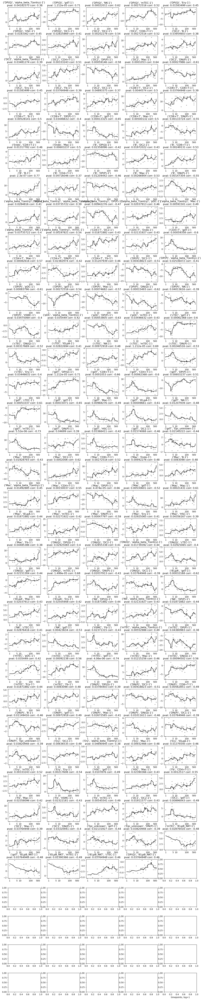

In [70]:
# Initialize an empty dictionary to store line plots for each cell type pair
line_plots = {}

# Iterate over all cell type pairs
for i in all_cell_type_pairs:
    num_pairs = len(all_cell_type_pairs[i])
    line_plots[i] = all_cell_type_pairs[i]

# Boolean indicating whether to correct p-values
corr_pval = True

# Initial color for plotting
color = 'gray'

# Initialize a list to store p-values for correction
pval_recorder_for_corr = []

# Counter for the subplots
plt_cter = 0

# Iterate over each cell type pair for plotting
for i in line_plots:
    if len(line_plots[i]) <= 1:
        continue
    # Filter out NaN values from the line plots
    line_plots_filt = [j for j in line_plots[i] if ~np.isnan(j[1])]
    y_vals = [j[1] for j in line_plots_filt]
    x_vals = [tpt_to_day[j[0]] for j in line_plots_filt]
    x_vals = [i+1 for i in x_vals]
    # Sort x and y values
    x_vals, y_vals = zip(*sorted([(i,j) for i,j in zip(x_vals,y_vals)]))
    x_vals, y_vals = zip(*sorted([(i,j) for i,j in zip(x_vals,y_vals) if np.isfinite(j)]))
    
    if len(x_vals) < 5:
        continue
    # Calculate Pearson correlation coefficient and p-value
    corr, pval = scipy.stats.pearsonr(np.log10(x_vals), y_vals)

    # Store p-value for correction
    pval_recorder_for_corr.append(pval)

# Perform multiple testing correction on p-values
corr_list = stats.multitest.multipletests(pval_recorder_for_corr, method='fdr_bh')
corr_dict = {i: j for i, j in zip(pval_recorder_for_corr, corr_list[1])}

# For plotting
dotplot_sig_interactions = []
dotplot_sig_corr = []
dotplot_sig_pval = []

# Create subplots for individual interactions

if region_type == 'cortex':
    fig, axs = plt.subplots(nrows=35, ncols=5, figsize=(16, 7*12))
elif region_type == 'medulla':
    fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(16, 12))
    
plt.subplots_adjust(hspace=0.5)

# Reset the counter for subplots
plt_cter = 0

# Iterate over each cell type pair for plotting
for i in tqdm(line_plots):
    if len(line_plots[i]) <= 1:
        continue
    line_plots_filt = [j for j in line_plots[i] if ~np.isnan(j[1])]
    y_vals = [j[1] for j in line_plots[i]]
    x_vals = [tpt_to_day[j[0]] for j in line_plots[i]]
    x_vals = [i+1 for i in x_vals]
    x_vals, y_vals = zip(*sorted([(i,j) for i,j in zip(x_vals,y_vals) if np.isfinite(j)]))
    if len(x_vals) < 5:
        continue
    # Calculate Pearson correlation coefficient and p-value
    corr, pval = scipy.stats.pearsonr(np.log10(x_vals), y_vals)
    if corr_pval:
        # Correct p-value if needed
        pval = corr_dict[pval]
    dotplot_sig_interactions.append(i)
    dotplot_sig_corr.append(corr)
    dotplot_sig_pval.append(pval)
    
    # Plot significant interactions
    if (pval < 0.05):
        y_vals_df = pd.DataFrame.from_dict({'y': y_vals})
        y_vals_line = y_vals_df['y'].rolling(window=5, min_periods=1, center=True).mean()
        alpha_val = 1
        print(f'{i[0]} and {i[1]}')
        ax_val = axs.ravel()[plt_cter]
        plt_cter += 1
        ax_val.scatter(x_vals, y_vals, c=color, alpha=alpha_val, s=5)
        ax_val.plot(x_vals, y_vals_line, c='black', alpha=alpha_val)
        
        ax_val.set_title(str(i)+' \n pval: '+str(round(pval, 8)) + ' corr: '+str(round(corr, 2)))
        ax_val.set_xscale('log', base=10)
        ax_val.set_xticks([1, 5, 10, 100, 500])
        ax_val.get_xaxis().set_major_formatter(ScalarFormatter())
        
    else:
        color = 'gray'
        alpha_val = 0.01
        continue

# Save the individual interaction plots
plt.savefig(f'Indiv_interac_{region_type}.pdf')

# Set the label for x-axis
plt.xlabel('timepoints, log+1')


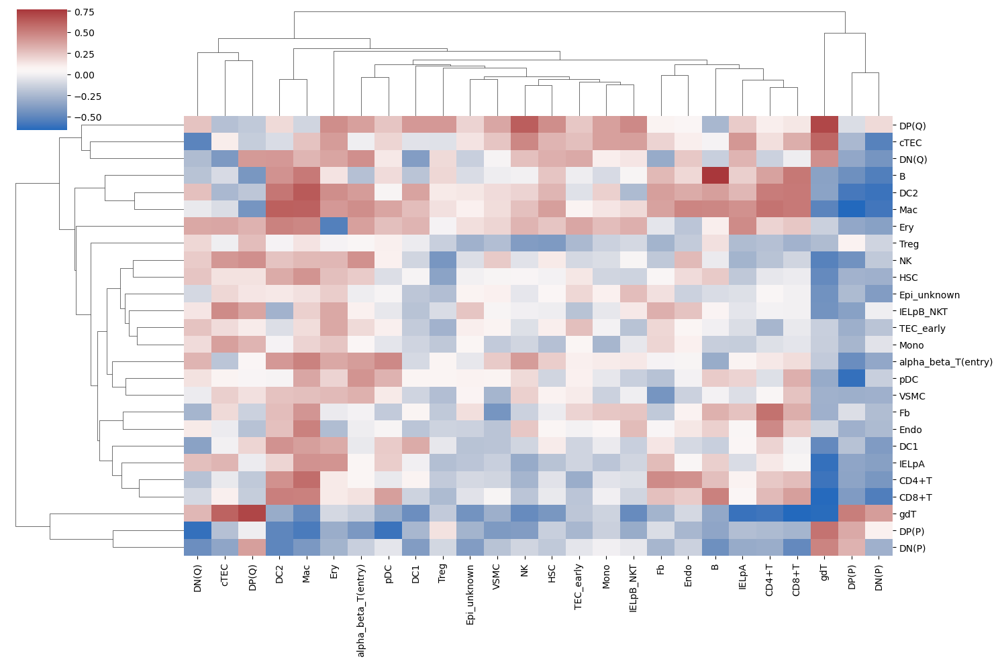

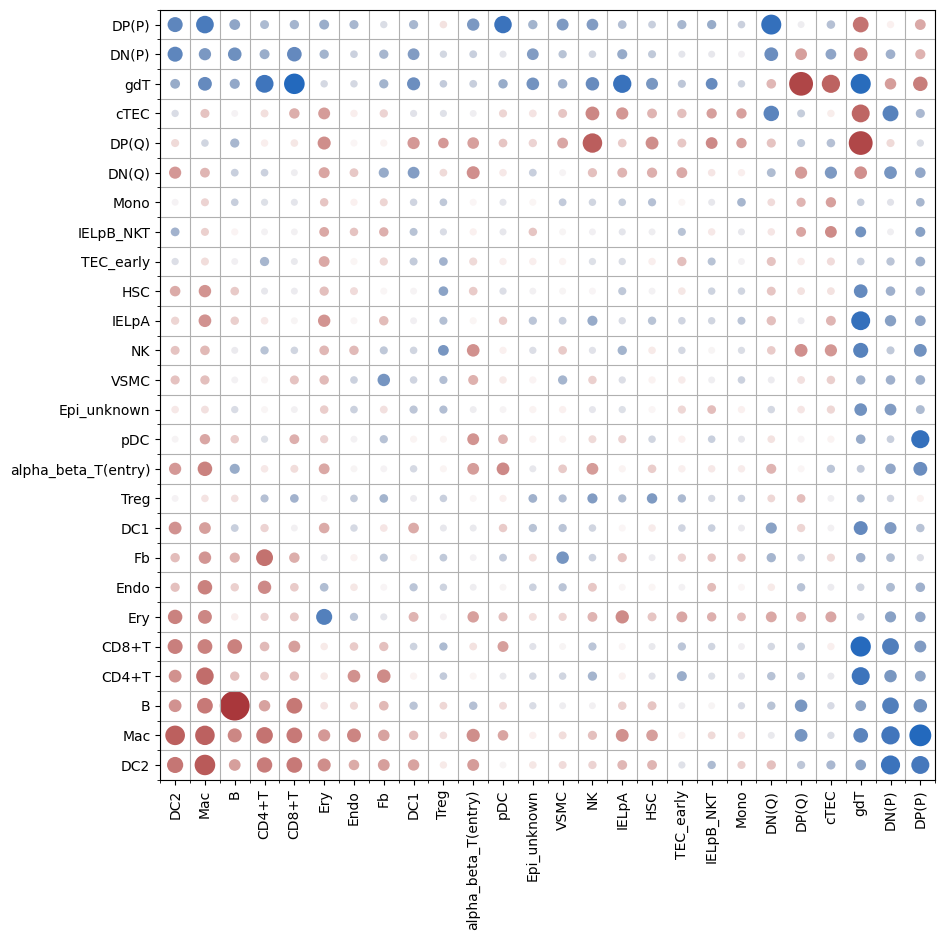

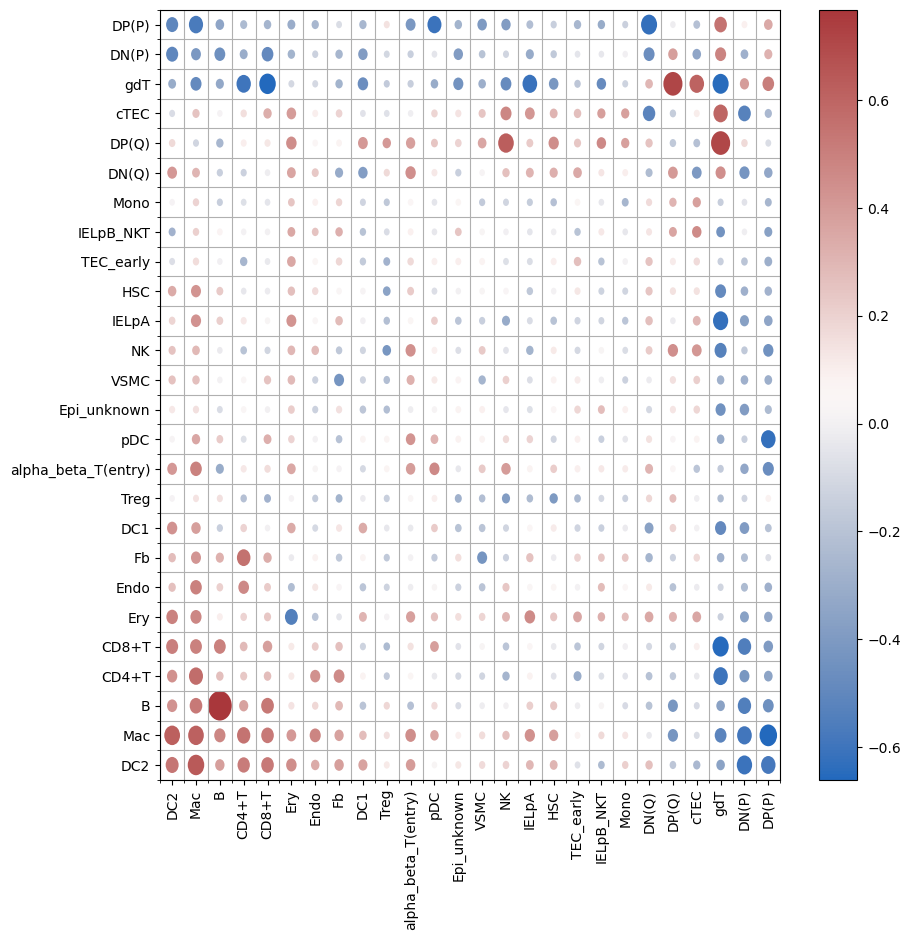

In [71]:
# Extract unique cell types from dotplot_sig_interactions
all_ct = list(set([i[0] for i in dotplot_sig_interactions] + [i[1][:-2] for i in dotplot_sig_interactions]))

# Remove specific cell types based on region type
if region_type == 'medulla':
    all_ct = [i for i in all_ct if 'cTEC' not in i]
elif region_type == 'cortex':
    all_ct = [i for i in all_ct if 'mTEC' not in i]

# Initialize matrices for heatmap
heatmap_mat = np.zeros([len(all_ct),len(all_ct)])
heatmap_pval = np.zeros([len(all_ct),len(all_ct)])

# Loop over each interaction
for idx in range(len(dotplot_sig_interactions)):
    sig_int = dotplot_sig_interactions[idx]
    corr = dotplot_sig_corr[idx]
    pval = dotplot_sig_pval[idx]

    # Skip interactions involving specific cell types based on region type
    ct1 = sig_int[0]
    ct2 = sig_int[1]
    if region_type == 'medulla':
        if 'cTEC' in ct1 or 'cTEC' in ct2:
            continue
    elif region_type == 'cortex':
        if 'mTEC' in ct1 or 'mTEC' in ct2:
            continue
    
    # Get indices of cell types in the heatmap matrices
    ct1_idx = all_ct.index(ct1)
    ct2_idx = all_ct.index(ct2[:-2])
    
    # Populate heatmap matrices
    heatmap_mat[ct1_idx][ct2_idx] = corr
    heatmap_pval[ct1_idx][ct2_idx] = pval

# Create DataFrame for heatmap data and remove rows/columns with all zeros
heatmap_df = pd.DataFrame(heatmap_mat,index=all_ct,columns=all_ct)
heatmap_df = heatmap_df.loc[~(heatmap_df==0).all(axis=1)]
heatmap_df = heatmap_df.loc[:, (heatmap_df != 0).any(axis=0)]

# Create DataFrame for p-values and remove rows/columns with all zeros
heatmap_pv = pd.DataFrame(heatmap_pval,index=all_ct,columns=all_ct)
heatmap_pv = heatmap_pv.loc[~(heatmap_pv==0).all(axis=1)]
heatmap_pv = heatmap_pv.loc[:, (heatmap_pv != 0).any(axis=0)]

# Create clustermap to reorder the data frame
cm = sns.color_palette("vlag", as_cmap=True)
fig = sns.clustermap(heatmap_df,cmap=cm,xticklabels=True,yticklabels=True,
                     figsize=(15,10),row_cluster=True,col_cluster=True)
fig.savefig('cortex_interaction_heatmap.pdf')

# Reorder data frame based on clustermap
ind = fig.dendrogram_col.reordered_ind
set_order = [heatmap_df.index[i] for i in ind]
if region_type == 'medulla':
    set_order = ['DC2', 'Mac', 'B', 'CD4+T', 'CD8+T', 'Ery', 'Endo', 'Fb', 'DC1', 'Treg', 'alpha_beta_T(entry)', 'pDC', 'Epi_unknown', 'VSMC', 'NK', 'IELpA', 'HSC', 'TEC_early', 'IELpB_NKT', 'Mono', 'DN(Q)', 'DP(Q)', 'mTEC', 'gdT', 'DN(P)', 'DP(P)']
elif region_type == 'cortex':
    set_order = ['DC2', 'Mac', 'B', 'CD4+T', 'CD8+T', 'Ery', 'Endo', 'Fb', 'DC1', 'Treg', 'alpha_beta_T(entry)', 'pDC', 'Epi_unknown', 'VSMC', 'NK', 'IELpA', 'HSC', 'TEC_early', 'IELpB_NKT', 'Mono', 'DN(Q)', 'DP(Q)', 'cTEC', 'gdT', 'DN(P)', 'DP(P)']
heatmap_df = heatmap_df[set_order]
heatmap_df = heatmap_df.reindex(index = set_order)

heatmap_pv = heatmap_pv[set_order]
heatmap_pv = heatmap_pv.reindex(index = set_order)

# Create scattered heat map
M = 26
N = 26
xlabels = heatmap_df.columns
ylabels = heatmap_df.index

x,y = np.meshgrid(np.arange(M), np.arange(N))
s = -np.log10(heatmap_pv.values) # Size
c = heatmap_df.values # Color

fig,ax = plt.subplots(figsize=(10,10))

R = (s+2)/(s.max()+2)/2
circles = [plt.Circle((j,i), radius=r) for r, j, i in zip(R.flat, x.flat, y.flat)]
col = PatchCollection(circles, array=c.flatten(), cmap="vlag")
ax.add_collection(col)

ax.set(xticks=np.arange(M), yticks=np.arange(N),
       xticklabels=xlabels, yticklabels=ylabels)
ax.set_xticks(np.arange(M+1)-0.5, minor=True)
ax.set_yticks(np.arange(N+1)-0.5, minor=True)
ax.grid(which='minor')
plt.xticks(rotation = 90)

plt.savefig(f'fig2b_cb_{region_type}.pdf')
plt.show()

# Create scattered heat map with colorbar
fig,ax = plt.subplots(figsize=(10,10))

R = (s+2)/(s.max()+2)/2
circles = [plt.Circle((j,i), radius=r) for r, j, i in zip(R.flat, x.flat, y.flat)]
col = PatchCollection(circles, array=c.flatten(), cmap="vlag")
ax.add_collection(col)

ax.set(xticks=np.arange(M), yticks=np.arange(N),
       xticklabels=xlabels, yticklabels=ylabels)
ax.set_xticks(np.arange(M+1)-0.5, minor=True)
ax.set_yticks(np.arange(N+1)-0.5, minor=True)
ax.grid(which='minor')
plt.xticks(rotation = 90)

fig.colorbar(col)

plt.savefig(f'fig2b_cb_{region_type}_cbar.pdf')
plt.show()


## Fig. 3C

In [87]:
with open(f'{directory}thymuscombined_xy.h5ad',"rb") as handle:
    adata = sc.read_h5ad(handle)
batch_to_age = {j:i for i,j in zip(adata.obs.Age,adata.obs.Batch)}

In [88]:
# Set re_run_calc and save flags
re_run_calc = False
save = False

# Re-run calculations if re_run_calc flag is True
if re_run_calc:
    # Loop over batches in the dataset
    for batch in tqdm(set(adata.obs.Batch)):
        # Skip if output files already exist
        if os.path.exists(f'./rec_lig_outs/{batch}_means.csv'):
            continue
        
        # Filter the data by batch
        adata_filt = adata[adata.obs.Batch == batch]
        
        # Set spatial coordinates
        adata_filt.obsm['spatial'] = np.array([(float(i), float(j)) for i, j in zip(adata_filt.obs['x_val'], adata_filt.obs['y_val'])])
        
        # Calculate spatial neighbors
        sq.gr.spatial_neighbors(adata_filt, coord_type='generic')
        
        # Calculate neighborhood enrichment
        sq.gr.nhood_enrichment(adata_filt, cluster_key="Cell_type")

        # Perform ligrec analysis
        res = sq.gr.ligrec(
            adata_filt,
            n_perms=1000,
            cluster_key="Cell_type",
            copy=True,
            use_raw=False,
            transmitter_params={"categories": "ligand"},
            receiver_params={"categories": "receptor"},
        )

        # Save means and p-values to CSV files
        means = res["means"]
        pvals = res["pvalues"]
        means.to_csv(f'./rec_lig_outs/{batch}_means.csv')
        pvals.to_csv(f'./rec_lig_outs/{batch}_pvals.csv')

    # Aggregate means and p-values from CSV files
    agg_output = {}
    agg_output_pval = {}
    for batch in tqdm(set(adata.obs.Batch)):
        means = pd.read_csv(f'./rec_lig_outs/{batch}_means.csv', header=[0, 1])
        pvals = pd.read_csv(f'./rec_lig_outs/{batch}_pvals.csv', header=[0, 1])

        col_names = means.columns
        for index, row in means.iterrows():
            rec_lig = (
                row[("cluster_1", "cluster_2")],
                row[("Unnamed: 1_level_0", "Unnamed: 1_level_1")],
            )
            for idx in range(len(row)):
                val = row[idx]
                col = col_names[idx]
                if (rec_lig, col) not in agg_output:
                    agg_output[(rec_lig, col)] = []
                agg_output[(rec_lig, col)].append((batch, val))

        col_names = pvals.columns
        for index, row in pvals.iterrows():
            rec_lig = (
                row[("cluster_1", "cluster_2")],
                row[("Unnamed: 1_level_0", "Unnamed: 1_level_1")],
            )
            for idx in range(len(row)):
                val = row[idx]
                if type(val) == str:
                    continue
                if np.max(val) > 1:
                    print(val, batch)
                    break
                col = col_names[idx]
                if (rec_lig, col) not in agg_output_pval:
                    agg_output_pval[(rec_lig, col)] = []
                agg_output_pval[(rec_lig, col)].append((batch, val))

    # Save aggregated data if save flag is True
    if save:
        with open(f'{directory}means_ligrec.pkl', 'wb') as output_file:
            pkl.dump(agg_output, output_file)

        with open(f'{directory}pval_ligrec.pkl', 'wb') as output_file:
            pkl.dump(agg_output_pval, output_file)

# Load pre-calculated data if re_run_calc is False
else:
    agg_output_pval = pkl_load(f'{directory}pval_ligrec')
    agg_output = pkl_load(f'{directory}means_ligrec')


In [89]:
# Set run_sig_int flag
run_sig_int = False

# Run significance analysis if flag is True
if run_sig_int:
    sig_int = []
    values = []
    show_plots = True
    corr_agg = []
    skip_cter = 0
    pval_all = []
    metric = agg_output
    
    # Iterate over receptor-ligand interactions
    for interac in tqdm(metric):
        # Skip if interaction type is not appropriate
        if type(interac[0]) == int or interac[0] == ('source', 'target') or interac[1] == ('cluster_1', 'cluster_2') or interac[1] == ('Unnamed: 1_level_0', 'Unnamed: 1_level_1'):
            continue
        
        # Extract x and y values for the interaction
        x = range(len(metric[interac]))
        y = metric[interac]
        x_filt, y_filt = zip(*y)
        x_filt = [batch_to_age[i] for i in x_filt]
        x_filt = [np.log10(i + 1) for i in x_filt]
        
        # Calculate Spearman correlation and p-value
        corr, pval = scipy.stats.spearmanr(x_filt, y_filt)
        corr_agg.append(corr)
        pval_all.append(pval)
        
        # Add significant interactions to list
        if pval < 0.05 / len(agg_output_pval):
            if show_plots:
                if corr < 0:
                    plt.figure()
                    plt.scatter(x_filt, y_filt)
                    plt.title(interac)
                    plt.show()
            sig_int.append(interac)
            values.append(y_filt)

# Load pre-calculated significant interactions if flag is False
else:
    sig_int = pkl_load(f'{directory}sig_int')
    values = pkl_load(f'{directory}sig_int_values')


In [90]:
overwrite = False

# Save data if overwrite flag is True
if overwrite == True:
    output_file = open('sig_int_means.pkl', 'wb')
    pkl.dump(sig_int, output_file)

    output_file = open('sig_int_means_values.pkl', 'wb')
    pkl.dump(values, output_file)

    output_file = open('sig_int.pkl', 'wb')
    pkl.dump(sig_int, output_file)

    output_file = open('sig_int_values.pkl', 'wb')
    pkl.dump(values, output_file)

# Load pre-calculated data if overwrite flag is False
else:
    # Load pre-calculated data for decreasing and increasing interactions
    sig_int_decreasing = pkl_load(f'{directory}sig_int_dec_means')
    values_decreasing = pkl_load(f'{directory}sig_int_dec_values_means')

    sig_int_increasing = pkl_load(f'{directory}sig_int_inc_means')
    values_increasing = pkl_load(f'{directory}sig_int_inc_values_means')

    # Load pre-calculated data for all interactions
    sig_int = pkl_load(f'{directory}sig_int_means')
    values = pkl_load(f'{directory}sig_int_values_means')

plot_type = 'increasing'  # 'decreasing' or 'increasing' or 'both'

# Select interactions and values based on plot type
if plot_type == 'decreasing':
    value_use = copy.deepcopy(values_decreasing)
    index_use = copy.deepcopy(sig_int_decreasing)
elif plot_type == 'increasing':
    value_use = copy.deepcopy(values_increasing)
    index_use = copy.deepcopy(sig_int_increasing)
elif plot_type == 'both':
    value_use = copy.deepcopy(values)
    index_use = copy.deepcopy(sig_int)

# Filter out interactions and values with incorrect lengths
value_use, index_use = zip(*[(i, j) for i, j in zip(value_use, index_use) if len(i) == 47])


/PHShome/sx931/.conda/envs/aging-thymus/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


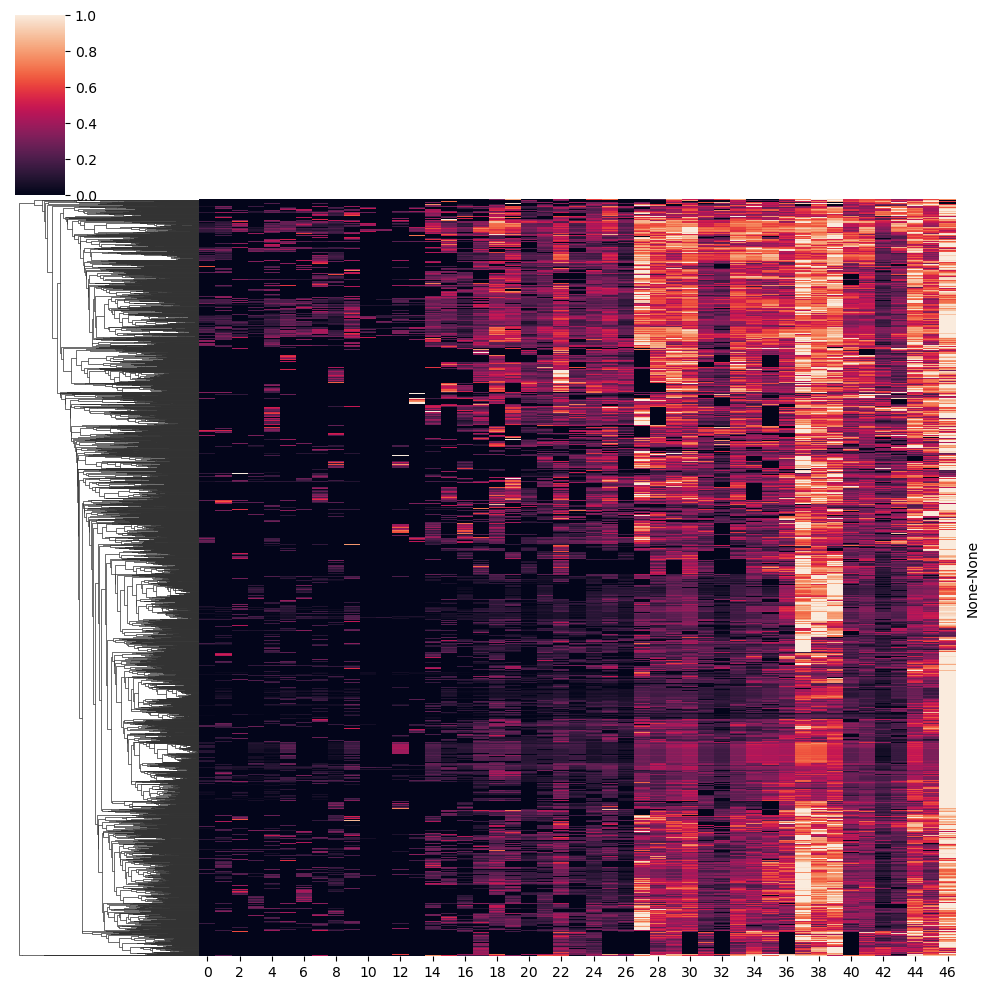

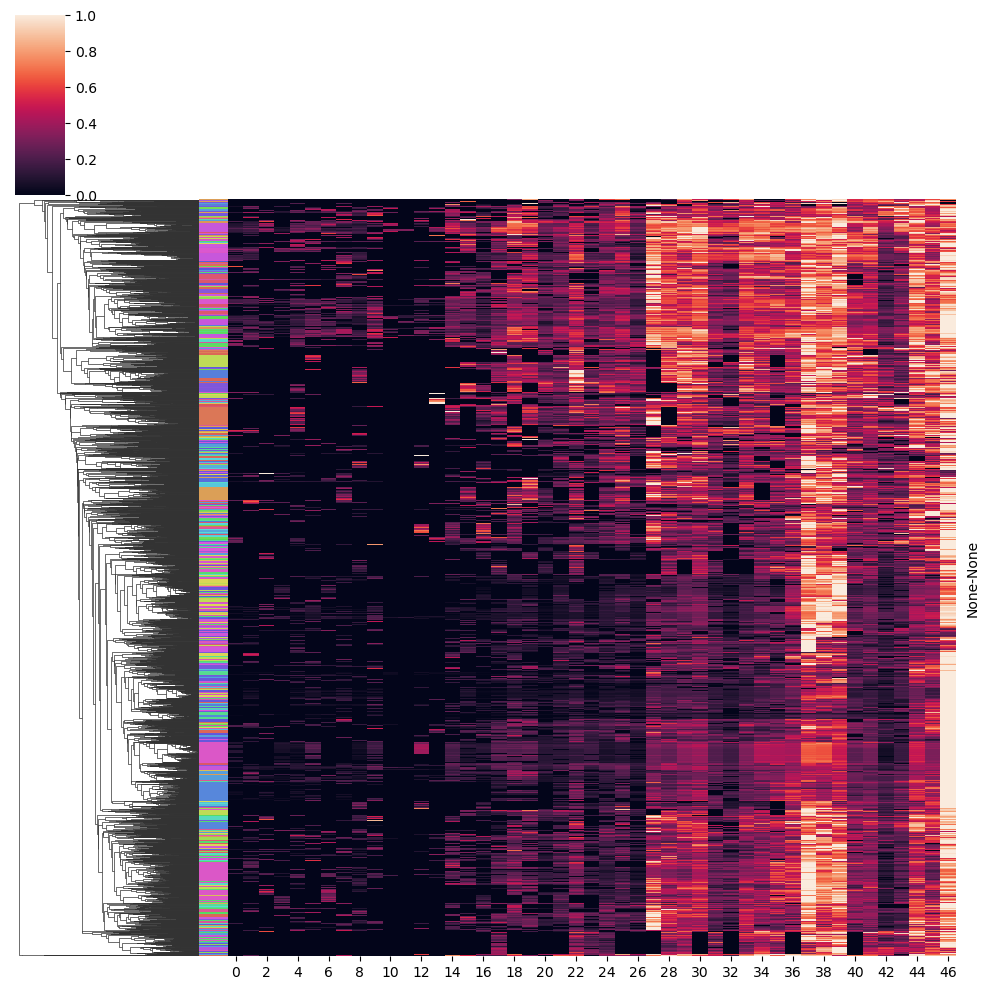

In [92]:

# Create a DataFrame for plotting with interactions as rows and timepoints as columns
plot_pd = pd.DataFrame(np.array(value_use), index=index_use)

# Create a clustermap to visualize the data
grid = sns.clustermap(plot_pd, col_cluster=False, yticklabels=False, standard_scale=0)

# Reorder the rows based on the clustering
reordered_indices = grid.dendrogram_row.reordered_ind
sig_int_reorder = [index_use[i] for i in reordered_indices]

# Extract row labels and assign colors based on interactions
row_labels = [i[0][0] for i in sig_int_reorder]
colors = sns.color_palette("hls", len(set(row_labels)))
row_labels_to_color = {i: j for i, j in zip(set(row_labels), colors)}
row_colors = [row_labels_to_color[i] for i in row_labels]

# Perform clustering again using the original order and colors
orig_order_labels = [i[0][0] for i in plot_pd.index]
orig_order_colors = [row_labels_to_color[i] for i in orig_order_labels]

# Create a clustermap with row colors and save the plot
grid = sns.clustermap(plot_pd, col_cluster=False, yticklabels=False,
                      row_colors=orig_order_colors, standard_scale=0)
grid.savefig('reclig.pdf')

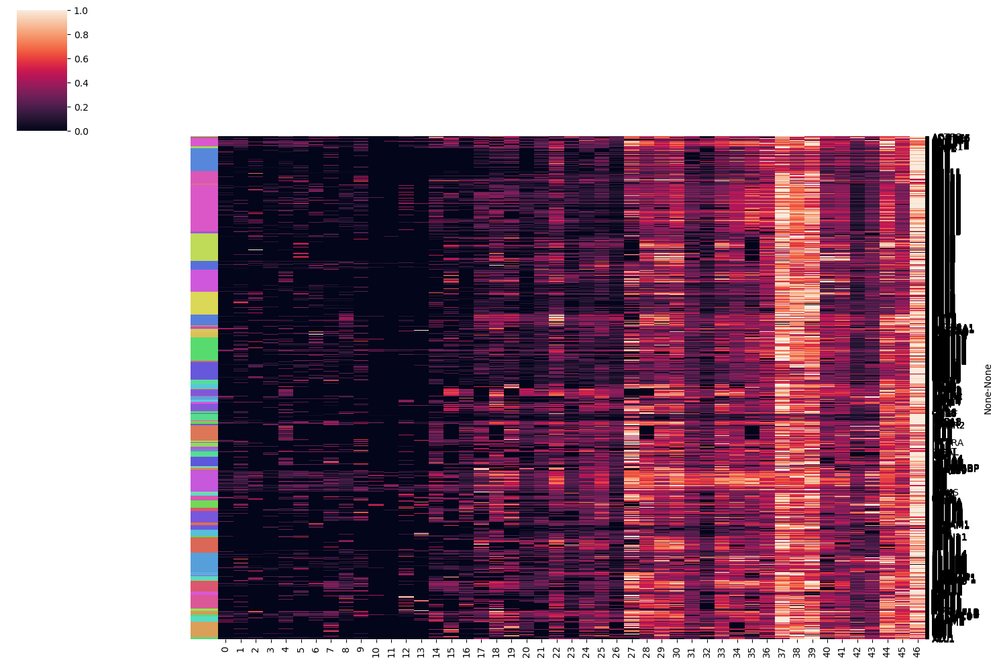

In [93]:
# Extract ligand names from the row indices of the DataFrame
ligands = [i[0][0] for i in plot_pd.index]

# Add ligand names as a new column to the DataFrame and sort the DataFrame by ligand names
plot_pd['lig'] = ligands
plot_pd = plot_pd.sort_values('lig')

# Get the sorted ligand names
ligands_sorted = plot_pd['lig']

# Get row colors based on the sorted ligand names
orig_order_colors = [row_labels_to_color[i] for i in ligands_sorted]

# Remove the ligand column from the DataFrame
plot_pd = plot_pd.drop(columns=['lig'])

# Create a clustermap with ligand names as y-axis labels and row colors based on ligand names
grid = sns.clustermap(plot_pd, yticklabels=ligands_sorted, row_cluster=False,
                      col_cluster=False, row_colors=orig_order_colors,
                      figsize=(15,10), standard_scale=0)

# Save the plot based on the type of interaction (decreasing or increasing)
if plot_type == 'decreasing':
    grid.savefig('reclig_dec.pdf')
if plot_type == 'increasing':
    grid.savefig('reclig_inc.pdf')

### Fig S6 - binned

In [143]:
df = pd.DataFrame.transpose(plot_pd)

# Example usage
num_bins = 6

time_points = list(df.index)
time_points = [batch_to_tpt[i] for i in time_points]
df.index = time_points
deciles_dict = create_bins_dict(time_points,num_bins)
deciles_dict['Decile 5'] = [91, 91, 105, 105, 196, 196]
deciles_dict['Decile 6'] = [224, 224, 224, 336, 336, 476, 476, 476, 630, 630]
time_to_decile_dict = {}

# Print the result
for key, values in deciles_dict.items():
    print(f'{key}: {values}')
    for val in values:
        time_to_decile_dict[val] = key
        


df_decile = copy.deepcopy(df)
df_decile['Decile'] = [time_to_decile_dict[i] for i in df_decile.index]

df_decile = df_decile.set_index('Decile')

Decile 1: [0, 0, 1, 1, 2, 2, 2]
Decile 2: [3, 3, 3, 4, 4, 5, 5, 7, 7]
Decile 3: [10, 10, 13, 13, 21, 21, 28, 28]
Decile 4: [35, 35, 35, 49, 49, 63, 63]
Decile 5: [91, 91, 105, 105, 196, 196]
Decile 6: [224, 224, 224, 336, 336, 476, 476, 476, 630, 630]


In [144]:
df_decile = pd.DataFrame.transpose(df_decile)

In [145]:
averages = df_decile.groupby(level=0, axis = 1).mean()

In [146]:
df_decile = averages

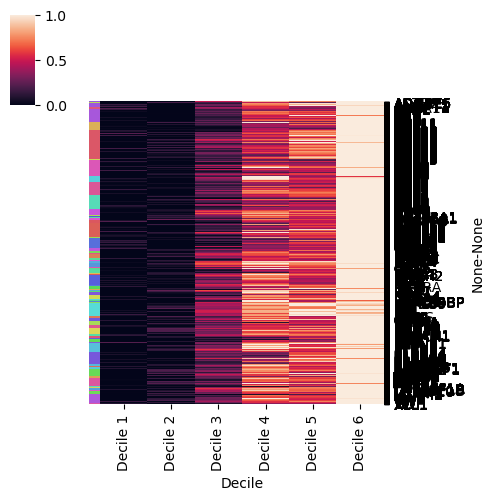

In [147]:
ligands = [i[0][0] for i in df_decile.index]
df_decile['lig'] = ligands
df_decile = df_decile.sort_values('lig')
ligands_sorted = df_decile['lig']

orig_order_colors = [row_labels_to_color[i] for i in ligands_sorted]

df_decile = df_decile.drop(columns=['lig'])
grid = sns.clustermap(df_decile,yticklabels=ligands_sorted,
                      row_cluster=False,
              col_cluster=False,row_colors = orig_order_colors,
              figsize=(5,5),standard_scale = 0) #z_score=0,

if plot_type == 'decreasing':
    grid.savefig('reclig_dec_grouped.pdf')
if plot_type == 'increasing':
    grid.savefig('reclig_inc_grouped.pdf')

## Fig 3D

100%|██████████| 6/6 [01:22<00:00, 13.81s/it]


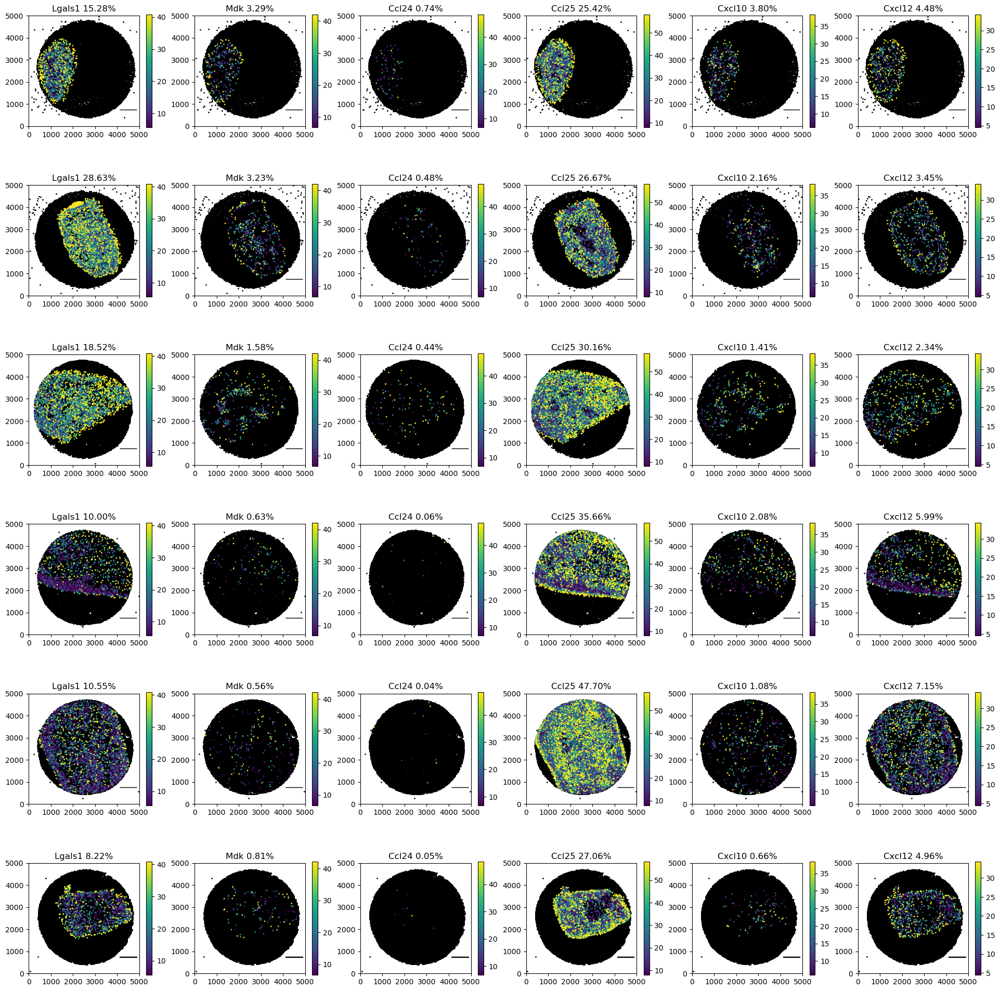

In [94]:
# Initialize a dictionary to store loaded pucks
loaded_pucks = {}

# List of pucks to plot along with their corresponding timepoints
pucks_to_plot = [
    '2022-11-23_Puck_221024_24',  # 0 days
    '2022-11-23_Puck_221024_38',  # 3 days
    '2023-01-24_Puck_221006_23',  # 10 days
    '2023-01-24_Puck_220930_23',  # 7 weeks
    '2022-12-16_Puck_220930_29_trunc',  # 32 weeks
    "2022-12-16_Puck_220930_37_trunc"  # 90 weeks
]

# List of genes to plot expression for
genes_to_plot = ['Lgals1', 'Mdk', 'Ccl24', 'Ccl25', 'Cxcl10', 'Cxcl12']

# Call the function to plot gene expression on the specified pucks
plot_gene_expression_on_pucks(pucks_to_plot, genes_to_plot)


# Figure 4

## Figure 4A

8947it [00:00, 24179.66it/s]
/tmp/ipykernel_235807/3274225127.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_filt.obs['Mac'] = mac_assn
/PHShome/sx931/.conda/envs/aging-thymus/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)
1255473it [00:49, 25428.21it/s]
/tmp/ipykernel_235807/3274225127.py:66: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0, 700])


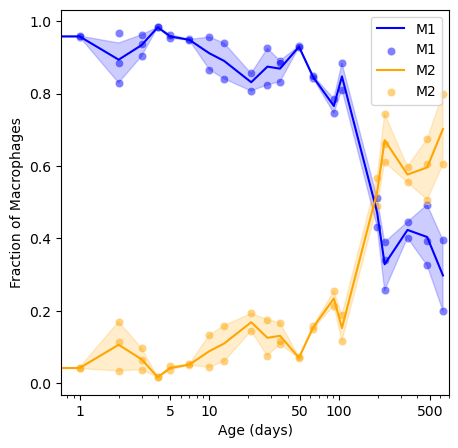

In [95]:
# Load the Thymus data from the specified file
with open(f'{directory}Thymus_data_TCR_locs_diver.h5ad', "rb") as handle:
    adata = sc.read_h5ad(handle)

# Open metadata for macrophages
mac_df = pd.read_csv(f'{directory}mac_metadata.csv')
# Filter out macrophages with specific types
mac_df = mac_df[mac_df.mac_first_type.isin(['M1', 'M2'])]

# Filter the main data based on the filtered macrophage metadata
adata_filt = adata[adata.obs.index.isin(mac_df['Unnamed: 0'])]

# Create a dictionary mapping barcode to macrophage type
bc_to_mac_status = {i: j for i, j in zip(mac_df['Unnamed: 0'], mac_df['mac_first_type'])}
mac_assn = []
# Assign macrophage type to each barcode in the filtered data
for index, row in tqdm(adata_filt.obs.iterrows()):
    mac_assn.append(bc_to_mac_status[index])
adata_filt.obs['Mac'] = mac_assn

# Assign macrophage type to each barcode in the original data
mac_assn_adata = []
for index, row in tqdm(adata.obs.iterrows()):
    if index in bc_to_mac_status:
        mac_assn_adata.append(bc_to_mac_status[index])
    else:
        mac_assn_adata.append(['NA'])
adata.obs['Mac'] = mac_assn_adata

# Separate metadata for M1 and M2 macrophages
m1_df = mac_df[mac_df['mac_first_type'] == 'M1']
m2_df = mac_df[mac_df['mac_first_type'] == 'M2']

# Get unique batches from the filtered data
all_b = set(adata_filt.obs['Batch'])

# Lists to store data for plotting
plotting_df = {'timepoint': [], 'm1_frac': [], 'm2_frac': []}

# Loop over each batch to calculate M1 and M2 fractions
for b in all_b:
    m1_adata = adata_filt[adata_filt.obs['Mac'] == 'M1']
    m2_adata = adata_filt[adata_filt.obs['Mac'] == 'M2']

    m1_val = len(m1_adata[m1_adata.obs['Batch'] == b])
    m2_val = len(m2_adata[m2_adata.obs['Batch'] == b])

    plotting_df['timepoint'].append(batch_to_tpt[b - 1])
    plotting_df['m1_frac'].append((m1_val / (m1_val + m2_val)))
    plotting_df['m2_frac'].append((m2_val / (m1_val + m2_val)))

# Convert plotting data to a DataFrame
plotting_df = pd.DataFrame.from_dict(plotting_df)

# Plot M1 and M2 fractions over time
fig, ax = plt.subplots(figsize=(5, 5))
sns.lineplot(data=plotting_df, x='timepoint', y='m1_frac', color='blue', label='M1')
sns.scatterplot(data=plotting_df, x='timepoint', y='m1_frac', color='blue', label='M1', alpha=0.5)
sns.lineplot(data=plotting_df, x='timepoint', y='m2_frac', color='orange', label='M2')
sns.scatterplot(data=plotting_df, x='timepoint', y='m2_frac', color='orange', label='M2', alpha=0.5)
ax.set_xscale('log')
ax.set_xticks([1, 5, 10, 50, 100, 500], labels=[1, 5, 10, 50, 100, 500])
plt.xlabel('Age (days)')
plt.ylabel('Fraction of Macrophages')
plt.legend()
plt.xlim([0, 700])
plt.savefig('M1M2plot.pdf')


## Figure 4B

In [97]:
# Initialize a list to store M1/M2 labels for neighboring cells
m1_m2_label_neighbor = []

# Initialize dictionaries for mapping cell types to labels
cell_type_to_young_old = {}
cell_type_to_ordered = {}

# Loop through each batch (time point)
for batch in tqdm(range(int(max(adata.obs['Batch'])))):
    batch = batch + 1
    adata_batch = adata[adata.obs['Batch'] == batch]

    # Extract M1 and M2 macrophages
    adata_batch_m1 = adata_batch[adata_batch.obs['Mac'] == 'M1']
    adata_batch_m2 = adata_batch[adata_batch.obs['Mac'] == 'M2']

    # Extract cell locations and barcodes
    all_locs = [(x, y) for x, y in zip(adata_batch.obs['x_val'], adata_batch.obs['y_val'])]
    all_bcs = [i.split('_')[2] for i in adata_batch.obs.index]
    loc_to_bc = {i: j for i, j in zip(all_locs, all_bcs)}
    bc_to_loc = {i: j for i, j in zip(all_bcs, all_locs)}
    
    # Extract locations of M1 and M2 macrophages
    m1_locs = [(x, y) for x, y in zip(adata_batch_m1.obs['x_val'], adata_batch_m1.obs['y_val'])]
    m2_locs = [(x, y) for x, y in zip(adata_batch_m2.obs['x_val'], adata_batch_m2.obs['y_val'])]

    # Map each cell location to its cell type
    cell_loc_to_cell_type = {i: j for i, j in zip(all_locs, adata_batch.obs['Cell_type'])}

    # Define distance threshold for identifying neighboring cells (microns to pixels)
    distance = 20 / 0.65 

    # Build a KDTree for efficient spatial querying
    point_tree = cKDTree(all_locs)

    # Initialize a dictionary to store annotations for nearby cells
    exvar_out = {}

    # Loop through M1 cell locations and mark nearby cells
    for loc in tqdm(m1_locs):
        nearby_pts = point_tree.data[point_tree.query_ball_point(loc, distance)]
        for l in nearby_pts:
            loc = tuple(l)
            bc = loc_to_bc[loc]
            exvar_out[bc] = 0

    # Loop through M2 cell locations and mark nearby cells
    for loc in tqdm(m2_locs):
        nearby_pts = point_tree.data[point_tree.query_ball_point(loc, distance)]
        for l in nearby_pts:
            loc = tuple(l)
            bc = loc_to_bc[loc]
            # Check if the cell is also close to an M1 cell
            if bc in exvar_out:
                exvar_out[bc] = 'NA'  # Remove annotation if it's also close to M1
            else:
                exvar_out[bc] = 1  # Otherwise, mark as M2

    # Extract barcodes and corresponding values from the annotation dictionary
    barcodes = list(exvar_out.keys())
    values = list(exvar_out.values())

    # Map barcodes to their respective values
    bc_to_new_value = {i: j for i, j in zip(barcodes, values)}

    # Update the label list based on the annotations
    for index, row in tqdm(adata_batch.obs.iterrows()):
        this_bc = index.split('_')[2]
        if this_bc in bc_to_new_value:
            m1_m2_label_neighbor.append(bc_to_new_value[this_bc])
        else:
            m1_m2_label_neighbor.append('NA')

# Assign the M1/M2 label to the observation metadata
adata.obs['m1_m2_label_neighbor'] = m1_m2_label_neighbor
adata.obs['m1_m2_label_neighbor'] = adata.obs['m1_m2_label_neighbor'].astype('category')

# Filter genes based on minimum cell count
sc.pp.filter_genes(adata, min_cells=100)

# Normalize the data
sc.pp.normalize_total(adata, target_sum=1e4)


100%|██████████| 105/105 [00:00<00:00, 2733.23it/s]

100%|██████████| 11/11 [00:00<00:00, 4374.04it/s]

0it [00:00, ?it/s]
1it [00:00,  3.67it/s]
3166it [00:00, 10890.04it/s]
6376it [00:00, 17878.06it/s]
9629it [00:00, 22565.06it/s]
13481it [00:00, 19465.15it/s]
100%|██████████| 126/126 [00:00<00:00, 21785.90it/s]

100%|██████████| 13/13 [00:00<00:00, 8274.04it/s]

0it [00:00, ?it/s]
2842it [00:00, 28416.44it/s]
5684it [00:00, 25693.66it/s]
8271it [00:00, 23162.84it/s]
11235it [00:00, 25471.50it/s]
14639it [00:00, 28362.10it/s]
19929it [00:00, 28349.03it/s]
100%|██████████| 177/177 [00:00<00:00, 27869.65it/s]

100%|██████████| 8/8 [00:00<00:00, 14646.19it/s]

0it [00:00, ?it/s]
2430it [00:00, 24294.93it/s]
5795it [00:00, 29793.65it/s]
11257it [00:00, 31026.92it/s][A
100%|██████████| 211/211 [00:00<00:00, 28703.88it/s]

100%|██████████| 9/9 [00:00<00:00, 15794.45it/s]

0it [00:00, ?it/s]
3009it [00:00, 30082.57it/s]
6327it [00:00, 31903.30it/s]
9566it [00:00, 32124.17it/s]
15665it [00:0

Counter({'cortex': 5269, 'medulla': 1364, 'NA': 348})
Counter({'cortex': 1021, 'medulla': 547, 'NA': 75})
Odds Ratio: 2.0695475656377367
P-value: 2.331340604916605e-31


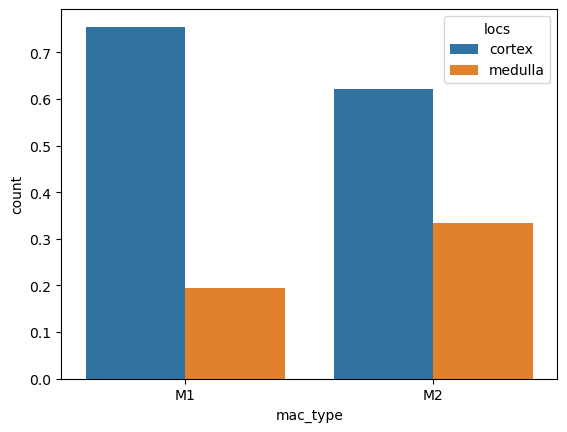

In [99]:
# Filter the data based on M1/M2 label
adata_filt = adata[adata.obs['m1_m2_label_neighbor'].isin([0, 1])]

# Count the occurrences of each cell type for M1 cells
cter_m1 = Counter(adata_filt[adata_filt.obs['m1_m2_label_neighbor'] == 0].obs['Cell_type'])

# Count the occurrences of each cell type for M2 cells
cter_m2 = Counter(adata_filt[adata_filt.obs['m1_m2_label_neighbor'] == 1].obs['Cell_type'])

# Count the occurrences of each cortex-medulla annotation for M1 macrophages
cter_m1 = Counter(adata_filt[adata_filt.obs['Mac'] == 'M1'].obs['cortex_medulla'])
print(cter_m1)

# Count the occurrences of each cortex-medulla annotation for M2 macrophages
cter_m2 = Counter(adata_filt[adata_filt.obs['Mac'] == 'M2'].obs['cortex_medulla'])
print(cter_m2)

# Initialize lists to store cell type, count, and location
m_ct = []
count = []
locs = []

# Extract cell type, count, and location for M1 macrophages
for loc in cter_m1:
    if loc == 'NA':
        continue
    m_ct.append('M1')
    count.append(cter_m1[loc] / sum(cter_m1.values()))  # Calculate fraction of M1 cells
    locs.append(loc)

# Extract cell type, count, and location for M2 macrophages
for loc in cter_m2:
    if loc == 'NA':
        continue
    m_ct.append('M2')
    count.append(cter_m2[loc] / sum(cter_m2.values()))  # Calculate fraction of M2 cells
    locs.append(loc)

# Create a DataFrame for plotting
plotting_df = pd.DataFrame.from_dict({'mac_type': m_ct,
                                      'count': count,
                                      'locs': locs})

# Plot a barplot to visualize the fractions of M1 and M2 cells in each cortex-medulla annotation
sns.barplot(data=plotting_df, x='mac_type', y='count', hue='locs')
plt.savefig('m1_m2_c_m.pdf')


# Define the 2x2 contingency table
# [[5269, 1364],
#  [1021,  547]]
# where:
# - Group 1 (e.g., M1 macrophages): 5269 observations in category A, 1364 observations in category B
# - Group 2 (e.g., M2 macrophages): 1021 observations in category A, 547 observations in category B

odds_ratio, p_value = scipy.stats.fisher_exact([[5269, 1364], [1021, 547]])

# Print the results
print("Odds Ratio:", odds_ratio)
print("P-value:", p_value)

## Figure 4C

In [100]:
# For each time point
all_cell_types = list(set(adata.obs['Cell_type']))  # Get unique cell types in the dataset
cell_type_to_young_old = {}  # Dictionary to store spatial distribution of cell types for 'Young' and 'Old' time points
cell_type_to_ordered = {}  # Dictionary to store spatial distribution of cell types irrespective of time points

# Loop over each batch (time point) in the dataset
for batch in tqdm(range(int(max(adata.obs['Batch'])))):
    batch = float(batch + 1)  # Convert batch number to float
    if batch <= 35:
        timepoint_type = 'Young'  # Determine time point type based on batch number
    else:
        timepoint_type = 'Old'

    # Get data corresponding to the current batch
    adata_batch = adata.obs[adata.obs['Batch'] == batch]

    # Find locations of all macrophages in the current batch
    m_batch = mac_df[mac_df['Batch'] == batch]
    m_loc = [(x, y) for x, y in zip(m_batch['x_val'], m_batch['y_val'])]

    all_locs = [(x, y) for x, y in zip(adata_batch['x_val'], adata_batch['y_val'])]
    cell_loc_to_cell_type = {i: j for i, j in zip(all_locs, adata_batch['Cell_type'])}
    nearby_cell_locs = []
    distance = 20 / 0.65  # Microns to pixel conversion

    point_tree = spatial.cKDTree(all_locs)  # Construct k-d tree for efficient spatial queries

    cell_types = []

    # Find nearby cell locations for each macrophage
    for loc in tqdm(m_loc):
        nearby_pts = point_tree.data[point_tree.query_ball_point(loc, distance)]
        cell_types = cell_types + [cell_loc_to_cell_type[tuple(i)] for i in nearby_pts]

    cter = Counter(cell_types)  # Count occurrences of each cell type
    cter = {i: cter[i] / sum(list(cter.values())) for i in cter}  # Normalize counts by total number of cells

    # Update dictionaries with cell type frequencies
    for cell_type in all_cell_types:
        if cell_type not in cell_type_to_young_old:
            cell_type_to_young_old[cell_type] = [[], []]
        if timepoint_type == 'Young':
            cell_type_to_young_old[cell_type][0].append(cter.get(cell_type, 0))
        elif timepoint_type == 'Old':
            cell_type_to_young_old[cell_type][1].append(cter.get(cell_type, 0))

    # Update dictionary for spatial distribution irrespective of time points
    for cell_type in all_cell_types:
        if cell_type not in cell_type_to_ordered:
            cell_type_to_ordered[cell_type] = []
        cell_type_to_ordered[cell_type].append(cter.get(cell_type, 0))


100%|██████████| 116/116 [00:00<00:00, 24897.11it/s]

100%|██████████| 139/139 [00:00<00:00, 25316.26it/s]

100%|██████████| 220/220 [00:00<00:00, 30855.94it/s]

100%|██████████| 94/94 [00:00<00:00, 19731.97it/s]

100%|██████████| 177/177 [00:00<00:00, 31121.01it/s]

100%|██████████| 312/312 [00:00<00:00, 28422.37it/s]

100%|██████████| 318/318 [00:00<00:00, 31989.18it/s]

100%|██████████| 118/118 [00:00<00:00, 32207.19it/s]

100%|██████████| 60/60 [00:00<00:00, 27903.12it/s]

100%|██████████| 127/127 [00:00<00:00, 29950.89it/s]

100%|██████████| 277/277 [00:00<00:00, 28410.58it/s]

100%|██████████| 157/157 [00:00<00:00, 29101.37it/s]

100%|██████████| 275/275 [00:00<00:00, 29636.01it/s]

100%|██████████| 231/231 [00:00<00:00, 30100.79it/s]

100%|██████████| 180/180 [00:00<00:00, 34089.25it/s]

100%|██████████| 253/253 [00:00<00:00, 28760.81it/s]

100%|██████████| 91/91 [00:00<00:00, 23883.47it/s]

100%|██████████| 369/369 [00:00<00:00, 29453.04it/s]

100%|██████████| 191/191 [00:00<00

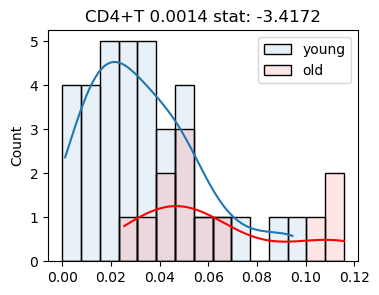

0.0013525375324983785


/tmp/ipykernel_235807/3572379240.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['rolling_average'] = data.val.rolling(6).mean().shift(-3)


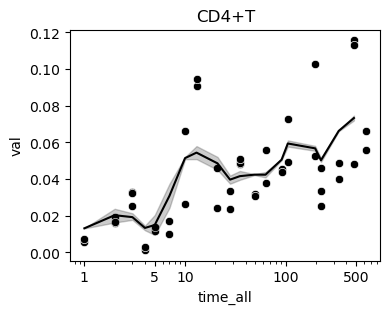

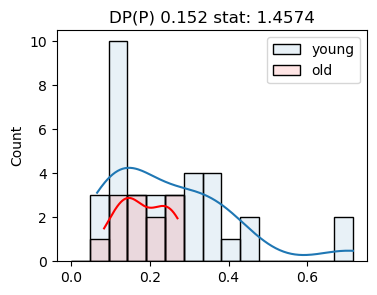

0.15195957926605647


/tmp/ipykernel_235807/3572379240.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['rolling_average'] = data.val.rolling(6).mean().shift(-3)


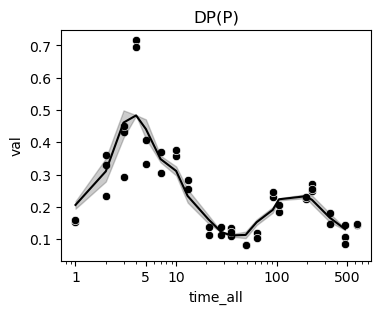

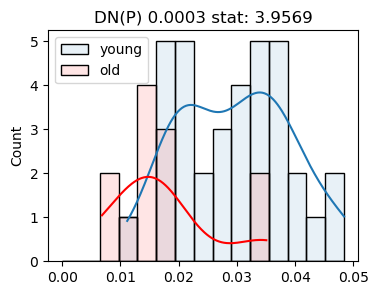

0.00026664767211635027


/tmp/ipykernel_235807/3572379240.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['rolling_average'] = data.val.rolling(6).mean().shift(-3)


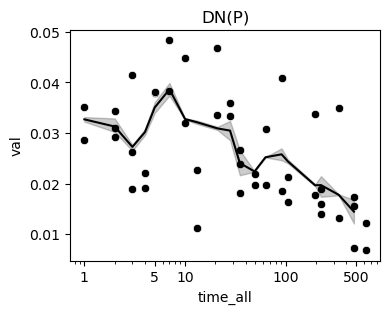

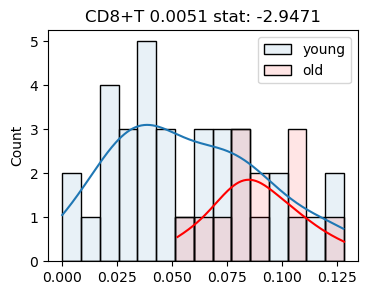

0.005067773613670915


/tmp/ipykernel_235807/3572379240.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['rolling_average'] = data.val.rolling(6).mean().shift(-3)


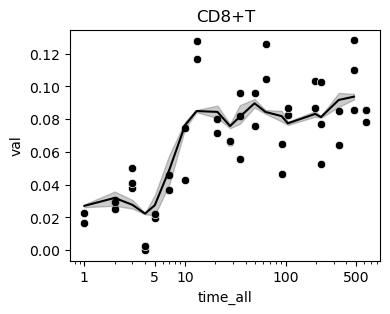

In [101]:
# List to store p-values before correction
pval_pre_correc = []

# Lists to store cell type, value, and time point for each data point
ct_all = []
val_all = []
time_all = []

# Loop through each cell type and its corresponding data
for ct in cell_type_to_ordered:
    for idx in range(len(cell_type_to_ordered[ct])):
        ct_all.append(ct)
        val_all.append(cell_type_to_ordered[ct][idx])
        time_all.append(batch_to_tpt[idx])

# Create a DataFrame from the collected data
scatter_df = pd.DataFrame({'ct': ct_all, 'val': val_all, 'time_all': time_all})

# Iterate over each cell type to perform t-test and generate plots if necessary
for ct in set(ct_all):
    young = cell_type_to_young_old[ct][0]  # Young time point values
    old = cell_type_to_young_old[ct][1]    # Old time point values
    max_val = max(young + old)             # Maximum value for plotting
    stat, pval = scipy.stats.ttest_ind(young, old)  # Perform t-test
    
    # Append p-value before correction
    pval_pre_correc.append(pval)
    
    # Plot histograms and time series data for specific cell types
    if ct in ['DN(P)', 'DP(P)', 'CD4+T', 'CD8+T']:
        # Plot histograms
        fig, ax = plt.subplots(figsize=(4, 3))
        sns.histplot(young, bins=15, binrange=(0, max_val), alpha=0.1, label='young', kde=True, ax=ax)
        sns.histplot(old, bins=15, binrange=(0, max_val), alpha=0.1, label='old', kde=True, color='red', ax=ax)
        plt.legend()
        plt.title(ct + ' ' + str(round(pval, 4)) + ' stat: ' + str(round(stat, 4)))
        plt.savefig(f'{ct}_young_old_neighbors.pdf')
        plt.show()
        print(pval)
        
        # Plot time series data
        fig, ax = plt.subplots(figsize=(4, 3))
        data = scatter_df[scatter_df['ct'] == ct]
        data['rolling_average'] = data.val.rolling(6).mean().shift(-3)
        g = sns.scatterplot(data=data, x='time_all', y='val', ax=ax, color='black')
        g.set(xscale='log', xticks=[1, 5, 10, 100, 500], xticklabels=[1, 5, 10, 100, 500])
        sns.lineplot(data=data, x='time_all', y='rolling_average', color='black')
        plt.savefig(f'{ct}_neighbors_over_time.pdf')
        plt.title(ct)
        plt.show()

In [103]:
# Perform multiple hypothesis testing correction using the Benjamini-Hochberg method
_, corr_p, _, _ = stats.multitest.multipletests(pval_pre_correc, method='fdr_bh')

# Create a dictionary mapping original p-values to corrected p-values
pval_corr_dict = dict(zip(pval_pre_correc, corr_p))
print(pval_corr_dict)

{0.6051949221623603: 0.7104462129732055, 0.0003515172545564309: 0.001898193174604727, 0.0013525375324983785: 0.006086418896242704, 0.5583811264442313: 0.7048501109757093, 0.7102363835511482: 0.7439203610936692, 0.1354752672220696: 0.21516660088211054, 0.15195957926605647: 0.2279393688990847, 0.003657068533842019: 0.012342606301716815, 1.4064311423336023e-06: 3.7973640843007265e-05, 0.011177378459390251: 0.02743538349123062, 0.7163677551272369: 0.7439203610936692, 0.024929252131515662: 0.05609081729591024, 0.6797552293690989: 0.7439203610936692, 0.02860911060926145: 0.05941892203461994, 0.05707684054550467: 0.1100767639091876, 0.00026664767211635027: 0.0017998717867853645, 0.00010680424804527216: 0.0009612382324074495, 0.005067773613670915: 0.015203320841012745, 0.7939150727013524: 0.7939150727013524, 0.5743223126468742: 0.7048501109757093, 0.002225529336467442: 0.008584184583517276, 0.005890783333200254: 0.015905114999640688, 0.103011917148408: 0.17383261018793852, 0.08189523430057742:

## Figure 4E, 4H

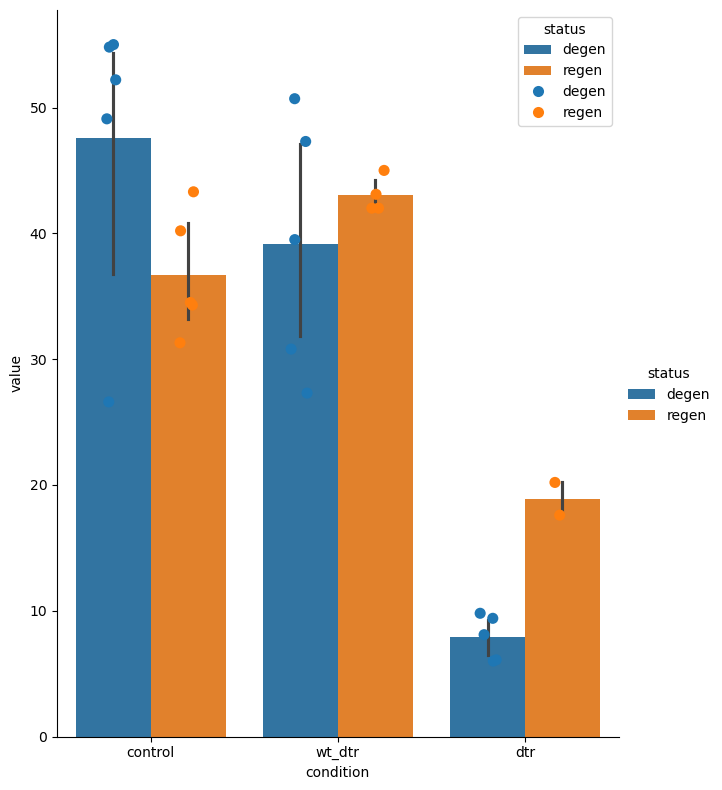

In [104]:
# Summed thymus weight data for different conditions and statuses
# (degeneration or regeneration)

# Thymus weight data for control group (degeneration)
dtr = [9.8, 6, 9.4, 6.1, 8.1] 
wt_dtr = [39.5, 30.8, 27.3, 47.3, 50.7]
control = [49.1, 52.2,  26.6, 55, 54.8]  # DTR untreated

# Thymus weight data for control group (regeneration)
dtr_regen = [17.6, 20.2]
wt_dtr_regen = [43.1, 45, 42, 42]
control_regen = [34.5, 31.3, 43.3, 40.2, 34.3]  # DTR untreated

condition = []
value = []
tissue = []
status = []

# Collecting data for control group (degeneration)
for i in control:
    condition.append('control')
    value.append(i)
    tissue.append('thymus')
    status.append('degen')

# Collecting data for WT DTR group (degeneration)
for i in wt_dtr:
    condition.append('wt_dtr')
    value.append(i)  
    tissue.append('thymus')
    status.append('degen')

# Collecting data for DTR group (degeneration)
for i in dtr:
    condition.append('dtr')
    value.append(i)
    tissue.append('thymus')
    status.append('degen')
   
# Collecting data for control group (regeneration)
for i in control_regen:
    condition.append('control')
    value.append(i)
    tissue.append('thymus')
    status.append('regen')

# Collecting data for WT DTR group (regeneration)
for i in wt_dtr_regen:
    condition.append('wt_dtr')
    value.append(i)  
    tissue.append('thymus')
    status.append('regen')

# Collecting data for DTR group (regeneration)
for i in dtr_regen:
    condition.append('dtr')
    value.append(i)
    tissue.append('thymus')
    status.append('regen')

# Creating a DataFrame from collected data
df = pd.DataFrame.from_dict({'condition':condition, 'value':value, 'tissue':tissue, 'status':status})

# Plotting
p = sns.catplot(data=df, x='condition', y='value', kind='bar', hue='status', height=8, aspect=0.8, edgecolor='k')
sns.stripplot(data=df, x="condition", y="value", hue='status', dodge=True, size=8, c='k')

# Saving the plot
plt.savefig('fig_test.pdf')


In [105]:
import scipy.stats

# Perform independent two-sample t-tests for various groups

# T-test between DTR and WT DTR groups (degeneration)
t_statistic_dtr_wt_dtr, p_value_dtr_wt_dtr = scipy.stats.ttest_ind(dtr, wt_dtr)
print("T-test between DTR and WT DTR groups (degeneration):")
print("Statistic:", t_statistic_dtr_wt_dtr)
print("p-value:", p_value_dtr_wt_dtr)
print()

# T-test between DTR and Control groups (degeneration)
t_statistic_dtr_control, p_value_dtr_control = scipy.stats.ttest_ind(dtr, control)
print("T-test between DTR and Control groups (degeneration):")
print("Statistic:", t_statistic_dtr_control)
print("p-value:", p_value_dtr_control)
print()

# T-test between WT DTR and Control groups (degeneration)
t_statistic_wt_dtr_control, p_value_wt_dtr_control = scipy.stats.ttest_ind(wt_dtr, control)
print("T-test between WT DTR and Control groups (degeneration):")
print("Statistic:", t_statistic_wt_dtr_control)
print("p-value:", p_value_wt_dtr_control)
print()

# T-test between DTR (regeneration) and DTR (degeneration) groups
t_statistic_dtr_regen_dtr, p_value_dtr_regen_dtr = scipy.stats.ttest_ind(dtr_regen, dtr)
print("T-test between DTR (regeneration) and DTR (degeneration) groups:")
print("Statistic:", t_statistic_dtr_regen_dtr)
print("p-value:", p_value_dtr_regen_dtr)


T-test between DTR and WT DTR groups (degeneration):
Statistic: -6.794226879252349
p-value: 0.00013863732838090758

T-test between DTR and Control groups (degeneration):
Statistic: -7.341046598116647
p-value: 8.063062295271508e-05

T-test between WT DTR and Control groups (degeneration):
Statistic: -1.2021948913442322
p-value: 0.26366209447934424

T-test between DTR (regeneration) and DTR (degeneration) groups:
Statistic: 7.333770569061809
p-value: 0.0007393037949570476


## Figure 4F

In [2]:
# Define lists of puck names for control and DTR (degeneration) groups
control = ['2023-06-16_Puck_230117_08', '2023-06-16_Puck_230117_10']
dtr = ['2023-06-16_Puck_230117_11', '2023-06-16_Puck_230117_12']

# Dictionary to map puck names to experimental conditions (control or DTR)
puck_name_to_condition = {
    '2023-06-16_Puck_230117_08': 'control',
    '2023-06-16_Puck_230117_10': 'control',
    '2023-06-16_Puck_230117_11': 'dtr',
    '2023-06-16_Puck_230117_12': 'dtr'
}

# Dictionary to store all pucks and adata objects
all_pucks = {}
all_adata = {}

# Flag to indicate if adata objects have been updated
updated_adata = False

# Iterate over all puck names in control and DTR groups
for puck_name in tqdm(control + dtr):

    try:
        # Attempt to load puck from disk
        pk = load_puck(puck_name, direc_name=directory)
        all_pucks[puck_name] = pk
    except:
        # If puck data not available, download and create puck
        download_data(puck_name, data_direc=directory)
        pk = make_puck(puck_name, directory_slideseq=directory)
        save_puck(slideseq_name=puck_name, puck=pk, direc_name=directory)

    try:
        # Attempt to load adata object from disk
        adata = load_adata(puck_name+'_cortex_medulla', directory_slideseq=directory)
    except:
        # If adata not available, create adata from puck data
        adata = make_adata(puck_name, pk)

    try:
        # Check if 'x' and 'y' coordinates are present in adata
        adata.obs['x']
    except:
        # If 'x' and 'y' coordinates not present, add them to adata
        bcs = adata.obs.index
        locs = [pk.bc_loc_dict_s1[pk.matched_bead_barcodes[i]] for i in bcs]
        adata.obs['x'], adata.obs['y'] = zip(*locs)
        all_adata[puck_name] = adata
        updated_adata = True

    if updated_adata:
        # If adata has been updated, write it to disk
        results_file = '{}.h5ad'.format(puck_name)
        adata.write(results_file)
        updated_adata = False

    # Store the adata object in the dictionary
    all_adata[puck_name] = adata


100%|██████████| 4/4 [06:29<00:00, 97.26s/it] 


In [3]:
control = ['2023-06-16_Puck_230117_08', '2023-06-16_Puck_230117_10']
dtr = ['2023-06-16_Puck_230117_11', '2023-06-16_Puck_230117_12']
puck_names_use = control+dtr

In [5]:
# Initialize dictionaries and lists to store data
record = {}  # Stores diversity values for each puck
record_all_div = {}  # Stores overall diversity values for each puck
exvar_recorder = {}  # Stores additional variables for each puck
all_diversity_values = []  # Stores all diversity values

loc_to_v_all = {}  # Dictionary to store V gene hits for each location
loc_to_j_all = {}  # Dictionary to store J gene hits for each location
loc_to_clone_all = {}  # Dictionary to store clones for each location
clone_to_loc_all = {}  # Dictionary to store locations for each clone
cort_loc_to_diversity_all = {}  # Dictionary to store diversity for each cortical location

# Loop through each puck
for slideseq_name in tqdm(puck_names_use):
    
    # Extract relevant data
    puck_name = slideseq_name
    !/apps/released/built-by-outside-authors-x86linuxtarget/gcloud/gcloud-420.0.0/google-cloud-sdk/bin/gsutil cp -n gs://fc-secure-2423a594-f5fe-40c6-b998-f28ac17ea012/{slideseq_name}_cortex_medulla.csv ./scratch/publication/
    !/apps/released/built-by-outside-authors-x86linuxtarget/gcloud/gcloud-420.0.0/google-cloud-sdk/bin/gsutil cp -n gs://fc-secure-2423a594-f5fe-40c6-b998-f28ac17ea012/{slideseq_name}/{slideseq_name[11:]}_B.csv ./scratch/publication/

    !/apps/released/built-by-outside-authors-x86linuxtarget/gcloud/gcloud-420.0.0/google-cloud-sdk/bin/gsutil cp -n gs://macosko_data/libraries/{slideseq_name}/{slideseq_name}_cortex_medulla.csv ./scratch/publication/
    !/apps/released/built-by-outside-authors-x86linuxtarget/gcloud/gcloud-420.0.0/google-cloud-sdk/bin/gsutil cp -n gs://macosko_data/libraries/{slideseq_name}/{slideseq_name[11:]}_B.csv ./scratch/publication/

    adata = all_adata[slideseq_name]
    abbrev_name = slideseq_name[11:]
    df = pd.read_csv(directory + abbrev_name + '_B.csv')
    csv_name = abbrev_name + '_B.csv'
    cortex_medulla_df = pd.read_csv(f'{directory}{slideseq_name}_cortex_medulla.csv')
    bcs = cortex_medulla_df.barcode
    bc_loc_dict_s1 = batch_to_bc_loc_dict[slideseq_name]
    matched_bead_barcodes_dict = batch_to_matched_bead_barcodes_dict[slideseq_name]
    locs = [bc_loc_dict_s1[matched_bead_barcodes_dict[i]] for i in bcs]
    cortex_medulla_df['locations'] = locs
    
    # Create dictionaries for barcode-to-region and location-to-region mappings
    loc_to_bc_s1 = {bc_loc_dict_s1[i]: i for i in bc_loc_dict_s1}
    loc_to_cm = {i: j for i, j in zip(cortex_medulla_df.locations, cortex_medulla_df.region)}
    bc_to_cm = {loc_to_bc_s1[i]: loc_to_cm[i] for i in loc_to_cm}
    bc_cortex = [bc for bc in bc_to_cm if bc_to_cm[bc] == 'cortex']
    bc_medulla = [bc for bc in bc_to_cm if bc_to_cm[bc] == 'medulla']
    bc_both = bc_cortex + bc_medulla
    bc_all = [bc for bc in matched_bead_barcodes.values()]
    locs_medulla = [bc_loc_dict_s1[i] for i in bc_medulla]
    locs_cortex = [bc_loc_dict_s1[i] for i in bc_cortex]

    # Initialize variables for diversity calculation
    loc_to_clone = {}
    clone_to_loc = {}
    loc_to_j = {}
    loc_to_v = {}

    # Iterate through each row in the dataframe to populate dictionaries
    for index, row in df.iterrows():
        clone = row['cdr3']
        loc = (float(row['x']), float(row['y']))

        # Initialize lists in dictionaries if not already present
        if loc not in loc_to_clone:
            loc_to_clone[loc] = []
        if loc not in clone_to_loc:
            clone_to_loc[clone] = []
        if loc not in loc_to_j:
            loc_to_j[loc] = [] 
        if loc not in loc_to_v:
            loc_to_v[loc] = [] 

        # Append values to lists in dictionaries
        loc_to_clone[loc].append(clone)
        clone_to_loc[clone].append(loc)
        loc_to_v[loc].append(row['allVHitsWithScore'])
        loc_to_j[loc].append(row['allJHitsWithScore'] )

    # Filter loc_to_clone to include only locations with a minimum number of TCRs within a certain radius
    all_tcr_locs = list(loc_to_clone.keys())
    point_tree = cKDTree(all_tcr_locs)
    diversity = []
    num_neighbors = 20
    all_tcr_locs_keep = []
    for point in all_tcr_locs:
        idx_closeby_points = point_tree.query_ball_point(point, r=200/0.65)
        if len(idx_closeby_points) < 5:
            continue
        dist, idx = point_tree.query(point, num_neighbors)
        close_pts = [all_tcr_locs[i] for i in idx]
        close_clones = [loc_to_clone[i] for i in close_pts]
        close_clones = list(itertools.chain.from_iterable(close_clones))
        fractions = [i / len(close_clones) for i in list(Counter(close_clones).values())]
        diversity.append(skbio.diversity.alpha.shannon(fractions))
        all_tcr_locs_keep.append(point)

    # Update all_tcr_locs with filtered locations
    all_tcr_locs = copy.deepcopy(all_tcr_locs_keep)

    # Calculate overall diversity score
    all_tcr_clones = [loc_to_clone[i] for i in all_tcr_locs]
    all_tcr_clones = list(itertools.chain.from_iterable(all_tcr_clones))
    if len(all_tcr_locs) < num_neighbors:
        continue
    all_tcr_clones = random.sample(all_tcr_clones, num_neighbors)
    all_fractions = [i / len(all_tcr_clones) for i in list(Counter(all_tcr_clones).values())]
    record_all_div[slideseq_name] = skbio.diversity.alpha.shannon(all_fractions)

    # Plot all TCRs
    all_tcr_locs = set(all_tcr_locs)
    all_tcr_locs_filt, div_filt = zip(*[[i, j] for i, j in zip(all_tcr_locs, diversity) if i in locs_cortex])
    x, y = zip(*all_tcr_locs_filt)
    fig = plt.figure(figsize=(5, 5))
    p = plt.scatter(x, y, c=div_filt, cmap='inferno', vmin=3.3, vmax=5.4)
    plt.axis('off')
    cb_ax = fig.add_axes([.91, .124, .04, .754])
    fig.colorbar(p, orientation='vertical', cax=cb_ax)
    plt.title(csv_name + ' ' + slideseq_name)
    plt.xlim([0, 5000])
    plt.ylim([0, 5000])
    plt.show()

    # Update record with diversity values
    if slideseq_name not in record:
        record[slideseq_name] = []
    record[slideseq_name] = record[slideseq_name] + diversity

    # Populate exvar_recorder with additional variables
    exvar_recorder = {}
    exvar_recorder['barcode'] = [loc_to_bc_s1[i] for i in all_tcr_locs]
    exvar_recorder['x'] = [i[0] for i in all_tcr_locs]
    exvar_recorder['y'] = [i[1] for i in all_tcr_locs]
    exvar_recorder['diversity'] = diversity
    exvar_recorder['diversity_binar'] = [1 if i > 4.48 else 0 for i in diversity]
    exvar_recorder['diversity_norm'] = [(i - 3.74) / 1.69 for i in diversity]

    # Convert exvar_recorder to DataFrame and save to CSV
    loc_to_diversity = {i: j for i, j in zip(all_tcr_locs, diversity)}
    df = pd.DataFrame.from_dict(exvar_recorder)
    df.to_csv(f'{puck_name}_diversity.csv')

    # Calculate and store cortical diversity
    cort_loc_to_diversity = dilate_cortex_points(bc_cortex, bc_medulla, bc_loc_dict_s1,
                                                 loc_to_bc_s1, matched_bead_barcodes, locs_cortex, filt_plot=True)
    cort_loc_to_diversity_all[puck_name] = cort_loc_to_diversity
    loc_to_clone_all[puck_name] = loc_to_clone
    clone_to_loc_all[puck_name] = clone_to_loc
    loc_to_v_all[puck_name] = loc_to_v
    loc_to_j_all[puck_name] = loc_to_j


  0%|          | 0/4 [00:00<?, ?it/s]

CommandException: No URLs matched: gs://fc-secure-2423a594-f5fe-40c6-b998-f28ac17ea012/2023-06-16_Puck_230117_08_cortex_medulla.csv
CommandException: No URLs matched: gs://fc-secure-2423a594-f5fe-40c6-b998-f28ac17ea012/2023-06-16_Puck_230117_08/Puck_230117_08_B.csv
CommandException: No URLs matched: gs://macosko_data/libraries/2023-06-16_Puck_230117_08/2023-06-16_Puck_230117_08_cortex_medulla.csv


Exception ignored in: <function _releaseLock at 0x7f26cfa375e0>
Traceback (most recent call last):
  File "/PHShome/sx931/.conda/envs/aging-thymus/lib/python3.8/logging/__init__.py", line 223, in _releaseLock
    def _releaseLock():
KeyboardInterrupt: 


CommandException: No URLs matched: gs://macosko_data/libraries/2023-06-16_Puck_230117_08/Puck_230117_08_B.csv


  0%|          | 0/4 [01:07<?, ?it/s]


FileNotFoundError: [Errno 2] No such file or directory: './scratch/publication/Puck_230117_08_B.csv'

## Figure 4G

In [112]:
# Iterate over each puck name in the combined list of control and DTR groups
for puck_name in tqdm(control + dtr):
    # Retrieve the corresponding adata object for the current puck
    adata = all_adata[puck_name]
    adata.rctd = pd.read_csv(directory + '/' + puck_name + '_RCTD_results.csv')


100%|██████████| 4/4 [00:00<00:00, 18.06it/s]


In [113]:
# Specify the cell type for which DE (Differential Expression) analysis will be performed
cell_type = 'DP(P)'

# Initialize lists to store cells before and after treatment
cells_before = []
cells_after = []

# Initialize lists to store filtered adata objects for control and DTR groups
adata_ctrl = []
adata_dtr = []

# Iterate over each puck in the combined list of control and DTR groups
for puck_name in tqdm(control + dtr):
    # Retrieve the corresponding adata object for the current puck
    adata = all_adata[puck_name]
    
    # Filter the RCTD results to include only singlet cells of the specified cell type
    adata.rctd_filt = adata.rctd[adata.rctd.spot_class == 'singlet']
    adata.rctd_filt = adata.rctd_filt[adata.rctd_filt.first_type == cell_type]
    
    # Extract barcodes of the filtered cells
    bcs = adata.rctd_filt['Unnamed: 0']
    bcs = list([i[:-2] + '-1' for i in bcs])  # Adjust barcode format if necessary
    
    # Filter the adata object to include only the cells identified by the barcodes
    adata_filt = adata[adata.obs.index.isin(bcs)]
    
    # Depending on the group (control or DTR), append the filtered adata object to the respective list
    if puck_name in control:
        adata_ctrl.append(adata_filt)
    elif puck_name in dtr:
        adata_dtr.append(adata_filt)


100%|██████████| 4/4 [00:00<00:00,  7.53it/s]


Counter({'control': 5649, 'dtr': 1015})


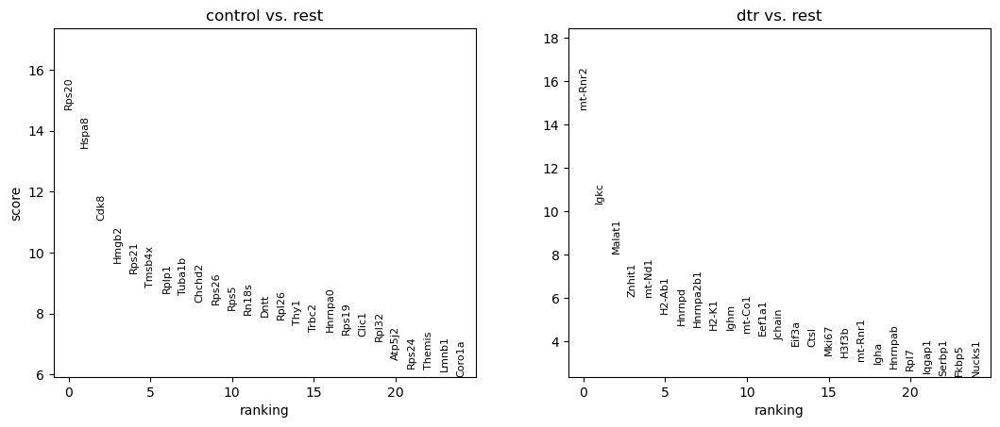

In [115]:
# Merge the filtered adata objects for control group
adata_ctrl_merged = ad.concat(adata_ctrl)

# Merge the filtered adata objects for DTR group
adata_dtr_merged = ad.concat(adata_dtr)

# Add 'condition' column to specify the group (control or DTR)
adata_ctrl_merged.obs['condition'] = 'control'
adata_dtr_merged.obs['condition'] = 'dtr'

# Concatenate the merged adata objects for control and DTR groups
adata_all = ad.concat([adata_ctrl_merged, adata_dtr_merged])

# Print the counts of each condition to verify the merging
print(Counter(adata_all.obs.condition))

# Perform differential expression analysis using Wilcoxon rank-sum test
sc.tl.rank_genes_groups(adata_all, 'condition', method='wilcoxon', key_added='wilcoxon')

# Visualize the top 25 genes ranked by the Wilcoxon test results
sc.pl.rank_genes_groups(adata_all, n_genes=25, sharey=False, key="wilcoxon")


20259
20216
Igkc 2.5255175 20.83610753367502
Ighm 0.8090619 2.6197806769464584
Jchain 2.3439088 1.7432873210124302


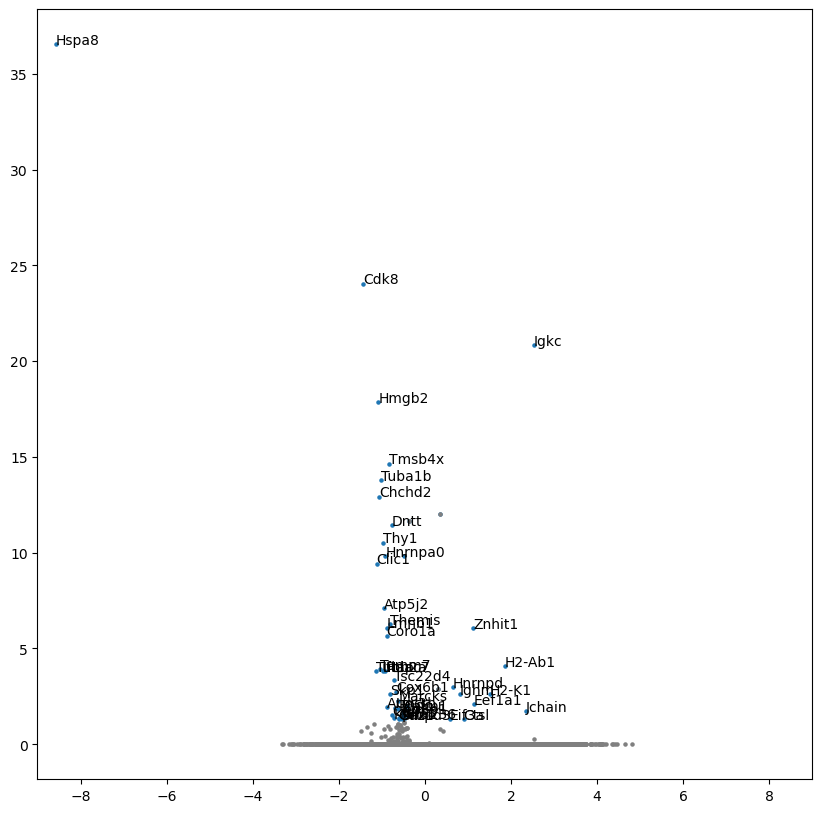

In [126]:
# Extract relevant data from adata_all
adata_filt = adata_all

# Extract names, p-values, and log fold changes from the 'wilcoxon' key in adata_filt.uns
names = adata_filt.uns['wilcoxon']['names']
gene_names = [i[1] for i in names]

pval_adj = adata_filt.uns['wilcoxon']['pvals_adj']
pval = [i[1] for i in pval_adj]

# Adjust p-values and handle cases where p-value is 0
pval = [-np.log10(i) if i != 0 else -np.log10((min([i for i in pval if i != 0]))) for i in pval]

lfc = adata_filt.uns['wilcoxon']['logfoldchanges']
lfc = [i[1] for i in lfc]
print(len(pval))

# Remove mitochondrial and ribosomal genes from analysis
gpl = {g: (p, l) for g, (p, l) in zip(gene_names, zip(pval, lfc))}
gpl_filt = {k: gpl[k] for k in gpl if k[0:3] != 'mt-'}
gpl_filt = {k: gpl[k] for k in gpl if k[0:3] != 'Rpl'}
gpl_filt = {k: gpl[k] for k in gpl if k[0:3] != 'Rps'}
gene_names = list(gpl_filt.keys())
pval = [i[0] for i in gpl_filt.values()]
lfc = [i[1] for i in gpl_filt.values()]
print(len(pval))

# Extract scores and filter genes based on predefined criteria
scores = adata_filt.uns['wilcoxon']['scores']
lfc_filt = []
pval_filt = []
frac_exp_filt = []
gene_names_updated = []
for i, txt in enumerate(gene_names):  # filter for genes in sample
    if 'Rpl' in txt:
        continue
    if 'Rps' in txt:
        continue
    if 'mt-' in txt:
        continue
    lfc_filt.append(lfc[i])
    pval_filt.append(pval[i])
    gene_names_updated.append(txt)
gene_names = copy.deepcopy(gene_names_updated)

# Plot volcano plot with annotated significant genes
fig, ax = plt.subplots(figsize=(10, 10))
lfc_sig, pval_sig = zip(*[(i, j) for i, j in zip(lfc_filt, pval_filt) if ((j > -np.log10(0.05)) and (np.abs(i) > 0.1))])
plt.scatter(lfc_sig, pval_sig, s=5)

lfc_insig, pval_insig = zip(*[(i, j) for i, j in zip(lfc_filt, pval_filt) if ((j <= -np.log10(0.05)) or (np.abs(i) < 0.4))])
plt.scatter(lfc_insig, pval_insig, c='gray', s=5)

# Annotate significant genes
record_all_annotated_genes = {}
for i, txt in enumerate(gene_names):
    if pval_filt[i] < -np.log10(0.05):
        continue
    if np.abs(lfc_filt[i]) > 0.5:
        if pval_filt[i] > -np.log10(0.05):
            if txt in ["Ighm", "Jchain", "Igkc"]:
                print(txt, lfc_filt[i], pval_filt[i])
            ax.annotate(txt, (lfc_filt[i], pval_filt[i]))
            record_all_annotated_genes[txt] = [lfc_filt[i], pval_filt[i]]
    if np.abs(lfc_filt[i]) >= 9:
        print(txt, lfc_filt[i], pval_filt[i])

plt.xlim([-9, 9])
plt.savefig('volcano_de_div.pdf')


In [129]:
pval_Igkc = 10**-20.83610753367502
print(pval_Igkc) 

pval_Ighm = 10**-2.6197806769464584
print(pval_Ighm)  

pval_Jchain = 10**-1.7432873210124302
print(pval_Jchain)  

1.4584530946479263e-21
0.002400044659561444
0.018059789292040565


## Figure 4I, 4J

100%|██████████| 4/4 [00:00<00:00, 20.59it/s]


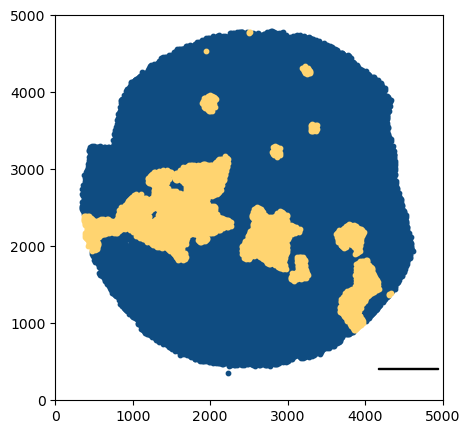

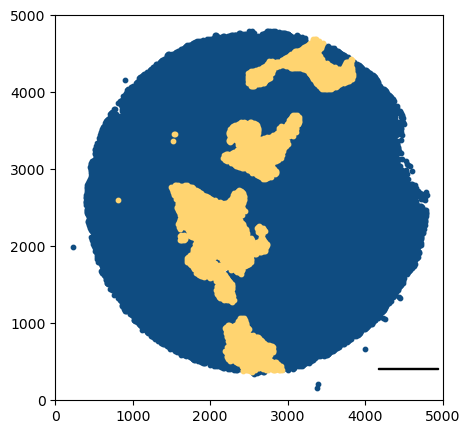

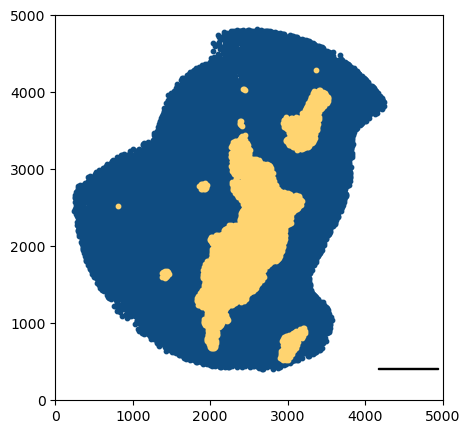

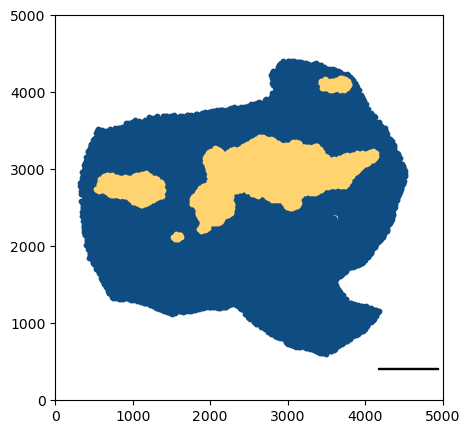

In [135]:
# Iterate over each puck in the control and dtr groups
for puck_name in tqdm(control + dtr):
    # Get the adata and puck corresponding to the current puck name
    adata = all_adata[puck_name]
    puck = all_pucks[puck_name]

    # Call the function to plot cortex and medulla regions for the current puck
    plot_cortex_medulla(adata)

100%|██████████| 4/4 [00:01<00:00,  2.86it/s]


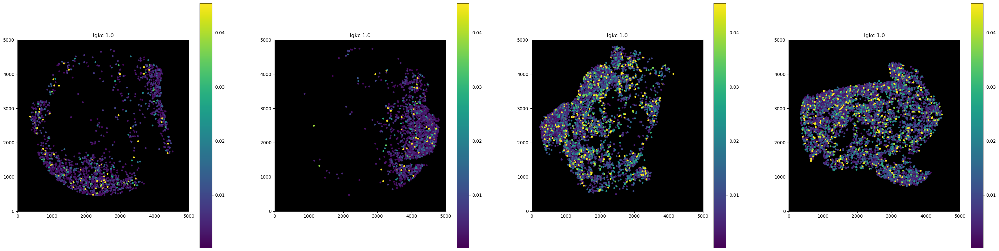

In [130]:
# Define pucks to plot and genes of interest
pucks_to_plot = control + dtr
genes_to_plot = ['Igkc']  # Add more genes here if needed

# Initialize dictionaries to store calculated values for vmax and vmin
vmax_calc = {i: [] for i in genes_to_plot}
vmin_calc = {i: [] for i in genes_to_plot}

# Initialize dictionaries to store final vmax and vmin values
vmax_for_genes = {i: 0 for i in genes_to_plot}
vmin_for_genes = {i: 0 for i in genes_to_plot}

# Initialize dictionaries to store aggregated x and y coordinates, filtered adata, and total counts
all_x_agg = {}
all_y_agg = {}
all_adata_filt = {}
all_total_counts = {}

# Calculate vmax and vmin values for each gene
for pn in tqdm(pucks_to_plot):
    adata = all_adata[pn]
    puck = all_pucks[pn]
    
    all_x = [i[0] for i in puck.bc_loc_dict_s1.values()]
    all_y = [i[1] for i in puck.bc_loc_dict_s1.values()]
    
    all_x_agg[pn] = all_x
    all_y_agg[pn] = all_y
    
    adata = adata[adata.obs['cortex_medulla'].isin(['cortex', 'medulla'])]  # Clean up areas outside tissue
    all_adata_filt[pn] = adata
    
    total_counts_per_cell = np.sum(adata.X, axis=1)
    all_total_counts[pn] = total_counts_per_cell

    for gene_name in genes_to_plot:
        gene_filt = puck.s1_dge_fmtd_norm[gene_name]
        gene_filt = [val for val in gene_filt if val > 0]  # Filter out zero values
        
        vmax_calc[gene_name] += gene_filt
        vmin_calc[gene_name] += gene_filt

# Set percentile values for plotting visualization
vmax_for_genes = {i: np.percentile(vmax_calc[i], 95) for i in vmax_calc}  # 95th percentile for vmax
vmin_for_genes = {i: np.percentile(vmin_calc[i], 0) for i in vmin_calc}  # 0th percentile for vmin

# Plotting
plt.figure(figsize=(len(pucks_to_plot) * 10, len(genes_to_plot) * 10))
plt.subplots_adjust(hspace=0.5)
plt_cter = 1
control_cts = []
dtr_cts = []
control_cts_all = []
dtr_cts_all = []

for pn in tqdm(pucks_to_plot):
    puck = all_pucks[pn]
    all_x = all_x_agg[pn]
    all_y = all_y_agg[pn]
    adata = all_adata_filt[pn]  # Filtered adata
    
    for gene_name in genes_to_plot:
        ax = plt.subplot(len(genes_to_plot), len(pucks_to_plot), plt_cter, facecolor='black')
        ax.scatter(all_x, all_y, c='black', s=10)  # Plot cell locations
        
        gene_filt = puck.s1_dge_fmtd_norm[gene_name]
        gene_filt = [val for index, val in enumerate(gene_filt) if val > 0]  # Filter out zero values
        
        # Aggregate nonzero gene counts
        if pn in control:
            control_cts_all += list(gene_filt)
        elif pn in dtr:
            dtr_cts_all += list(gene_filt)
        
        # Plot nonzero gene counts
        gene_len = len(gene_filt)
        bc_indices = [index for index, val in enumerate(gene_filt) if val > 0]
        x = [adata.obs['x'][i] for i in bc_indices]
        y = [adata.obs['y'][i] for i in bc_indices]
        
        vmax_calc[gene_name] += gene_filt
        
        s = ax.scatter(x, y, c=gene_filt, s=10, cmap='viridis', vmin=vmin_for_genes[gene_name],
                       vmax=vmax_for_genes[gene_name])
        
        ax.set_title(gene_name + ' ' + str(len(gene_filt) / gene_len))  # Title with nonzero gene count ratio
        
        plt_cter += 1
        ax.set_xlim([0, 5000])
        ax.set_ylim([0, 5000])
        ax.set_aspect('equal')
        
        # Add colorbar
        plt.colorbar(s, ax=ax)
        
    # Aggregate nonzero gene counts for control and dtr pucks
    if pn in control:
        control_cts = control_cts + gene_filt
    elif pn in dtr:
        dtr_cts = dtr_cts + gene_filt

plt.savefig('test.pdf')  # Save the figure


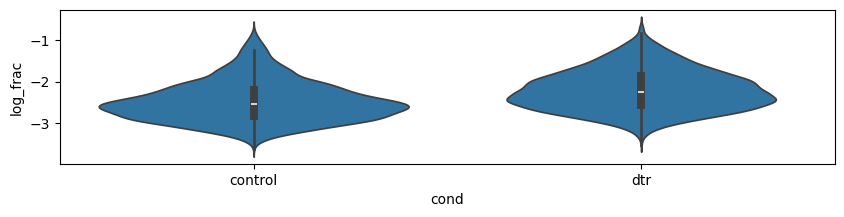

In [131]:
# Initialize lists to store gene expression fractions and conditions
frac_exp = []
condition = []

# Create a dictionary to store gene expression fractions and conditions
plot_dict = {'frac': frac_exp, 'cond': condition}

# Add gene expression fractions and corresponding conditions for control pucks
for val in control_cts:
    plot_dict['frac'].append(val)
    plot_dict['cond'].append('control')

# Add gene expression fractions and corresponding conditions for dtr pucks
for val in dtr_cts:
    plot_dict['frac'].append(val)
    plot_dict['cond'].append('dtr')

# Convert the dictionary into a pandas DataFrame
plot_df = pd.DataFrame.from_dict(plot_dict)

# Calculate the logarithm of gene expression fractions
plot_df['log_frac'] = np.log10(frac_exp)

# Create a violin plot
plt.figure(figsize=(10, 2))
sns.violinplot(data=plot_df, y="log_frac", x="cond")

# Save the violin plot as a PDF file
plt.savefig('dpp_igkc_violin_plot.pdf')


In [133]:
# Perform an independent two-sample t-test between control and dtr groups
# Extract the log-transformed gene expression fractions for control group
control_log_frac = plot_df[plot_df.cond == 'control'].log_frac

# Extract the log-transformed gene expression fractions for dtr group
dtr_log_frac = plot_df[plot_df.cond == 'dtr'].log_frac

# Perform the t-test
t_statistic, p_value = scipy.stats.ttest_ind(control_log_frac, dtr_log_frac)

# Print the results
print("T-Statistic:", t_statistic)
print("P-Value:", p_value)


T-Statistic: -29.779370425363513
P-Value: 1.7537212565308279e-189
